# To make my life a bit easier...

In [1]:
def plot_sed(x, y, yerr):
    plt.clf()
    plt.errorbar(wavelength, flux, yerr=flux_err, c='red', ecolor='gray', capthick=2)
    plt.show()

In [16]:
def print_time(begin_time, end_time):
    """ 
    This function prints the time in minutes that a certain task took.
    """
    print ("--------------------------------------------------")
    print ("CPU process time: %.2f [min]" % float((end-start)/60))
    print ("--------------------------------------------------")

# Packages

### General packages

In [2]:
import numpy             as np
import pandas            as pd
import matplotlib.pyplot as plt
import seaborn           as sns
import astropy.io.fits   as pf
import astropy.constants as ct
import os
import time
import scipy.interpolate as sci
import ipywidgets        as widgets

### pPXF imports

In [3]:
import ppxf.miles_util   as lib  # MILES library embedded in ppxf
import ppxf.ppxf_util    as util
import ppxf              as ppxf_module
from ppxf.ppxf           import ppxf
from ppxf.ppxf_util      import log_rebin

# Config. inputs

### Paths and files

In [4]:
seds_path    = '../../../../GAMADR3_SPECTRA/DATABASE/'
results_path = '../../LargeFilesResults/PSM_analysis/'
ppxf_dir     = os.path.dirname(os.path.realpath(ppxf_module.__file__))
miles_lib    = ppxf_dir+'/miles_models/Mun1.30*.fits'

In [5]:
data          = pd.read_csv('uv_redseq_psmed_oneneighbor_magphys.csv')

In [6]:
seds_list = []
for i in data['SPECID']: seds_list.append(i+'.fit')

### Constants

In [7]:
light_speed = float(str(ct.c.to('km/s')).split(' ')[0])            # selecting the numerical values 
                                                                   # (must be in km/s)
gama_resol  = 1300.

# Plot parameters (because I'm lazy)

In [8]:
plotpars = {'axes.linewidth': 1.,
            'axes.labelsize': 18,
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
            'legend.framealpha': 0.6,
            'legend.loc': 'upper right',
            'legend.fontsize': 12,
            }

In [9]:
palette      = ['#ef8a62','#f7f7f7','#67a9cf']
transparency = 0.8
lw           = 2.

# Spectral fitting

## Configuring inputs

### pPXF "fixed" parameters

In [10]:
# Fit (V, sig, h3, h4) moments=4 for the stars; (V, sig) moments=2 for the two gas kinematic components
moments        = [4, 2, 2]
# degree         = -1         # Additive Legendre polynomial degrees
degree         = 80         # Additive Legendre polynomial degrees
mdegree        = 10         # Multiplicative Legendre polynomial degrees
regul_err      = 0.013      # Desired regularization error -- TODO: MUST CHECK WHY 0.013
tied_balmer    = True
limit_doublets = False
stellar_comp_w = [0]        # weight of the stellar component
balmer_comp_w  = [1]        # weight of the balmer emission lines
forbid_comp_w  = [2]        # weight of the forbidden lines
# wl_min         = 3540       # MILES RANGE MIN
# wl_max         = 7409       # MILES RANGE MAX
wl_min = 4350            # removing the bluest part of the spectra in order to mitigate noise effects
wl_max = 7409

### pPXF loop

In [11]:
bar = widgets.IntProgress(value=0, min=0, max=len(seds_list)+1, step=0.5, description='Running pPXF:',
                          orientation='horizontal')
display(bar)

IntProgress(value=0, description='Running pPXF:', max=139)

In [12]:
mean_age   = ['<logAge>']
mean_metal = ['<[M/H]>']
mass2light = ['MASS2LIGHT_R']
ids        = ['CATAID']
redshifts  = ['Z']
vel_disp   = ['VEL_DISP']

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47675       482     0.002     0.001
 comp.  1:     47482       684
 comp.  2:     47497       144
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00957
method = capfit; Jac calls: 8; Func calls: 168; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.091       7.4   47482   684
Comp:  2       Unknown      1.975       6.5   47497   144
Comp:  2       Unknown          0       6.4   47497   144
Comp:  2       Unknown          0       3.8   47497   144
Comp:  2       Unknown          0       2.7   47497   144
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.21
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.21
M/L_r: 2.569
Current $\chi^2$: 0.0096
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


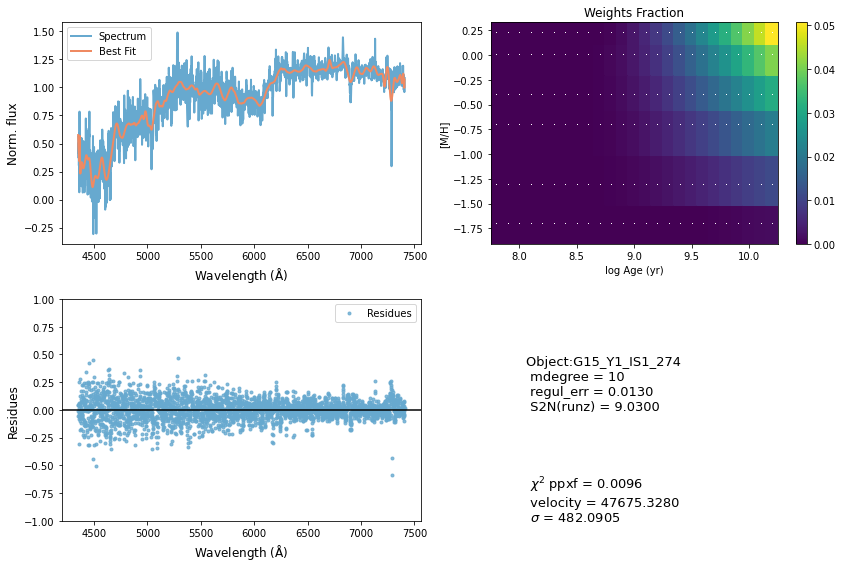

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41877       766    -0.059     0.020
 comp.  1:     43877       180
 comp.  2:     44164       189
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005029
method = capfit; Jac calls: 13; Func calls: 267; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  82 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   43877   180
Comp:  2       Unknown     0.1018       4.2   44164   189
Comp:  2       Unknown      1.304       3.3   44164   189
---------------------------------------------------------
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -0.2
M/L_r: 0.6533
Current $\chi^2$: 0.0050
Elapsed time in PPXF: 3.72 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


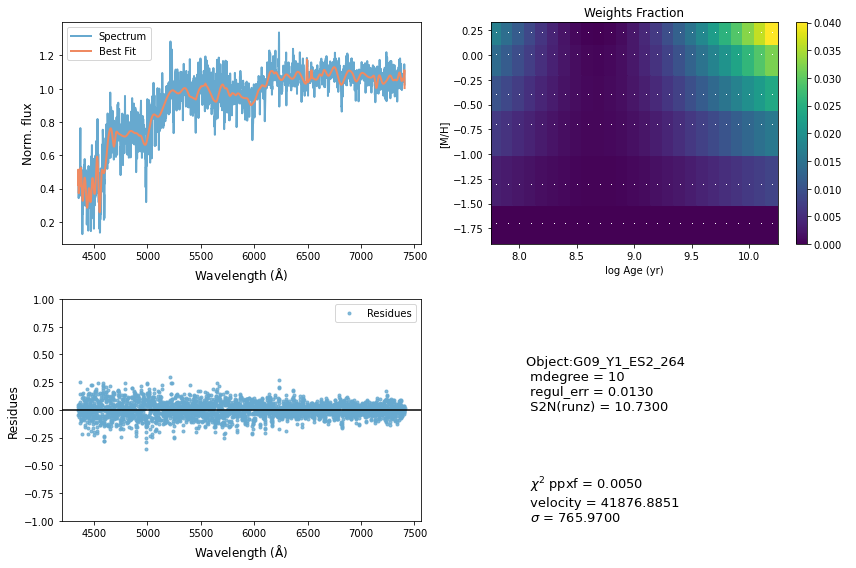

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37911       380     0.004     0.003
 comp.  1:     38020       521
 comp.  2:     38343        97
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00512
method = capfit; Jac calls: 11; Func calls: 225; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.741       6.5   38020   521
Comp:  2       Unknown          0       3.2   38343    97
Comp:  2       Unknown     0.2946         2   38343    97
---------------------------------------------------------
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.199
M/L_r: 2.107
Current $\chi^2$: 0.0051
Elapsed time in PPXF: 3.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


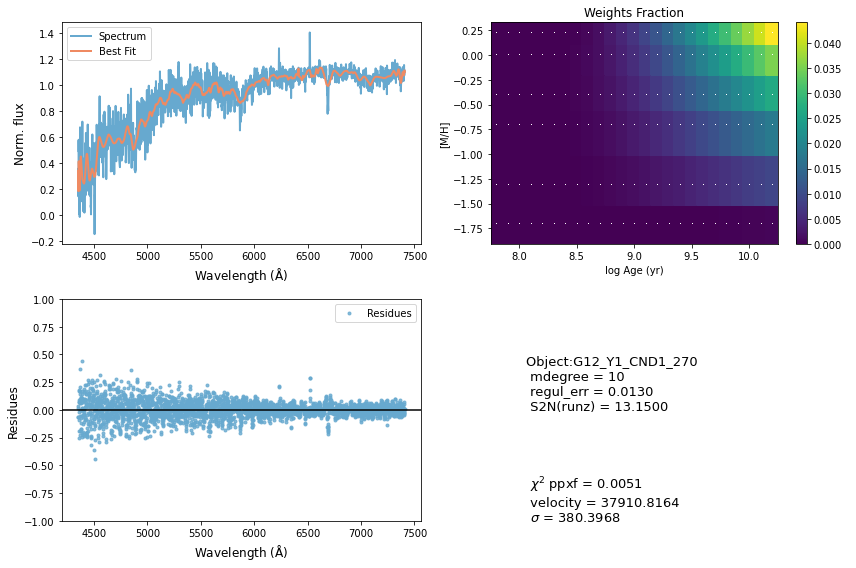

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37435      1000     0.011     0.020
 comp.  1:     39362       100
 comp.  2:     39147       180
Gas Reddening E(B-V): 3.845
chi2/DOF: 0.01202
method = capfit; Jac calls: 6; Func calls: 125; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3342       1.7   39362   100
Comp:  2       Unknown          0       3.8   39147   180
Comp:  2       Unknown          0       2.8   39147   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.6
Weighted <[M/H]>: -0.167
Weighted <logAge> [yr]: 8.6
Weighted <[M/H]>: -0.167
M/L_r: 0.3746
Current $\chi^2$: 0.0120
Elapsed time in PPXF: 1.75 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


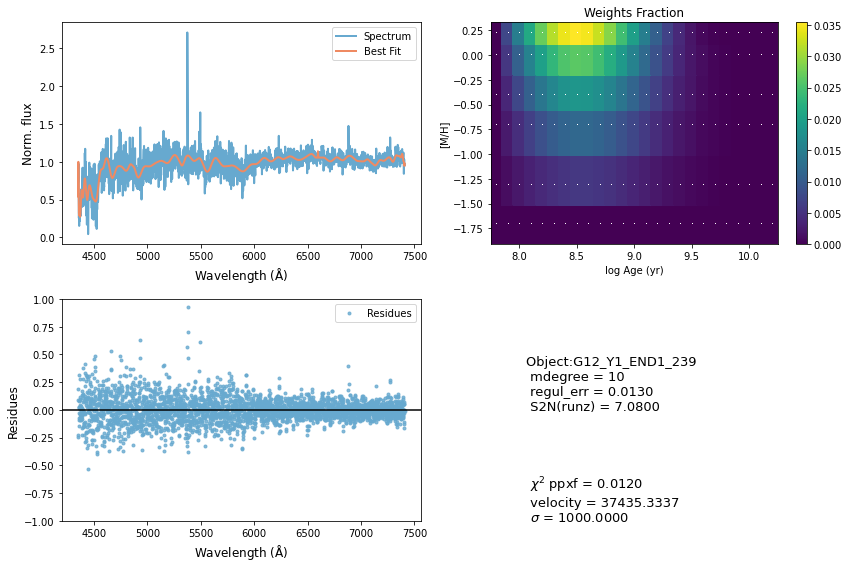

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     66973       180     0.000     0.000
 comp.  1:     66973       180
 comp.  2:     66973       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006642
method = capfit; Jac calls: 1; Func calls: 28; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       0.17       4.2   66973   180
Comp:  2       Unknown          0       6.5   66973   180
Comp:  2       Unknown     0.6398       6.6   66973   180
Comp:  2       Unknown          0       3.8   66973   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.142
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.142
M/L_r: 5.846
Current $\chi^2$: 0.0066
Elapsed time in PPXF: 0.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


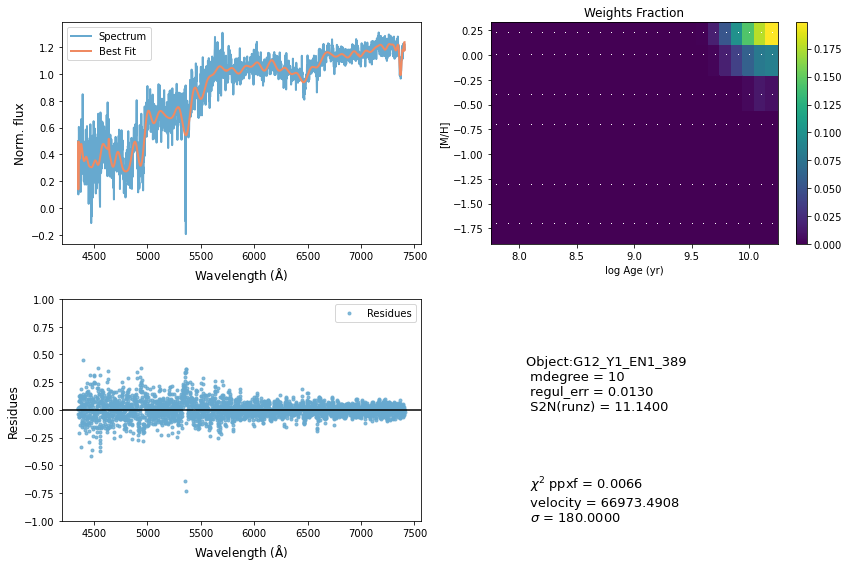

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35205       465    -0.018    -0.005
 comp.  1:     34743       228
 comp.  2:     34424       111
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.01823
method = capfit; Jac calls: 19; Func calls: 389; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2366       2.4   34743   228
Comp:  2       Unknown     0.2127       2.9   34424   111
Comp:  2       Unknown          0       2.3   34424   111
Comp:  2       Unknown      1.259       1.9   34424   111
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.434
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.434
M/L_r: 2.171
Current $\chi^2$: 0.0182
Elapsed time in PPXF: 5.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


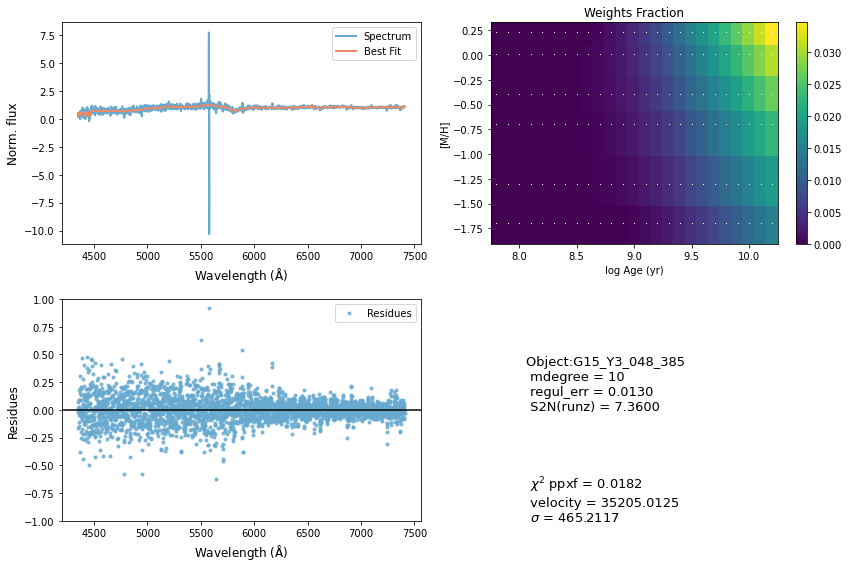

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58713       146    -0.018    -0.008
 comp.  1:     58701       180
 comp.  2:     58613       292
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01652
method = capfit; Jac calls: 5; Func calls: 106; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2816       5.5   58701   180
Comp:  2       Unknown   0.005263        13   58613   292
Comp:  2       Unknown          0        13   58613   292
Comp:  2       Unknown      1.878       5.7   58613   292
---------------------------------------------------------
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.2
M/L_r: 1.729
Current $\chi^2$: 0.0165
Elapsed time in PPXF: 1.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


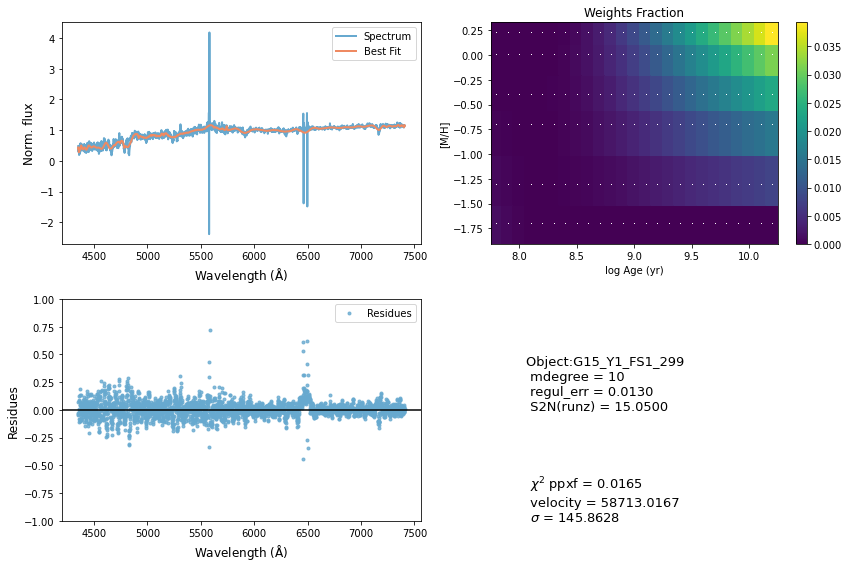

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48767       867    -0.018     0.000
 comp.  1:     49584       180
 comp.  2:     50031       178
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01639
method = capfit; Jac calls: 15; Func calls: 310; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  92 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.6   49584   180
Comp:  2       Unknown     0.8931       6.9   50031   178
Comp:  2       Unknown     0.1577         7   50031   178
Comp:  2       Unknown      1.689       4.7   50031   178
---------------------------------------------------------
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.277
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.277
M/L_r: 1.534
Current $\chi^2$: 0.0164
Elapsed time in PPXF: 3.76 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


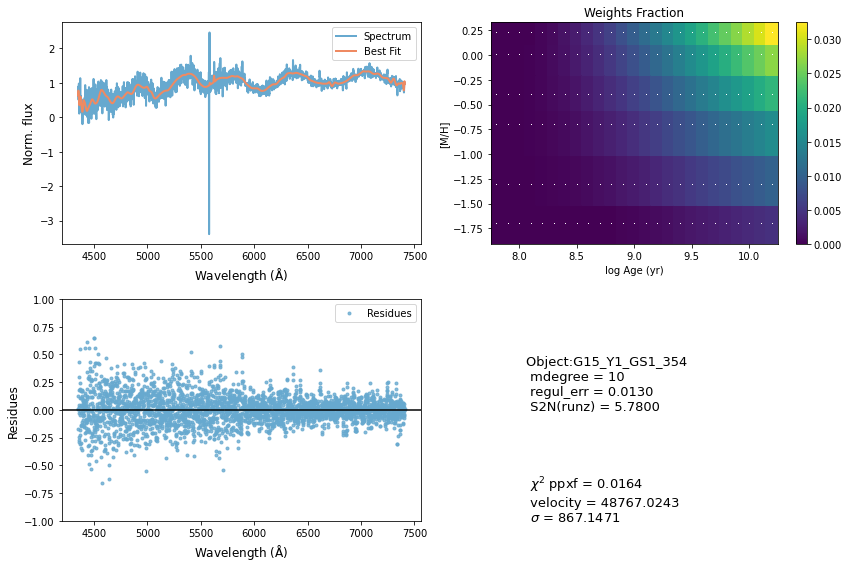

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53122       680    -0.001     0.002
 comp.  1:     53469       298
 comp.  2:     53244       207
Gas Reddening E(B-V): 8.979
chi2/DOF: 0.02798
method = capfit; Jac calls: 14; Func calls: 284; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.393       1.9   53469   298
Comp:  2       Unknown      4.343   1.7e+02   53244   207
Comp:  2       Unknown      3.906   1.9e+02   53244   207
Comp:  2       Unknown      1.881       5.8   53244   207
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.816
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.816
M/L_r: 1.68
Current $\chi^2$: 0.0280
Elapsed time in PPXF: 3.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


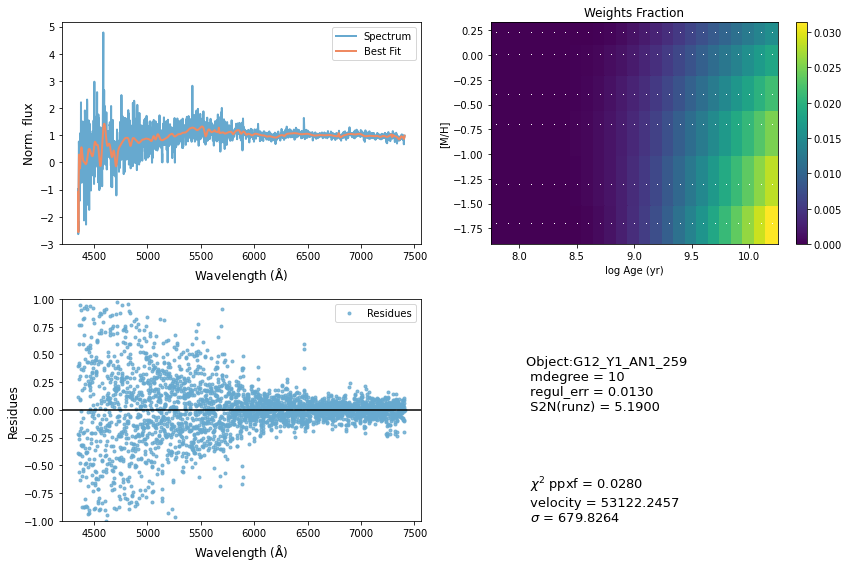

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43428      1000    -0.007     0.006
 comp.  1:     45427       180
 comp.  2:     45312       133
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004063
method = capfit; Jac calls: 3; Func calls: 68; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  94 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.3   45427   180
Comp:  2       Unknown     0.4192       3.6   45312   133
Comp:  2       Unknown          0       2.6   45312   133
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.622
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.622
M/L_r: 1.658
Current $\chi^2$: 0.0041
Elapsed time in PPXF: 0.78 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


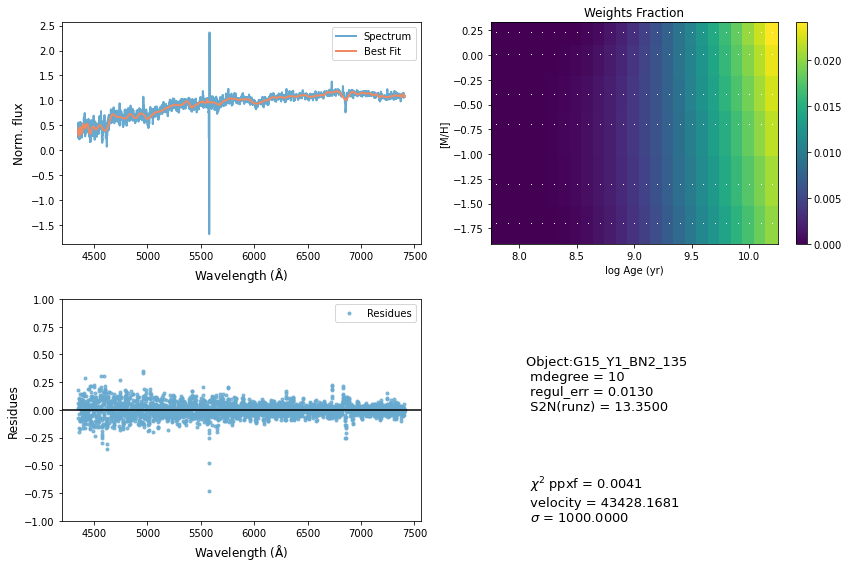

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43506       349    -0.007    -0.021
 comp.  1:     41458       176
 comp.  2:     41791       171
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005129
method = capfit; Jac calls: 14; Func calls: 286; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  69 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7694       3.5   41458   176
Comp:  2       Unknown     0.8546       4.4   41791   171
Comp:  2       Unknown          0       2.4   41791   171
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -1.11
M/L_r: 1.129
Current $\chi^2$: 0.0051
Elapsed time in PPXF: 3.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


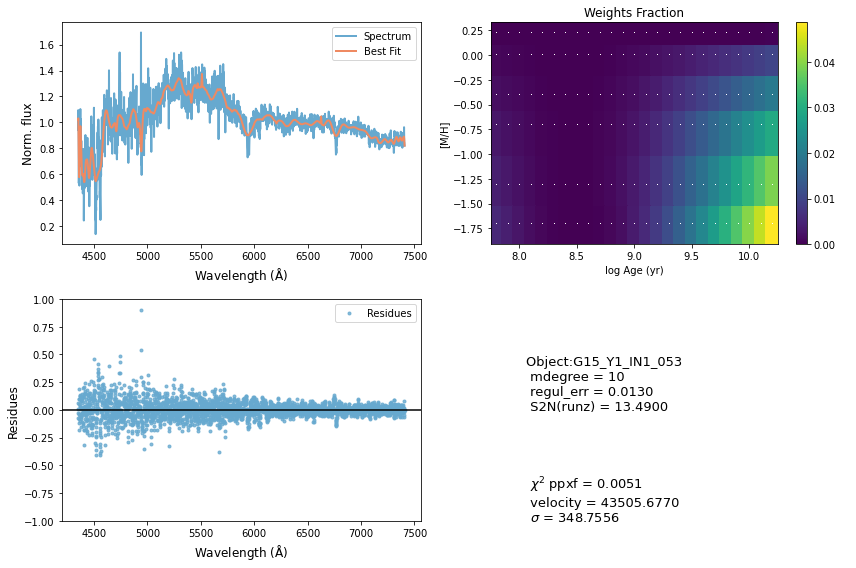

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47941       630    -0.004    -0.009
 comp.  1:     49636        88
 comp.  2:     49586       155
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01108
method = capfit; Jac calls: 15; Func calls: 306; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  55 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2091       2.6   49636    88
Comp:  2       Unknown          0       6.4   49586   155
Comp:  2       Unknown      2.308       7.3   49586   155
Comp:  2       Unknown          0       4.2   49586   155
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.574
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.574
M/L_r: 1.024
Current $\chi^2$: 0.0111
Elapsed time in PPXF: 4.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


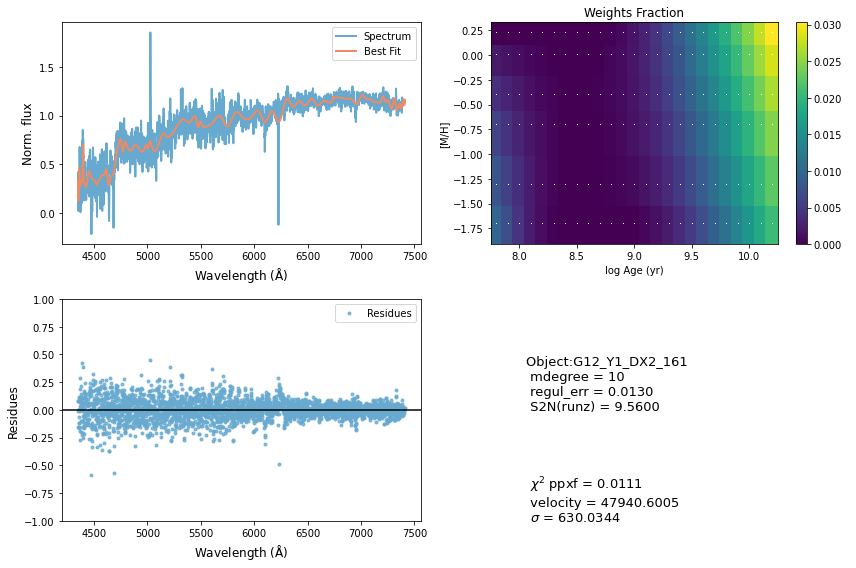

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29906       221     0.003    -0.000
 comp.  1:     33810       915
 comp.  2:     31892        51
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003268
method = capfit; Jac calls: 16; Func calls: 332; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       6.06        10   33810   915
Comp:  2       Unknown      0.575       2.5   31892    51
Comp:  2       Unknown          0       2.1   31892    51
Comp:  2       Unknown    0.06235         2   31892    51
---------------------------------------------------------
Weighted <logAge> [yr]: 7.98
Weighted <[M/H]>: -0.507
Weighted <logAge> [yr]: 7.98
Weighted <[M/H]>: -0.507
M/L_r: 0.1804
Current $\chi^2$: 0.0033
Elapsed time in PPXF: 3.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


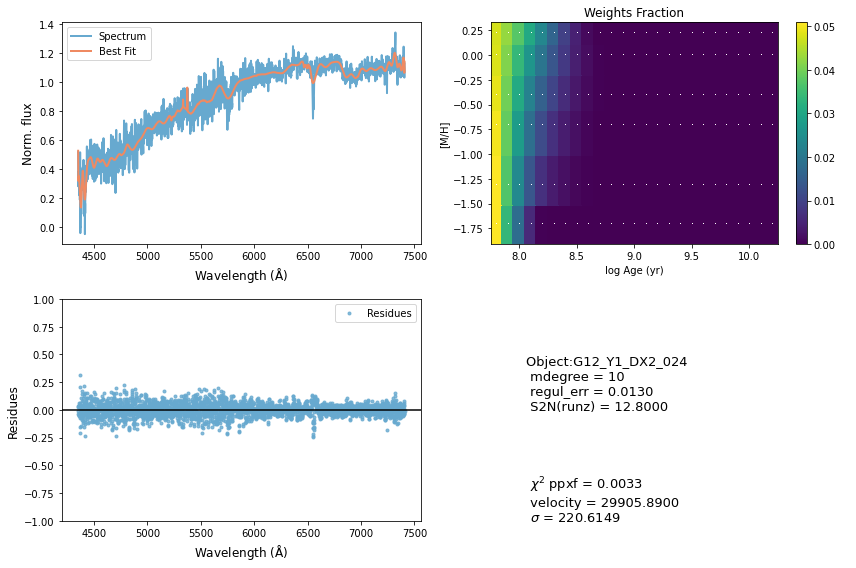

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46231       967     0.010     0.004
 comp.  1:     44054       376
 comp.  2:     44168        91
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0268
method = capfit; Jac calls: 7; Func calls: 154; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  16 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.451       5.5   44054   376
Comp:  2       Unknown          0       3.1   44168    91
Comp:  2       Unknown     0.3092       1.9   44168    91
---------------------------------------------------------
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -0.168
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -0.168
M/L_r: 0.1839
Current $\chi^2$: 0.0268
Elapsed time in PPXF: 1.66 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


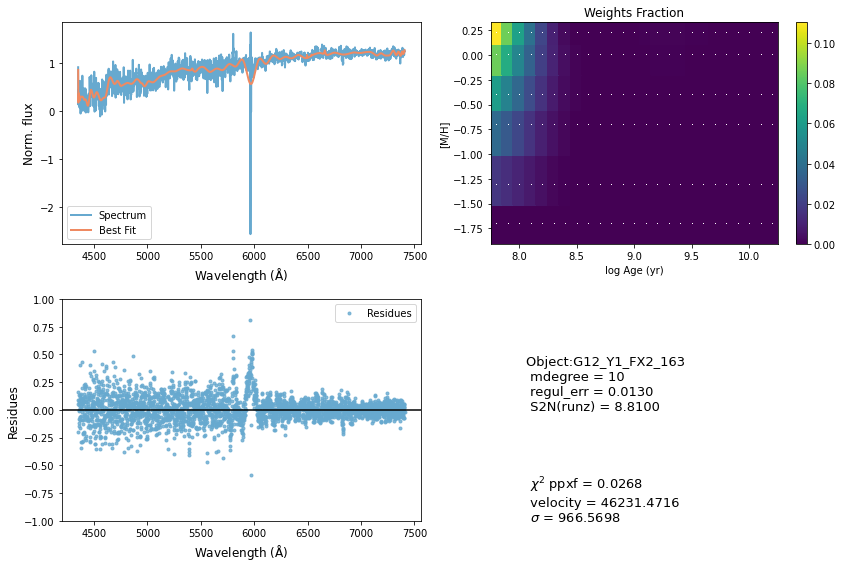

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51141       567     0.009     0.033
 comp.  1:     50791       180
 comp.  2:     50903       318
Gas Reddening E(B-V): 4.222
chi2/DOF: 0.009365
method = capfit; Jac calls: 9; Func calls: 194; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.01545         2   50791   180
Comp:  2       Unknown          0        13   50903   318
Comp:  2       Unknown      15.08        13   50903   318
Comp:  2       Unknown          0         6   50903   318
---------------------------------------------------------
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.192
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.192
M/L_r: 1.595
Current $\chi^2$: 0.0094
Elapsed time in PPXF: 2.36 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


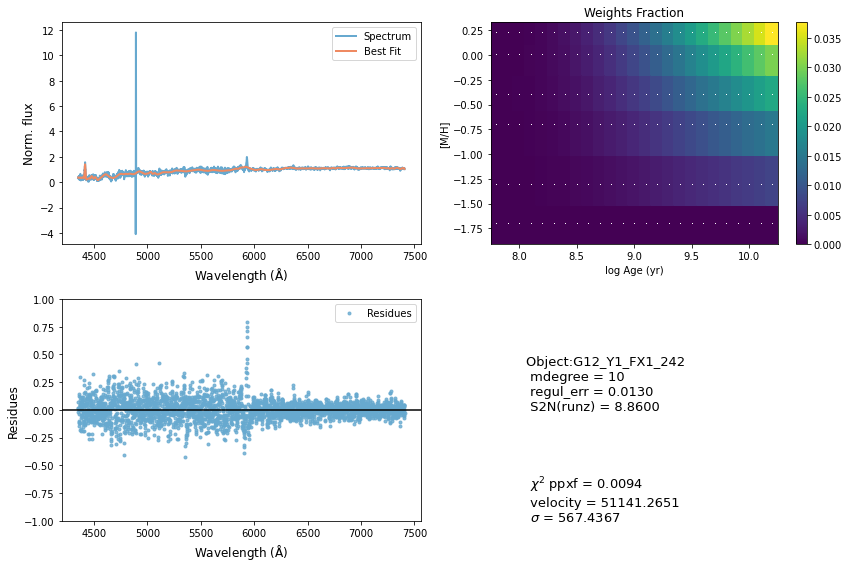

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56392       288    -0.011    -0.015
 comp.  1:     56345       162
 comp.  2:     56467       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006727
method = capfit; Jac calls: 8; Func calls: 171; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  72 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.342       4.3   56345   162
Comp:  2       Unknown          0       7.2   56467   180
Comp:  2       Unknown          0       7.1   56467   180
Comp:  2       Unknown          0       5.4   56467   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: -1.11
M/L_r: 0.8097
Current $\chi^2$: 0.0067
Elapsed time in PPXF: 2.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


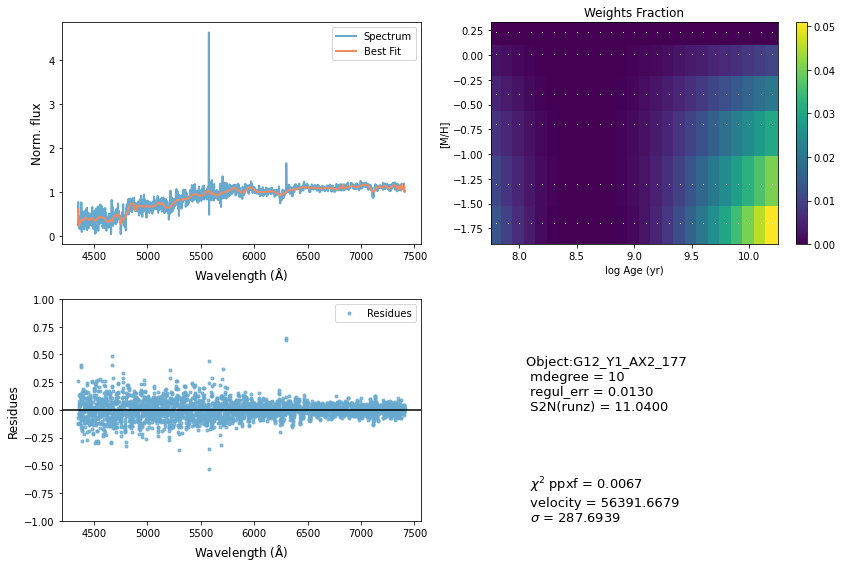

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45923         1    -0.002    -0.002
 comp.  1:     43924       181
 comp.  2:     43924       179
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0161
method = capfit; Jac calls: 1; Func calls: 29; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  14 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5835       4.8   43924   181
Comp:  2       Unknown          0         5   43924   179
Comp:  2       Unknown     0.7505       3.2   43924   179
---------------------------------------------------------
Weighted <logAge> [yr]: 8.39
Weighted <[M/H]>: -0.03
Weighted <logAge> [yr]: 8.39
Weighted <[M/H]>: -0.03
M/L_r: 0.3257
Current $\chi^2$: 0.0161
Elapsed time in PPXF: 0.24 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


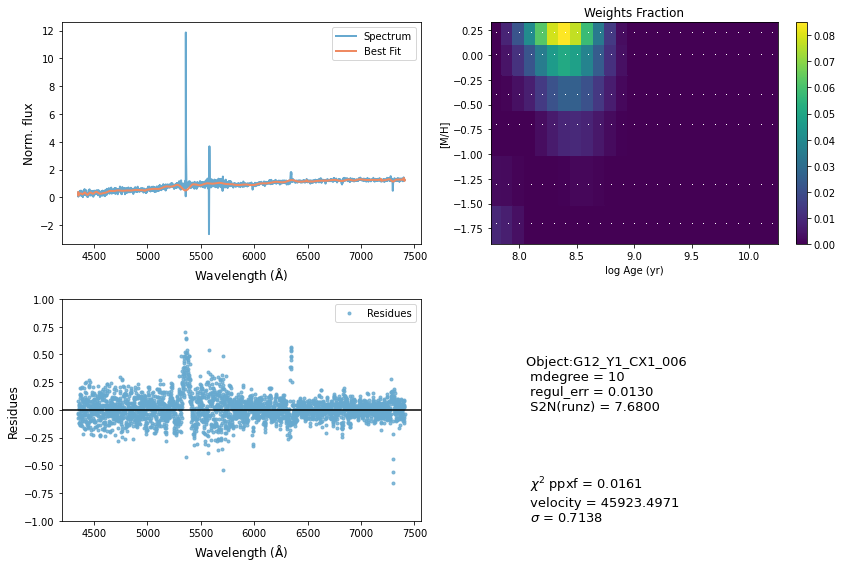

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51002       591     0.074    -0.051
 comp.  1:     50922       184
 comp.  2:     51242       123
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004207
method = capfit; Jac calls: 8; Func calls: 165; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  74 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.4   50922   184
Comp:  2       Unknown       1.29       4.7   51242   123
Comp:  2       Unknown      1.033       4.7   51242   123
Comp:  2       Unknown     0.6208       3.8   51242   123
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.266
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.266
M/L_r: 2.145
Current $\chi^2$: 0.0042
Elapsed time in PPXF: 2.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


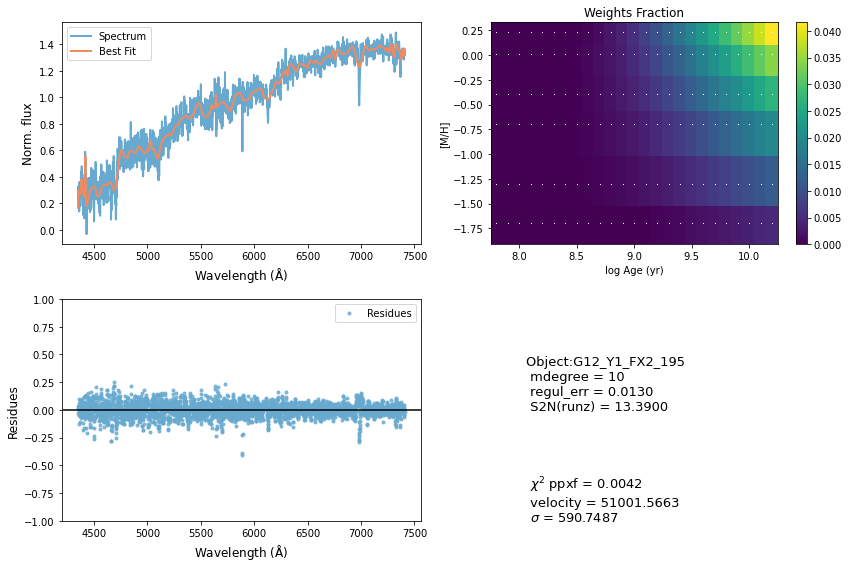

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24518      1000    -0.049     0.118
 comp.  1:     22606       234
 comp.  2:     22333       365
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004023
method = capfit; Jac calls: 8; Func calls: 168; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  99 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.456       5.7   22606   234
Comp:  2       Unknown     0.1473       3.3   22333   365
Comp:  2       Unknown     0.3773       3.4   22333   365
Comp:  2       Unknown          0       5.5   22333   365
Comp:  2       Unknown      1.419       4.1   22333   365
Comp:  2       Unknown          0       3.9   22333   365
---------------------------------------------------------
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: -0.814
Weighted <logAge> [yr]: 9.65
Weighted 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


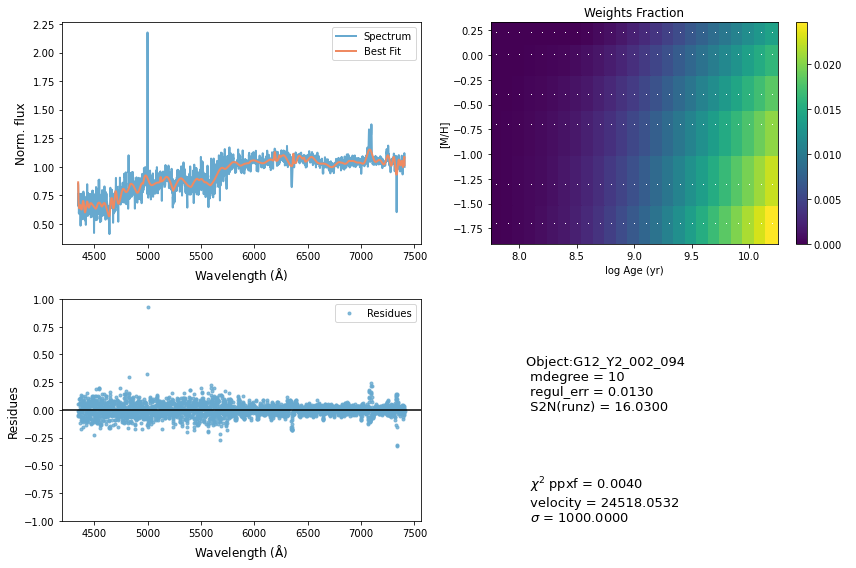

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48183       791    -0.022     0.121
 comp.  1:     48273       294
 comp.  2:     48324       360
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004196
method = capfit; Jac calls: 6; Func calls: 133; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  39 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.573       5.7   48273   294
Comp:  2       Unknown          0        15   48324   360
Comp:  2       Unknown      12.92        15   48324   360
Comp:  2       Unknown          0       7.1   48324   360
Comp:  2       Unknown     0.6577       4.4   48324   360
---------------------------------------------------------
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.241
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.241
M/L_r: 2.432
Current $\chi^2$: 0.0042
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


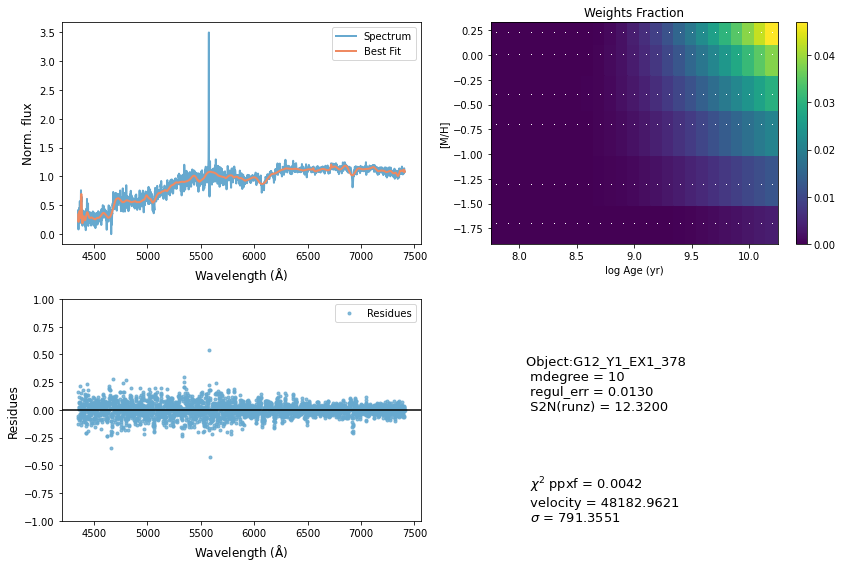

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51447      1000    -0.011     0.107
 comp.  1:     51065       180
 comp.  2:     51294       159
Gas Reddening E(B-V): 2.377
chi2/DOF: 0.004475
method = capfit; Jac calls: 8; Func calls: 168; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.3   51065   180
Comp:  2       Unknown          0       5.3   51294   159
Comp:  2       Unknown      1.667       5.4   51294   159
Comp:  2       Unknown      1.086       4.5   51294   159
---------------------------------------------------------
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.335
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.335
M/L_r: 1.975
Current $\chi^2$: 0.0045
Elapsed time in PPXF: 2.60 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


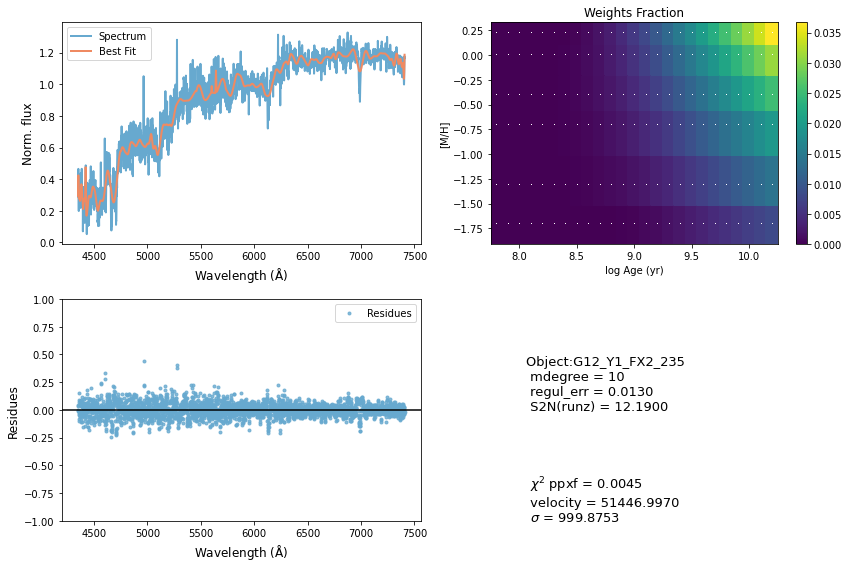

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72948       193     0.015     0.004
 comp.  1:     72838       180
 comp.  2:     73017       115
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.009324
method = capfit; Jac calls: 4; Func calls: 86; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.7   72838   180
Comp:  2       Unknown          0       4.6   73017   115
Comp:  2       Unknown      1.097       4.7   73017   115
Comp:  2       Unknown     0.3124       2.6   73017   115
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.194
M/L_r: 3.102
Current $\chi^2$: 0.0093
Elapsed time in PPXF: 0.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


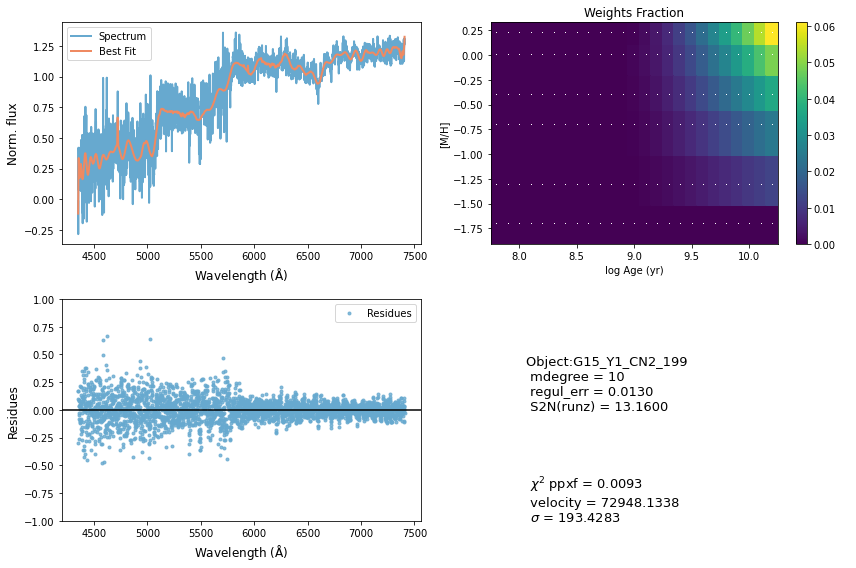

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47927       956     0.130     0.176
 comp.  1:     46325       180
 comp.  2:     45066       752
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.003171
method = capfit; Jac calls: 9; Func calls: 189; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.9   46325   180
Comp:  2       Unknown       4.34         4   45066   752
Comp:  2       Unknown     0.8764       7.6   45066   752
Comp:  2       Unknown     0.3444       5.4   45066   752
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -1.08
M/L_r: 1.261
Current $\chi^2$: 0.0032
Elapsed time in PPXF: 2.75 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


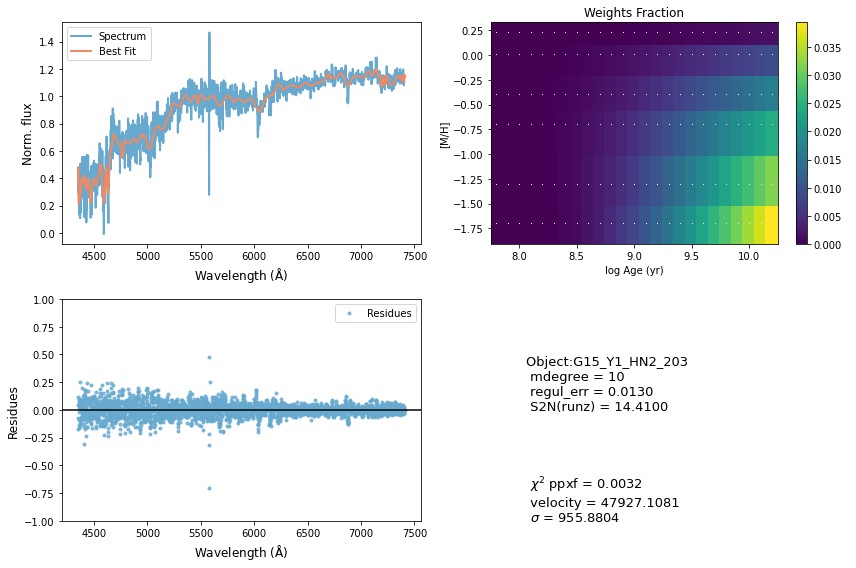

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59744       464    -0.082    -0.087
 comp.  1:     59546       411
 comp.  2:     60003        22
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01075
method = capfit; Jac calls: 8; Func calls: 165; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  93 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.175       7.5   59546   411
Comp:  2       Unknown          0       2.5   60003    22
Comp:  2       Unknown          0       2.5   60003    22
Comp:  2       Unknown     0.3721       2.5   60003    22
---------------------------------------------------------
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.263
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.263
M/L_r: 1.553
Current $\chi^2$: 0.0107
Elapsed time in PPXF: 2.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


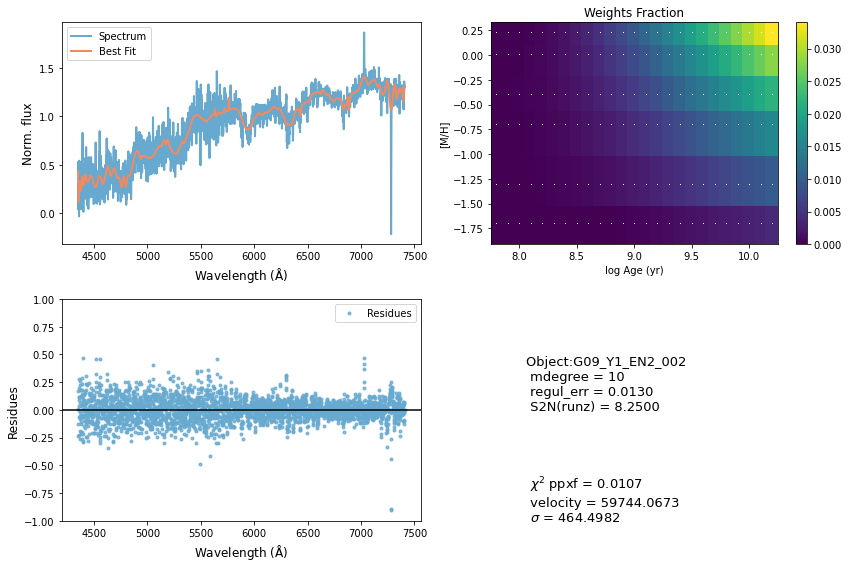

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35560       526     0.097     0.001
 comp.  1:     35234       134
 comp.  2:     34945       406
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.002722
method = capfit; Jac calls: 14; Func calls: 291; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  20 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.407       3.6   35234   134
Comp:  2       Unknown     0.4024       5.8   34945   406
Comp:  2       Unknown          0       4.7   34945   406
Comp:  2       Unknown      2.466       4.3   34945   406
---------------------------------------------------------
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.09
M/L_r: 0.164
Current $\chi^2$: 0.0027
Elapsed time in PPXF: 3.58 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


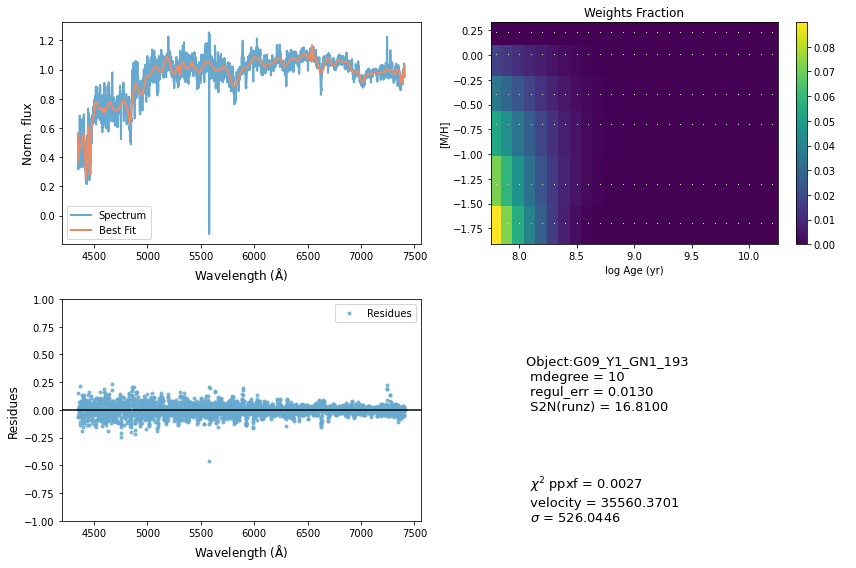

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47605       234     0.025    -0.006
 comp.  1:     46436        64
 comp.  2:     46162       124
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.006771
method = capfit; Jac calls: 23; Func calls: 468; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2717       1.3   46436    64
Comp:  2       Unknown     0.1812       1.7   46162   124
Comp:  2       Unknown          0       3.3   46162   124
Comp:  2       Unknown          0       2.3   46162   124
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.344
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.344
M/L_r: 2.694
Current $\chi^2$: 0.0068
Elapsed time in PPXF: 6.23 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


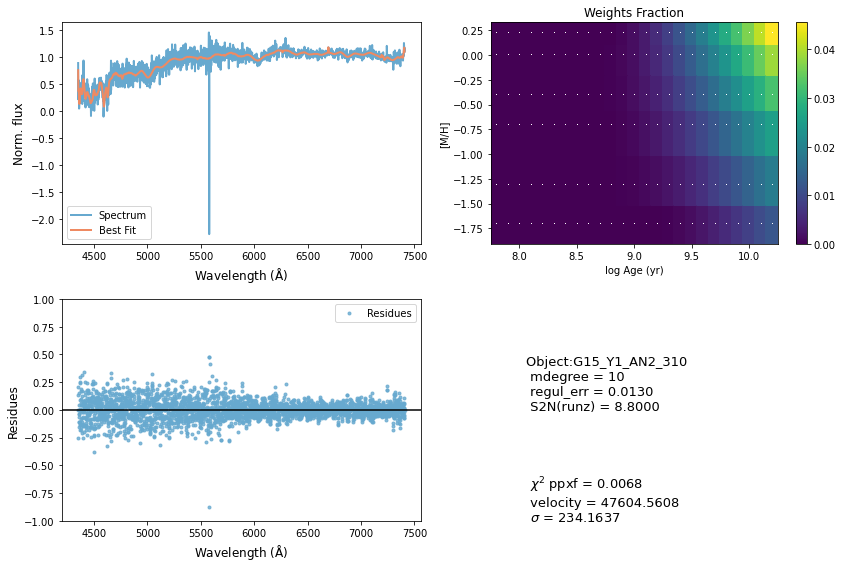

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36019       422    -0.028    -0.028
 comp.  1:     36321       684
 comp.  2:     36685       131
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0493
method = capfit; Jac calls: 4; Func calls: 82; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  18 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.88         9   36321   684
Comp:  2       Unknown      2.384       3.4   36685   131
Comp:  2       Unknown          0       2.6   36685   131
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.193
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.193
M/L_r: 3.253
Current $\chi^2$: 0.0493
Elapsed time in PPXF: 0.97 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


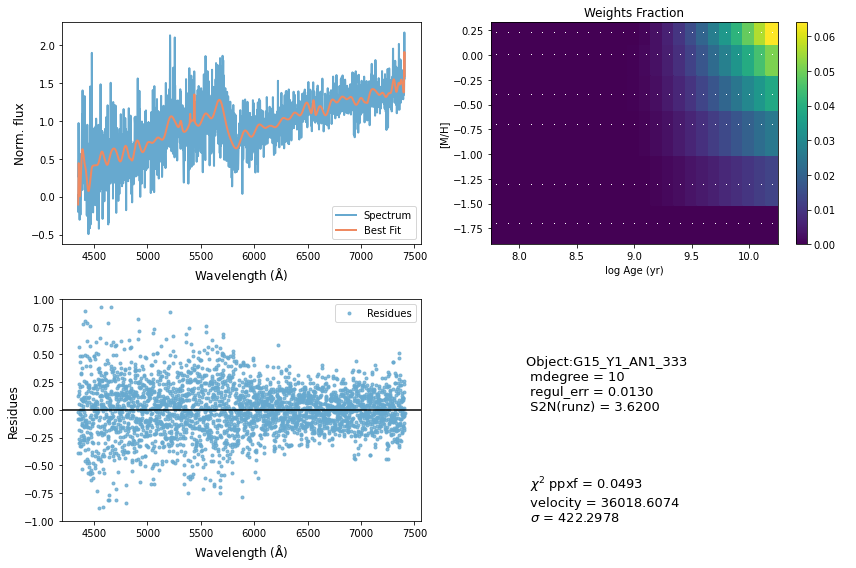

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44120      1000     0.012    -0.055
 comp.  1:     45879       206
 comp.  2:     46019       180
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.003061
method = capfit; Jac calls: 10; Func calls: 210; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2946       2.5   45879   206
Comp:  2       Unknown          0         4   46019   180
Comp:  2       Unknown          0       3.2   46019   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -0.19
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -0.19
M/L_r: 0.892
Current $\chi^2$: 0.0031
Elapsed time in PPXF: 2.91 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


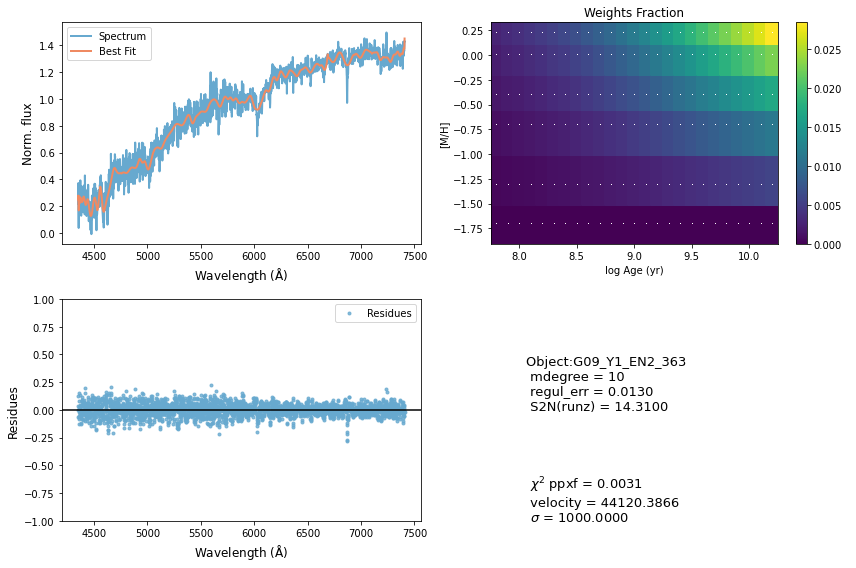

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41396        78     0.001    -0.001
 comp.  1:     41396       123
 comp.  2:     41258       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01006
method = capfit; Jac calls: 6; Func calls: 127; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.422       3.4   41396   123
Comp:  2       Unknown          0         4   41258   180
Comp:  2       Unknown          0       2.8   41258   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -1.08
M/L_r: 1.155
Current $\chi^2$: 0.0101
Elapsed time in PPXF: 1.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


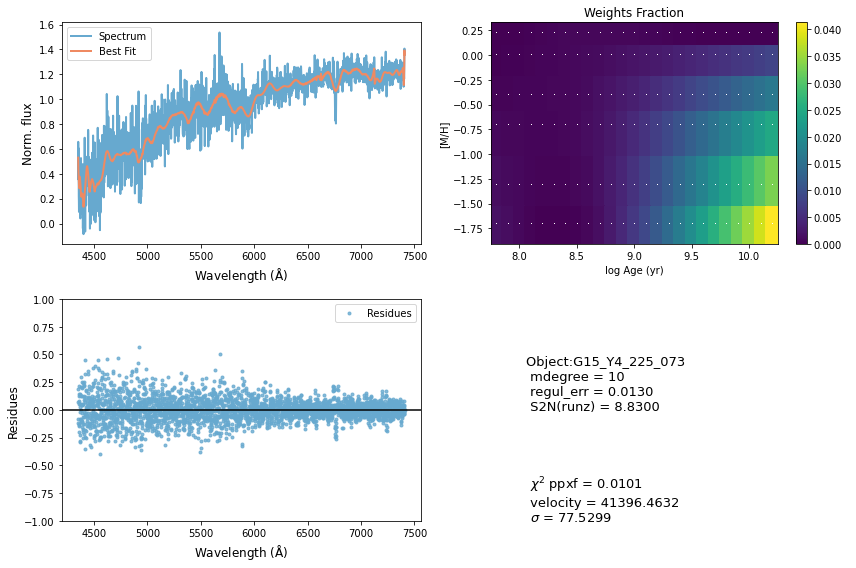

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     26901        22     0.001    -0.001
 comp.  1:     27001       402
 comp.  2:     26907        64
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008944
method = capfit; Jac calls: 13; Func calls: 271; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  14 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.101       5.5   27001   402
Comp:  2       Unknown          0       1.3   26907    64
Comp:  2       Unknown      0.163       1.4   26907    64
Comp:  2       Unknown     0.1504       2.7   26907    64
Comp:  2       Unknown     0.6933       2.2   26907    64
Comp:  2       Unknown          0       1.7   26907    64
---------------------------------------------------------
Weighted <logAge> [yr]: 8.02
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.02
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


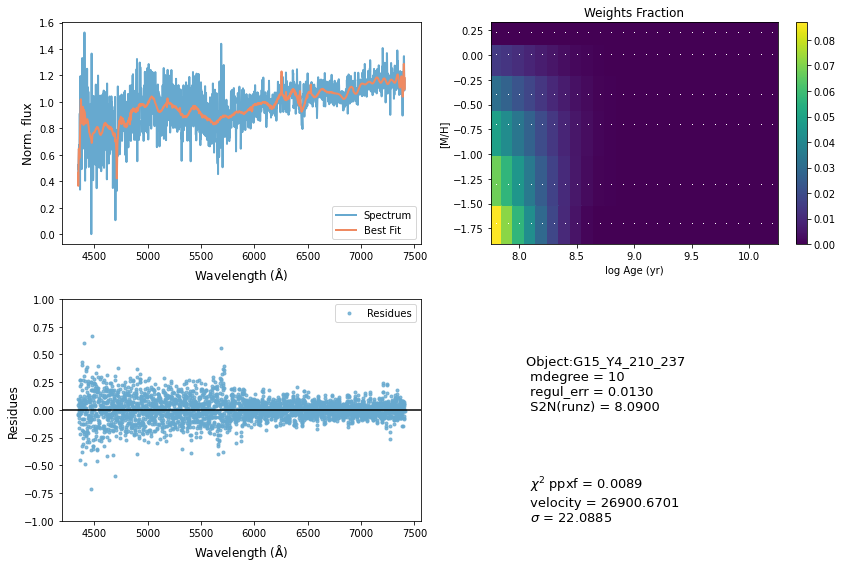

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     32648       990     0.008     0.008
 comp.  1:     34555       180
 comp.  2:     34540       136
Gas Reddening E(B-V): 8.916
chi2/DOF: 0.005914
method = capfit; Jac calls: 5; Func calls: 103; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.4   34555   180
Comp:  2       Unknown     0.9534       3.3   34540   136
Comp:  2       Unknown          0       3.5   34540   136
Comp:  2       Unknown          0       2.4   34540   136
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.194
M/L_r: 2.823
Current $\chi^2$: 0.0059
Elapsed time in PPXF: 1.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


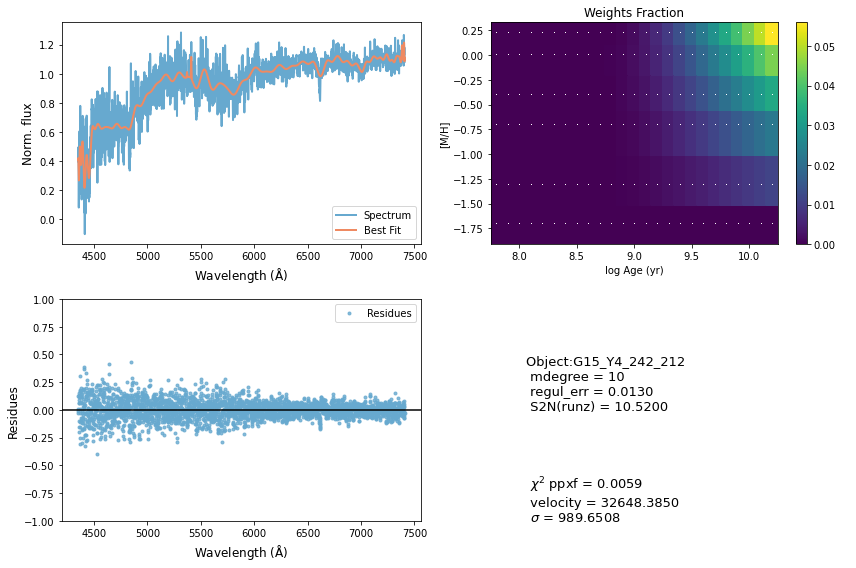

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75486      1000     0.008    -0.021
 comp.  1:     77486       180
 comp.  2:     77346        13
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.05021
method = capfit; Jac calls: 6; Func calls: 126; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  30 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         4   77486   180
Comp:  2       Unknown          0       2.2   77346    13
Comp:  2       Unknown     0.9964       2.3   77346    13
Comp:  2       Unknown          0       1.8   77346    13
---------------------------------------------------------
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.09
M/L_r: 0.1641
Current $\chi^2$: 0.0502
Elapsed time in PPXF: 1.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


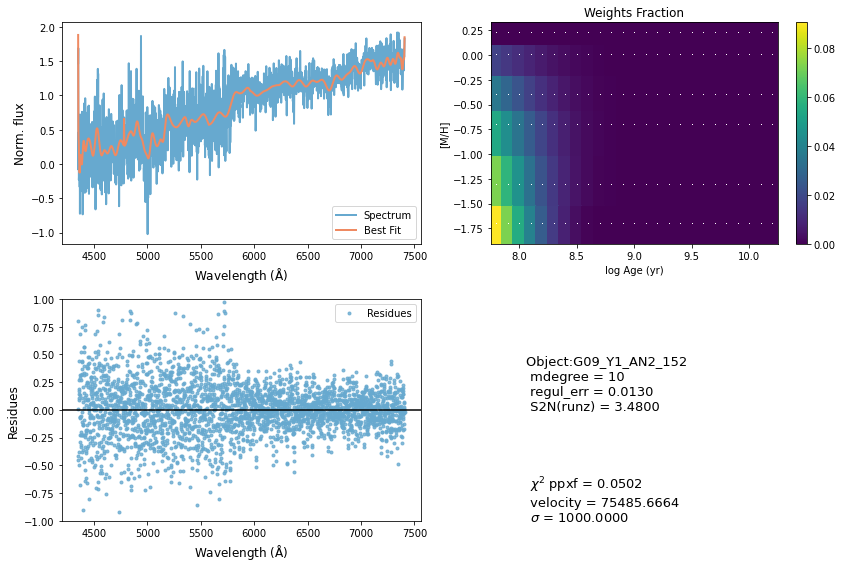

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51787       419     0.042    -0.007
 comp.  1:     51673        98
 comp.  2:     51762        98
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009495
method = capfit; Jac calls: 9; Func calls: 189; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.812       3.1   51673    98
Comp:  2       Unknown          0       4.9   51762    98
Comp:  2       Unknown      2.741       5.1   51762    98
Comp:  2       Unknown     0.1588       3.5   51762    98
---------------------------------------------------------
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.194
M/L_r: 1.284
Current $\chi^2$: 0.0095
Elapsed time in PPXF: 2.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


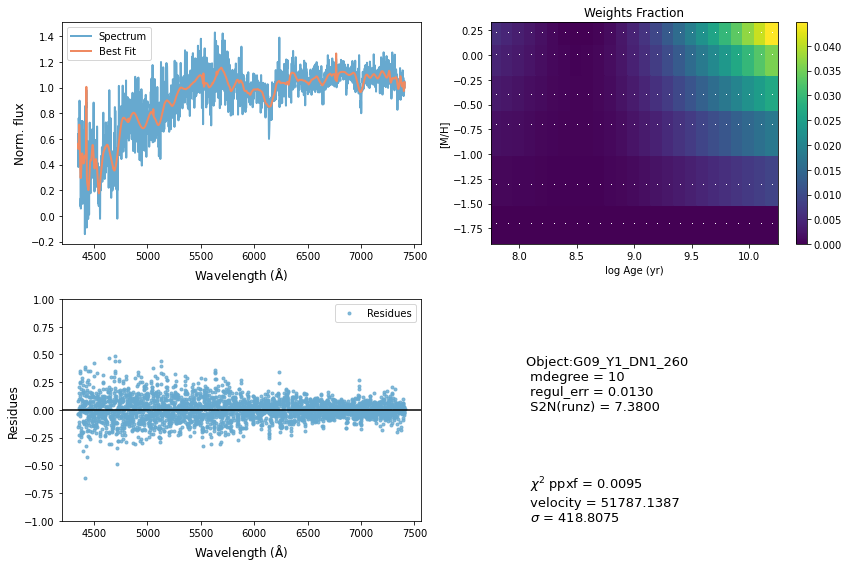

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54460       525    -0.000    -0.001
 comp.  1:     54915        61
 comp.  2:     55466       299
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008842
method = capfit; Jac calls: 15; Func calls: 305; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  20 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.008       2.7   54915    61
Comp:  2       Unknown          0        12   55466   299
Comp:  2       Unknown       5.28        12   55466   299
Comp:  2       Unknown       1.78         8   55466   299
---------------------------------------------------------
Weighted <logAge> [yr]: 9.5
Weighted <[M/H]>: -0.984
Weighted <logAge> [yr]: 9.5
Weighted <[M/H]>: -0.984
M/L_r: 0.7062
Current $\chi^2$: 0.0088
Elapsed time in PPXF: 4.71 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


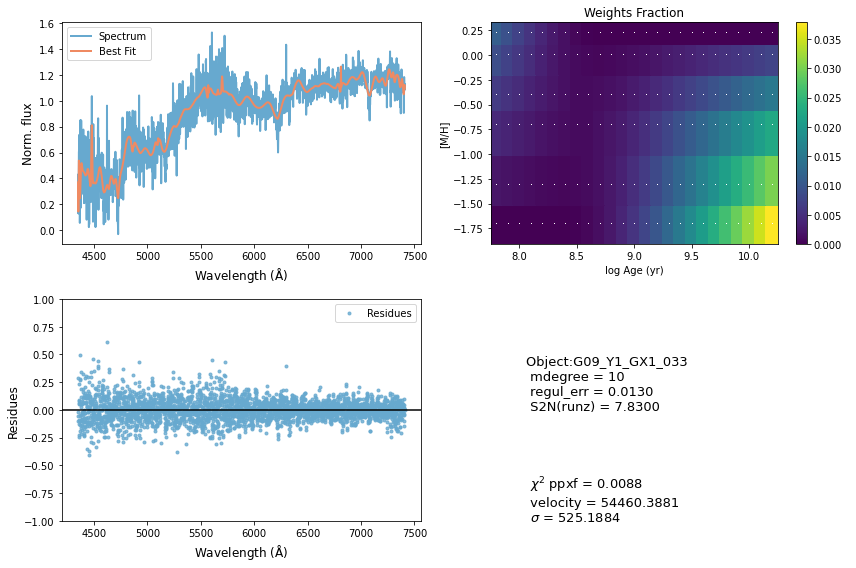

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53539         1    -0.026    -0.023
 comp.  1:     53628       180
 comp.  2:     53607       251
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.002819
method = capfit; Jac calls: 1; Func calls: 22; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.02251       2.3   53628   180
Comp:  2       Unknown     0.1419   3.2e+02   53607   251
Comp:  2       Unknown          0   3.2e+02   53607   251
Comp:  2       Unknown      0.657       6.3   53607   251
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -1.11
M/L_r: 1.747
Current $\chi^2$: 0.0028
Elapsed time in PPXF: 0.20 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


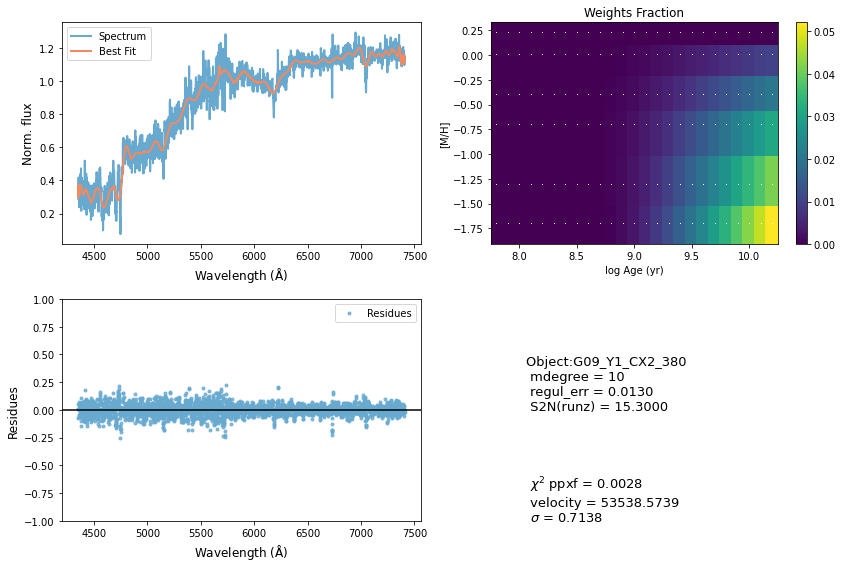

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56682       537    -0.032     0.012
 comp.  1:     56582       203
 comp.  2:     56812       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004626
method = capfit; Jac calls: 8; Func calls: 166; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  22 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9658       5.5   56582   203
Comp:  2       Unknown          0       5.6   56812   180
Comp:  2       Unknown          0       5.6   56812   180
Comp:  2       Unknown          0       5.6   56812   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -1.12
M/L_r: 0.1585
Current $\chi^2$: 0.0046
Elapsed time in PPXF: 2.15 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


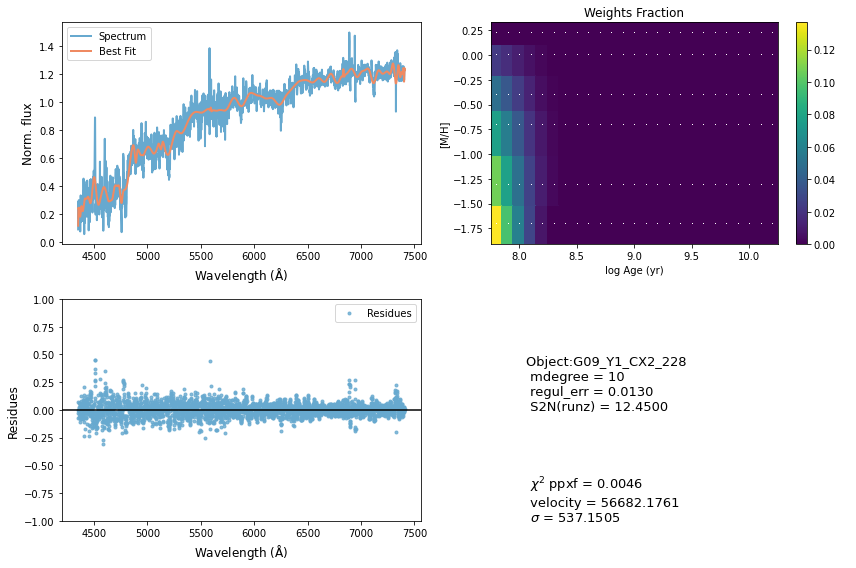

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75042       219    -0.008    -0.004
 comp.  1:     74746       405
 comp.  2:     74580       173
Gas Reddening E(B-V): 0.089
chi2/DOF: 0.02527
method = capfit; Jac calls: 7; Func calls: 147; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  14 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.462       5.2   74746   405
Comp:  2       Unknown          0       6.1   74580   173
Comp:  2       Unknown          0       6.9   74580   173
Comp:  2       Unknown          0         3   74580   173
---------------------------------------------------------
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.17
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.17
M/L_r: 0.1583
Current $\chi^2$: 0.0253
Elapsed time in PPXF: 1.52 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


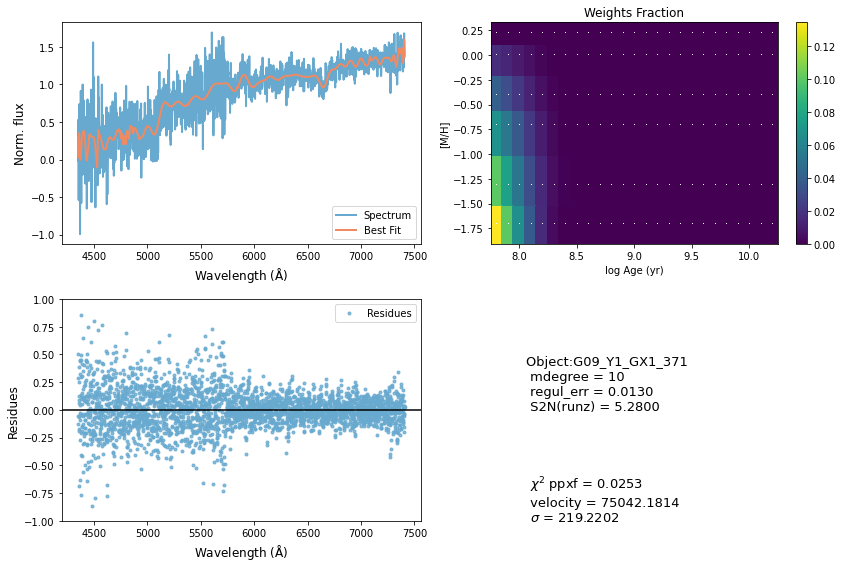

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     18597       671    -0.008    -0.031
 comp.  1:     19241       431
 comp.  2:     19595       293
Gas Reddening E(B-V): 4.635
chi2/DOF: 0.002454
method = capfit; Jac calls: 13; Func calls: 272; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.224       4.4   19241   431
Comp:  2       Unknown          0       3.5   19595   293
Comp:  2       Unknown          0       3.4   19595   293
Comp:  2       Unknown          0       4.7   19595   293
Comp:  2       Unknown      0.467       4.6   19595   293
Comp:  2       Unknown      1.465       4.5   19595   293
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.707
Weighted <logAge> [yr]: 9.7
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


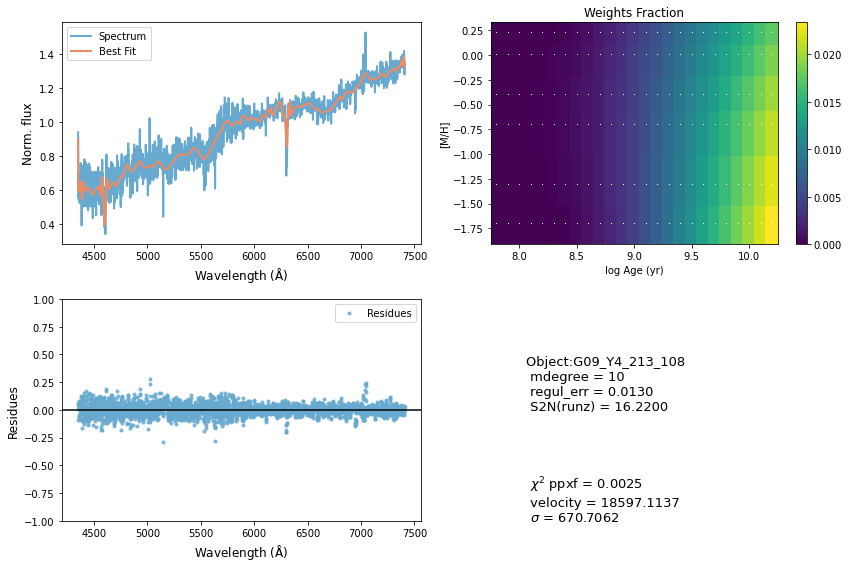

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46250       629    -0.015     0.016
 comp.  1:     47443       951
 comp.  2:     47484       200
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.002121
method = capfit; Jac calls: 11; Func calls: 229; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       7.4   47443   951
Comp:  2       Unknown      123.7   5.4e+02   47484   200
Comp:  2       Unknown      125.5   5.4e+02   47484   200
Comp:  2       Unknown          0       3.9   47484   200
Comp:  2       Unknown     0.2051       4.1   47484   200
---------------------------------------------------------
Weighted <logAge> [yr]: 8.1
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 8.1
Weighted <[M/H]>: -0.198
M/L_r: 0.2062
Current $\chi^2$: 0.0021
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


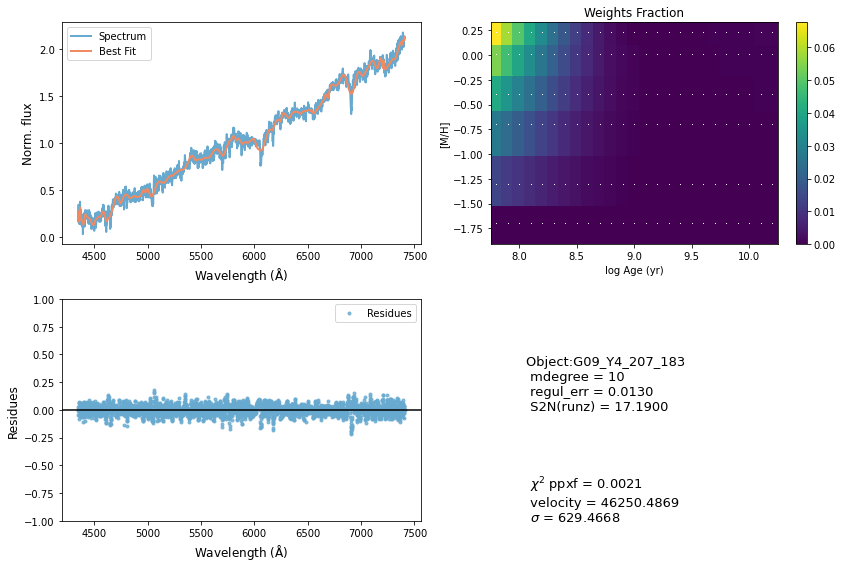

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38661       444     0.022     0.026
 comp.  1:     38802       482
 comp.  2:     38512       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004018
method = capfit; Jac calls: 9; Func calls: 190; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  88 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.936       7.1   38802   482
Comp:  2       Unknown          0         4   38512   180
Comp:  2       Unknown          0         3   38512   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.743
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.743
M/L_r: 1.62
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 2.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


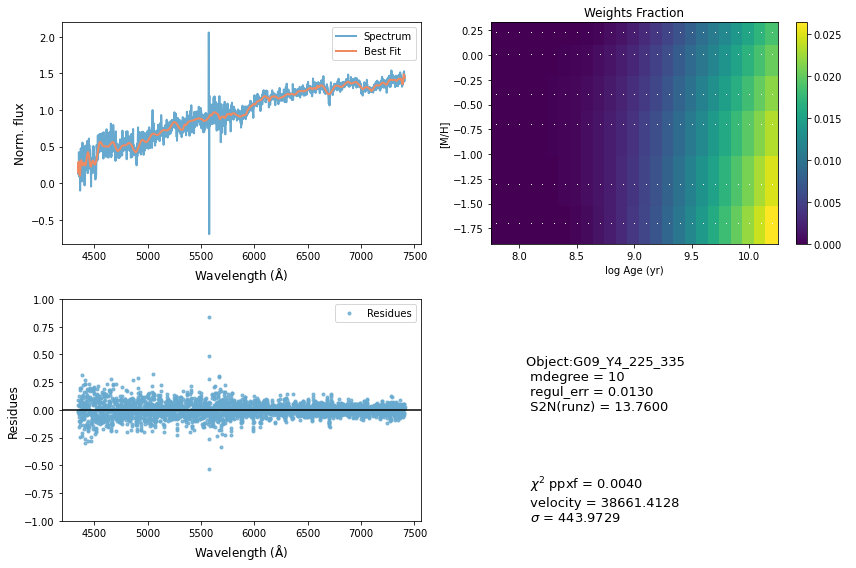

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43402        47    -0.001    -0.003
 comp.  1:     43539       181
 comp.  2:     43694        98
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01706
method = capfit; Jac calls: 7; Func calls: 148; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  15 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2666       3.6   43539   181
Comp:  2       Unknown      0.252       3.2   43694    98
Comp:  2       Unknown     0.7863       1.8   43694    98
---------------------------------------------------------
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.21
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.21
M/L_r: 0.1598
Current $\chi^2$: 0.0171
Elapsed time in PPXF: 1.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


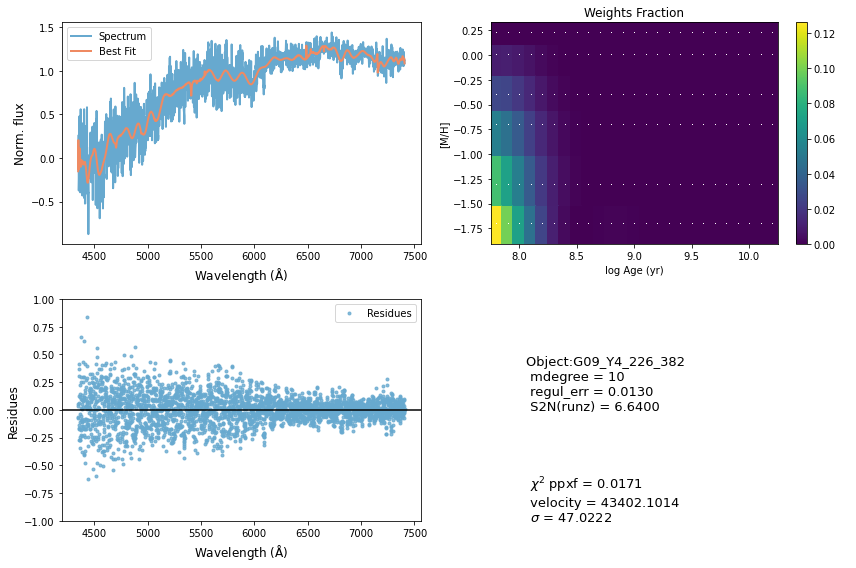

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60796       228    -0.001     0.012
 comp.  1:     60854       246
 comp.  2:     60694        93
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01441
method = capfit; Jac calls: 9; Func calls: 184; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  70 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       3.41       4.6   60854   246
Comp:  2       Unknown          0       4.4   60694    93
Comp:  2       Unknown     0.5534       4.3   60694    93
Comp:  2       Unknown          0       3.2   60694    93
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -1.11
M/L_r: 1.466
Current $\chi^2$: 0.0144
Elapsed time in PPXF: 2.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


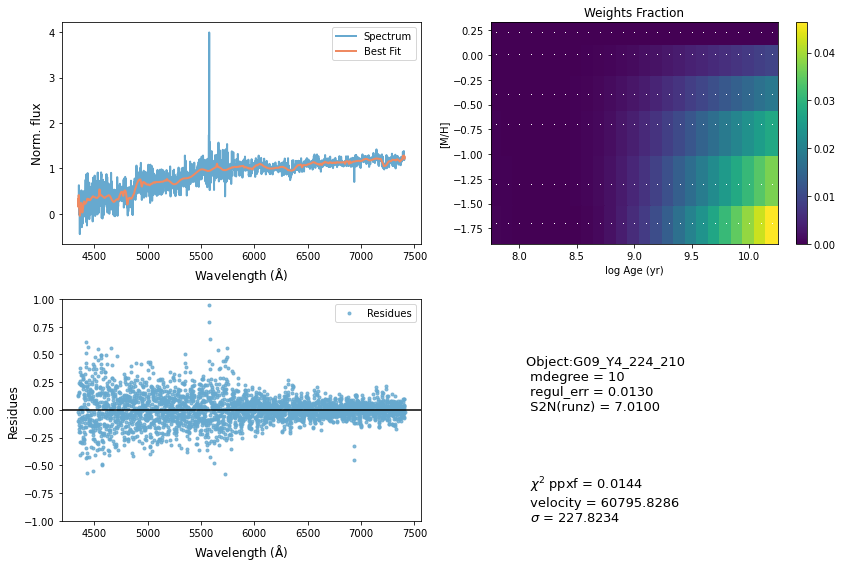

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42998       180     0.000     0.000
 comp.  1:     42998       180
 comp.  2:     42998       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.002916
method = capfit; Jac calls: 1; Func calls: 24; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.9   42998   180
Comp:  2       Unknown          0         4   42998   180
Comp:  2       Unknown     0.2082       2.7   42998   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0029
Elapsed time in PPXF: 0.24 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: invalid value encountered in true_divide


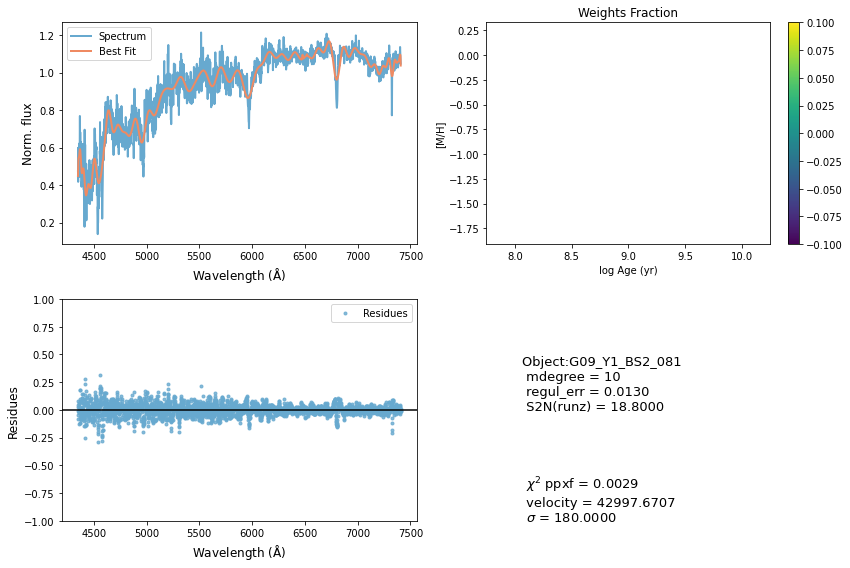

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47533       509    -0.002    -0.002
 comp.  1:     47271       115
 comp.  2:     47682        76
Gas Reddening E(B-V): 6.309
chi2/DOF: 0.006145
method = capfit; Jac calls: 16; Func calls: 326; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2534       1.6   47271   115
Comp:  2       Unknown      0.592       2.8   47682    76
Comp:  2       Unknown      1.186         4   47682    76
Comp:  2       Unknown     0.7417       2.9   47682    76
Comp:  2       Unknown          0         2   47682    76
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.203
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.203
M/L_r: 2.02
Current $\chi^2$: 0.0061
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


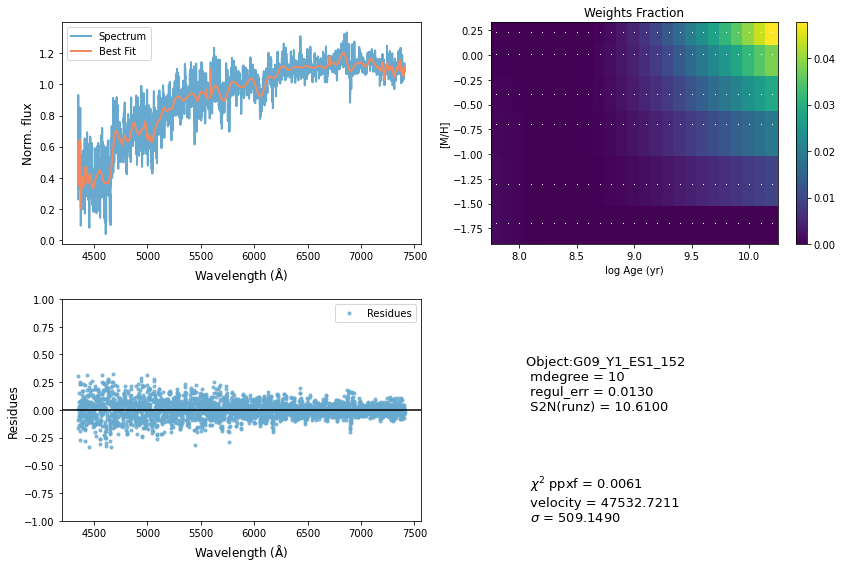

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68948       209     0.008    -0.022
 comp.  1:     68976       181
 comp.  2:     69070       354
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00587
method = capfit; Jac calls: 5; Func calls: 103; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  66 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3226       3.8   68976   181
Comp:  2       Unknown          0        14   69070   354
Comp:  2       Unknown          0        14   69070   354
Comp:  2       Unknown          0       6.1   69070   354
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.212
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.212
M/L_r: 2.845
Current $\chi^2$: 0.0059
Elapsed time in PPXF: 1.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


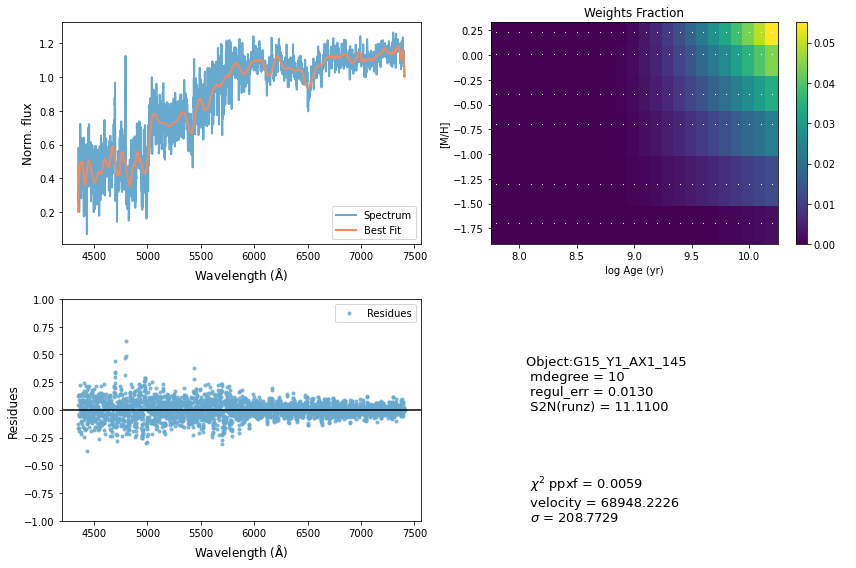

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     25984       101    -0.003    -0.001
 comp.  1:     26000       289
 comp.  2:     25929       478
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00333
method = capfit; Jac calls: 8; Func calls: 169; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  10 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.695       5.4   26000   289
Comp:  2       Unknown      0.347       5.1   25929   478
Comp:  2       Unknown    0.03651       4.8   25929   478
Comp:  2       Unknown          0       6.1   25929   478
Comp:  2       Unknown      2.329       5.6   25929   478
Comp:  2       Unknown          0       4.8   25929   478
---------------------------------------------------------
Weighted <logAge> [yr]: 7.98
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 7.98
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


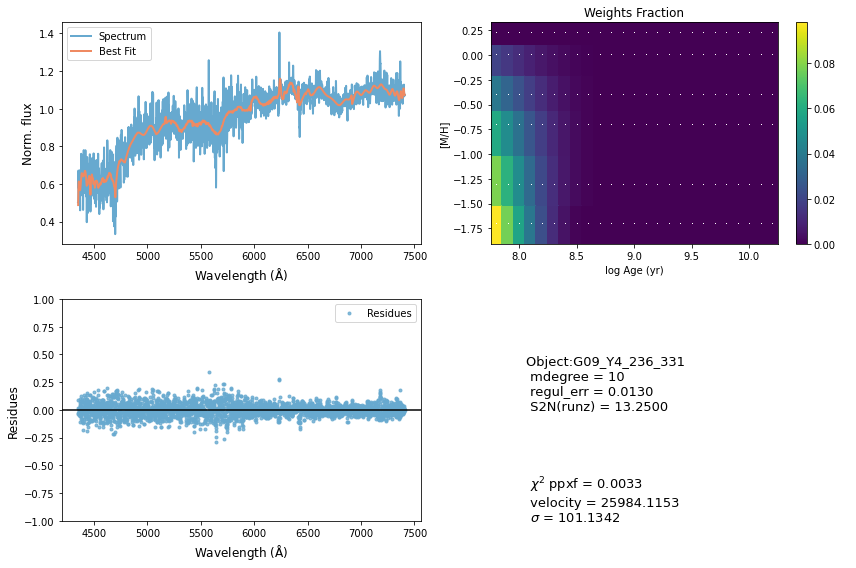

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     70007        99     0.002     0.004
 comp.  1:     69801        84
 comp.  2:     69889       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006215
method = capfit; Jac calls: 6; Func calls: 123; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.891       3.8   69801    84
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       3.4   69889   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.197
M/L_r: 1.869
Current $\chi^2$: 0.0062
Elapsed time in PPXF: 1.50 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


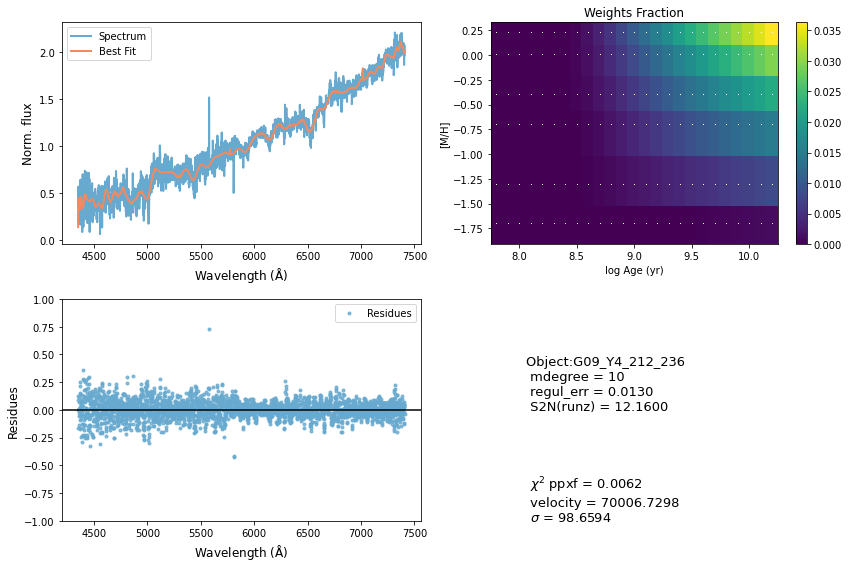

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51678       796     0.012    -0.000
 comp.  1:     53651       115
 comp.  2:     53983       174
Gas Reddening E(B-V): 7.070
chi2/DOF: 0.006169
method = capfit; Jac calls: 11; Func calls: 227; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.09726       1.5   53651   115
Comp:  2       Unknown      1.572       1.5   53983   174
Comp:  2       Unknown      5.881       5.6   53983   174
Comp:  2       Unknown     0.5991       5.3   53983   174
---------------------------------------------------------
Weighted <logAge> [yr]: 9.62
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.62
Weighted <[M/H]>: -1.11
M/L_r: 1.05
Current $\chi^2$: 0.0062
Elapsed time in PPXF: 3.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


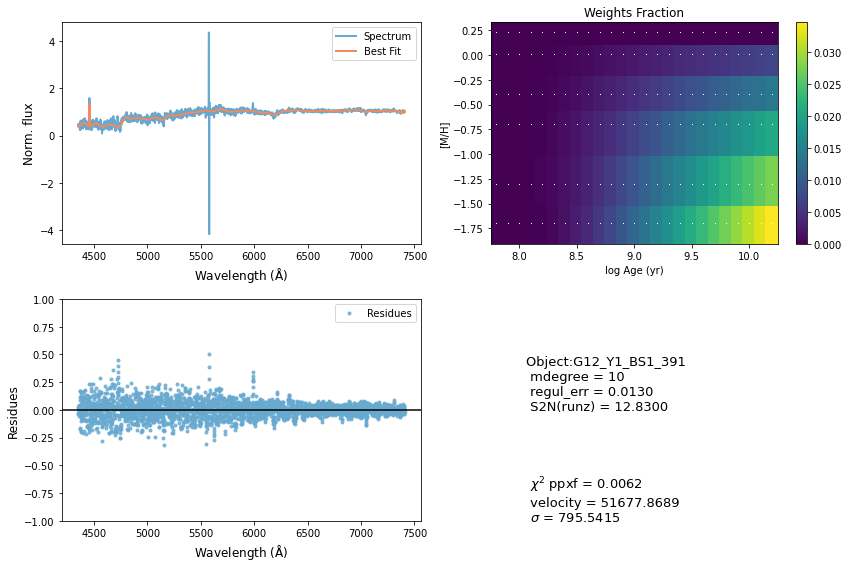

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42958        14    -0.003    -0.001
 comp.  1:     42648       445
 comp.  2:     42795        74
Gas Reddening E(B-V): 0.311
chi2/DOF: 0.01589
method = capfit; Jac calls: 8; Func calls: 164; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  39 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.845       4.9   42648   445
Comp:  2       Unknown     0.5079       2.8   42795    74
Comp:  2       Unknown     0.1169       1.7   42795    74
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.204
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.204
M/L_r: 3.207
Current $\chi^2$: 0.0159
Elapsed time in PPXF: 2.33 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


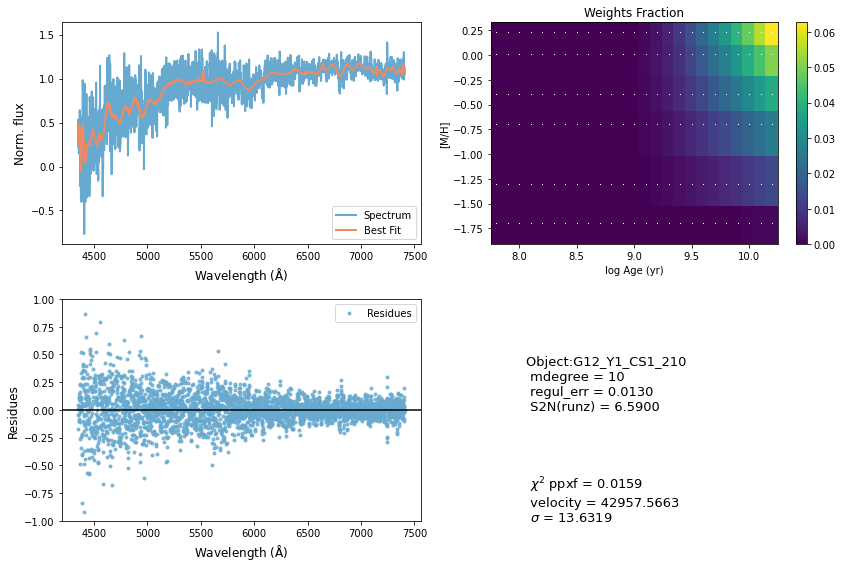

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30683       384    -0.025    -0.056
 comp.  1:     30779      1000
 comp.  2:     30453       113
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01037
method = capfit; Jac calls: 15; Func calls: 307; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  69 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.08       9.4   30779  1000
Comp:  2       Unknown      1.628       3.4   30453   113
Comp:  2       Unknown          0       2.7   30453   113
Comp:  2       Unknown          0       2.1   30453   113
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.411
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.411
M/L_r: 1.807
Current $\chi^2$: 0.0104
Elapsed time in PPXF: 4.28 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


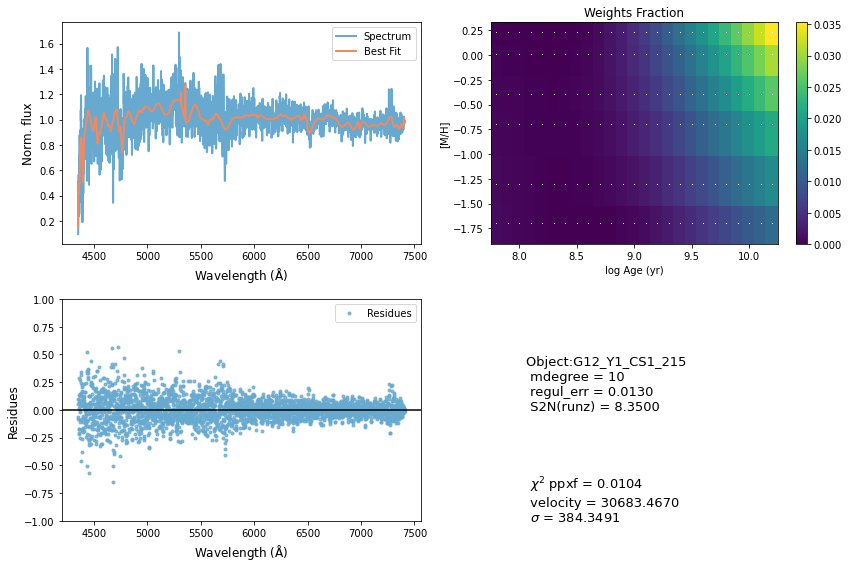

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75271       180     0.000     0.000
 comp.  1:     75271       180
 comp.  2:     75271       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003362
method = capfit; Jac calls: 1; Func calls: 22; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.7   75271   180
Comp:  2       Unknown     0.4499       5.7   75271   180
Comp:  2       Unknown     0.3199       5.6   75271   180
Comp:  2       Unknown     0.1958       3.8   75271   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.28
Weighted <[M/H]>: 0.122
Weighted <logAge> [yr]: 8.28
Weighted <[M/H]>: 0.122
M/L_r: 0.3009
Current $\chi^2$: 0.0034
Elapsed time in PPXF: 0.24 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


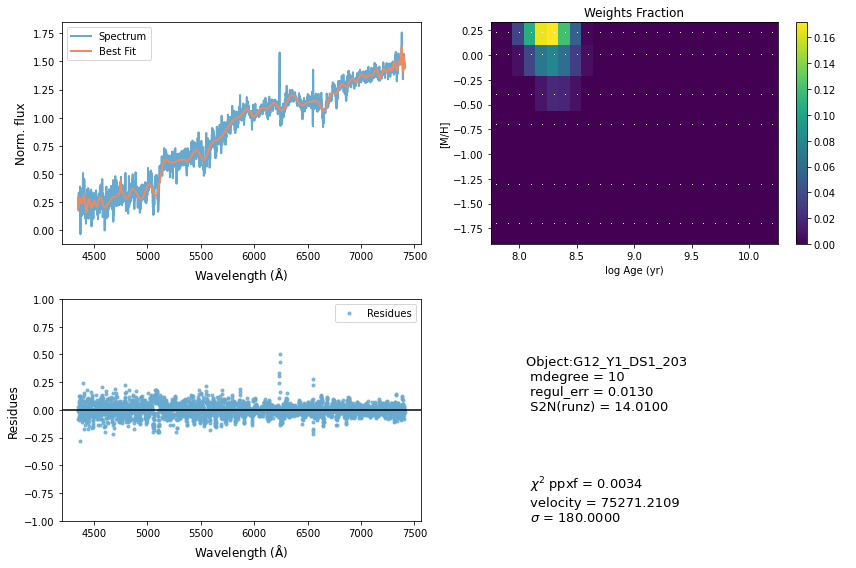

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59130       180     0.000     0.000
 comp.  1:     59130       180
 comp.  2:     59130       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01145
method = capfit; Jac calls: 1; Func calls: 27; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  49 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.4   59130   180
Comp:  2       Unknown          0       5.8   59130   180
Comp:  2       Unknown          0       5.8   59130   180
Comp:  2       Unknown     0.9604       4.4   59130   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.966
Current $\chi^2$: 0.0115
Elapsed time in PPXF: 0.40 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


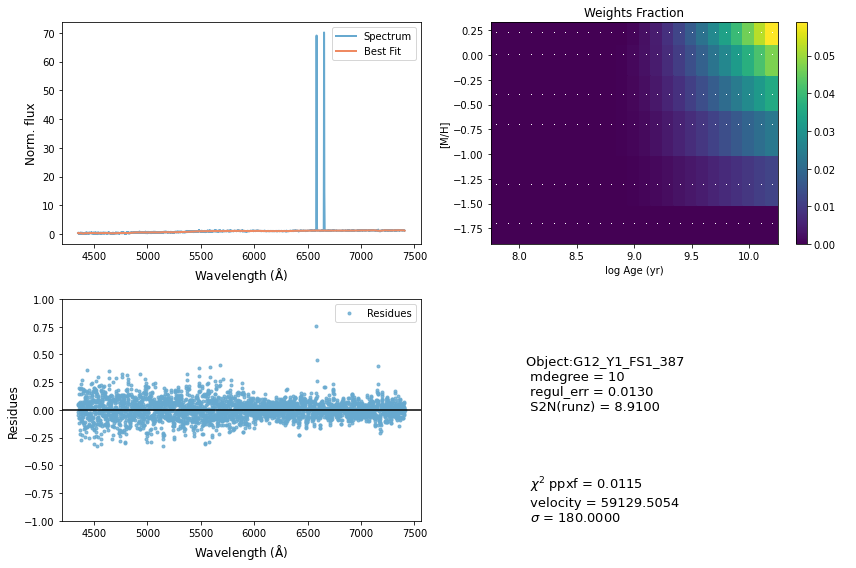

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43774      1000    -0.095    -0.084
 comp.  1:     45774       180
 comp.  2:     45695        73
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.007574
method = capfit; Jac calls: 9; Func calls: 182; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         2   45774   180
Comp:  2       Unknown      0.829         3   45695    73
Comp:  2       Unknown          0       1.8   45695    73
---------------------------------------------------------
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -0.474
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -0.474
M/L_r: 1.485
Current $\chi^2$: 0.0076
Elapsed time in PPXF: 2.23 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


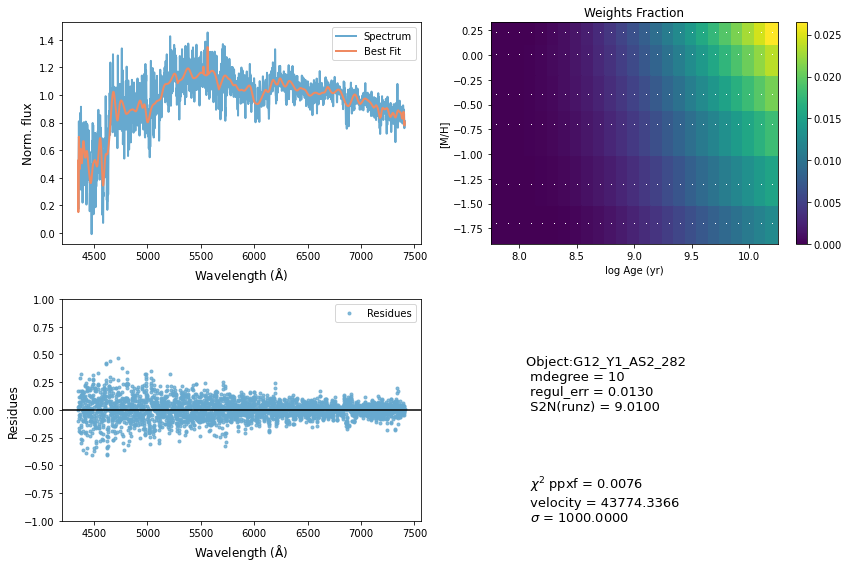

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53592       316     0.010     0.001
 comp.  1:     53911       315
 comp.  2:     53826      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003919
method = capfit; Jac calls: 13; Func calls: 266; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9048       5.2   53911   315
Comp:  2       Unknown      20.05        79   53826  1000
Comp:  2       Unknown          0        78   53826  1000
Comp:  2       Unknown      5.126        11   53826  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.15
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.15
M/L_r: 0.1592
Current $\chi^2$: 0.0039
Elapsed time in PPXF: 4.40 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


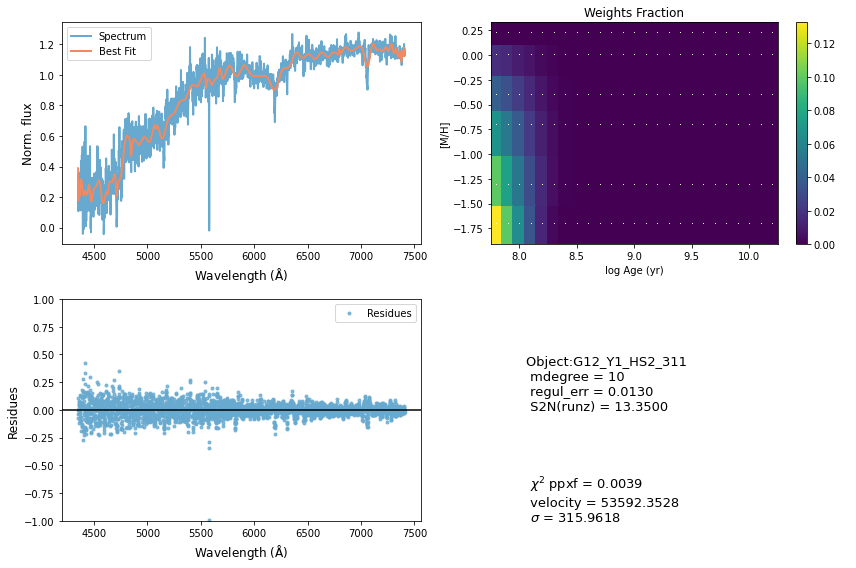

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39583       295     0.020    -0.084
 comp.  1:     39548       372
 comp.  2:     38933      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003561
method = capfit; Jac calls: 13; Func calls: 268; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.907         6   39548   372
Comp:  2       Unknown      2.594       8.8   38933  1000
Comp:  2       Unknown          0       6.3   38933  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -1.11
M/L_r: 1.373
Current $\chi^2$: 0.0036
Elapsed time in PPXF: 3.72 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


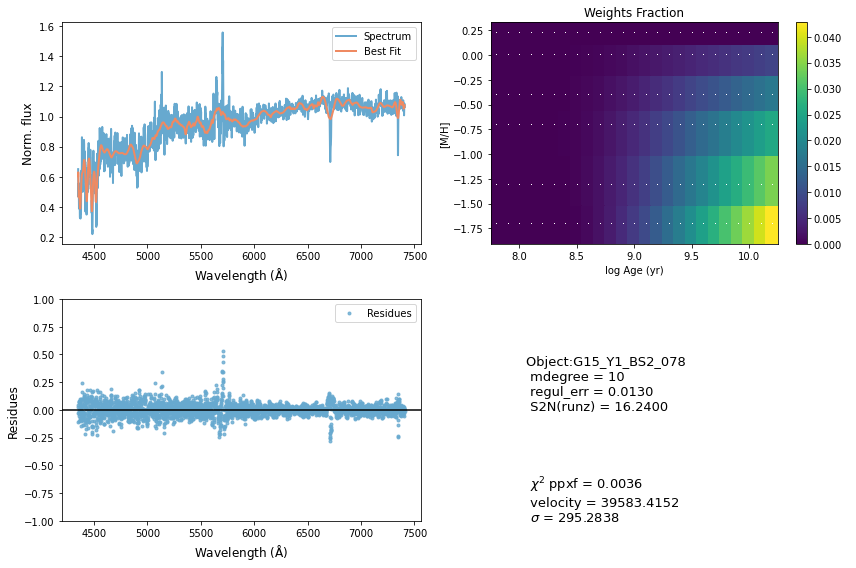

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53038         7     0.002     0.004
 comp.  1:     52958       110
 comp.  2:     53261       154
Gas Reddening E(B-V): 0.123
chi2/DOF: 0.007262
method = capfit; Jac calls: 18; Func calls: 364; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8056       2.6   52958   110
Comp:  2       Unknown          0       8.3   53261   154
Comp:  2       Unknown      2.719       8.4   53261   154
Comp:  2       Unknown          0       4.4   53261   154
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.38
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.38
M/L_r: 0.1587
Current $\chi^2$: 0.0073
Elapsed time in PPXF: 3.61 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


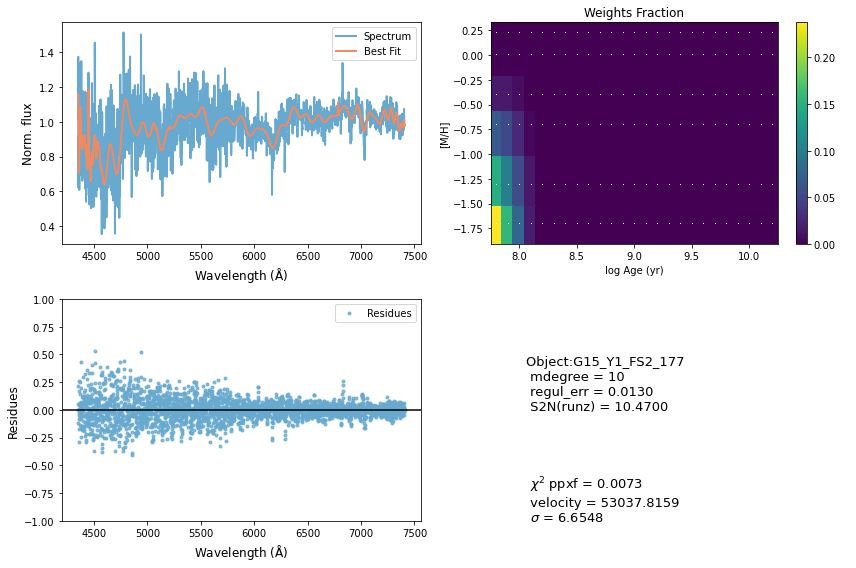

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51641       248     0.007    -0.007
 comp.  1:     51640       348
 comp.  2:     51767        70
Gas Reddening E(B-V): 9.718
chi2/DOF: 0.01517
method = capfit; Jac calls: 7; Func calls: 145; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.846       2.2   51640   348
Comp:  2       Unknown     0.2645       9.4   51767    70
Comp:  2       Unknown          0       9.5   51767    70
Comp:  2       Unknown          0         3   51767    70
---------------------------------------------------------
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.255
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.255
M/L_r: 1.731
Current $\chi^2$: 0.0152
Elapsed time in PPXF: 2.36 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


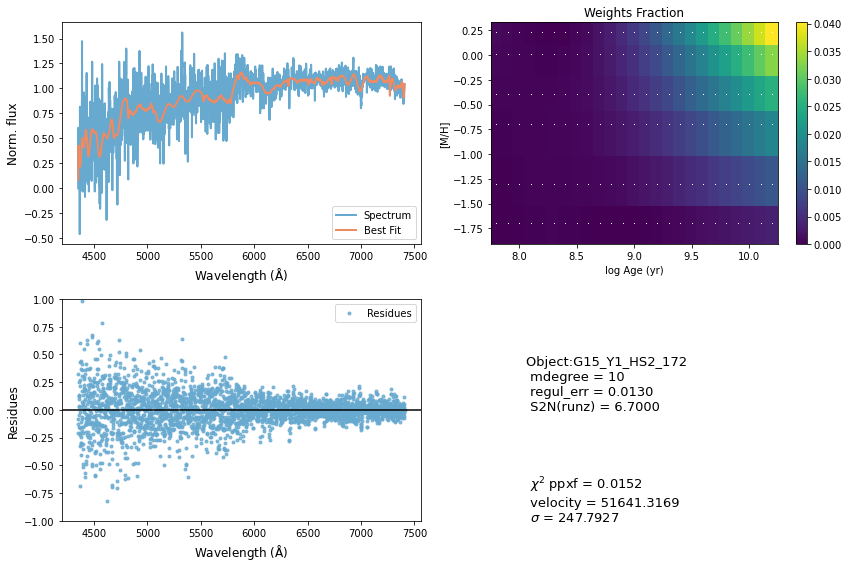

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43758       378    -0.022     0.073
 comp.  1:     45458       180
 comp.  2:     45339        94
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006228
method = capfit; Jac calls: 7; Func calls: 148; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.4   45458   180
Comp:  2       Unknown      1.681       3.4   45339    94
Comp:  2       Unknown          0       1.7   45339    94
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.315
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.315
M/L_r: 2.164
Current $\chi^2$: 0.0062
Elapsed time in PPXF: 1.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


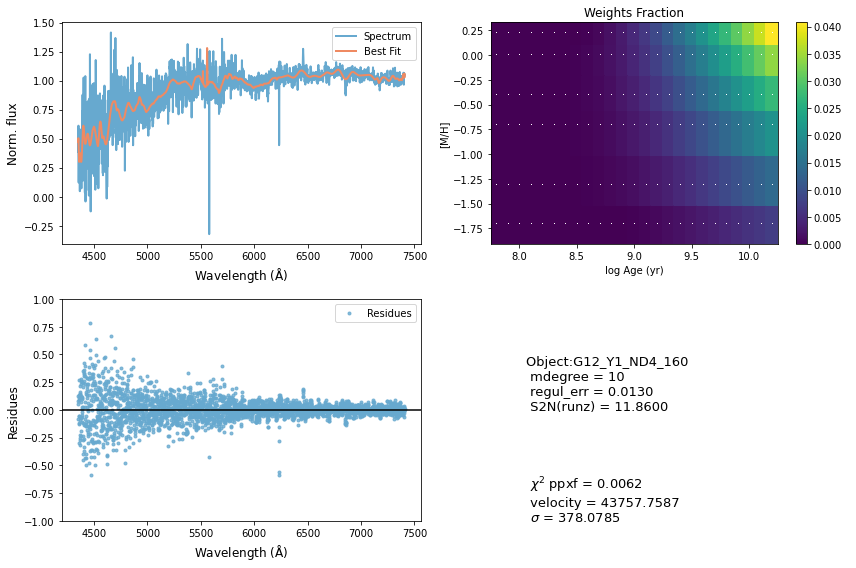

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49164       242    -0.003     0.007
 comp.  1:     49203       180
 comp.  2:     49343       272
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.007117
method = capfit; Jac calls: 5; Func calls: 113; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.8   49203   180
Comp:  2       Unknown      671.6   6.7e+02   49343   272
Comp:  2       Unknown      679.5   6.8e+02   49343   272
Comp:  2       Unknown          0       4.8   49343   272
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.195
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.195
M/L_r: 2.989
Current $\chi^2$: 0.0071
Elapsed time in PPXF: 1.47 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


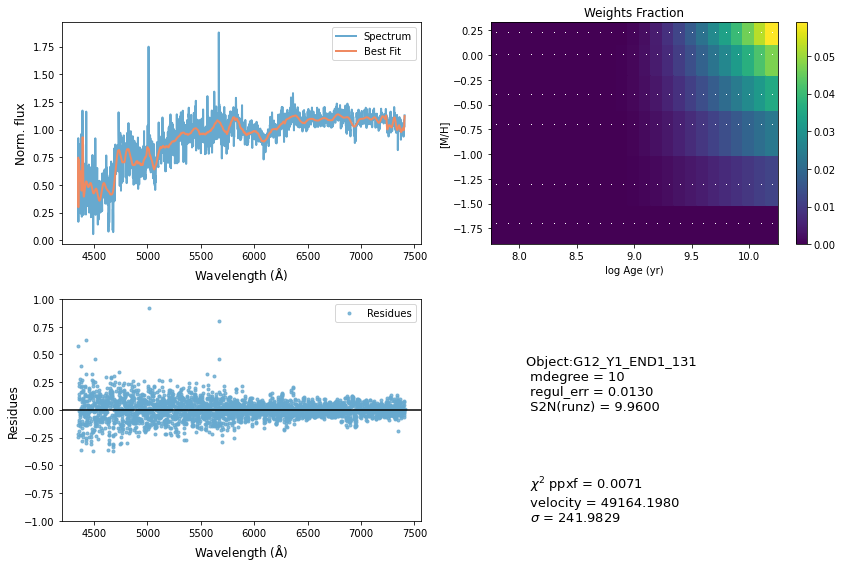

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55360       548    -0.045    -0.039
 comp.  1:     55492       565
 comp.  2:     55532       180
Gas Reddening E(B-V): 2.459
chi2/DOF: 0.00772
method = capfit; Jac calls: 5; Func calls: 106; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6638       3.6   55492   565
Comp:  2       Unknown          0       6.9   55532   180
Comp:  2       Unknown          0       6.7   55532   180
Comp:  2       Unknown          0       4.6   55532   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.34
Weighted <[M/H]>: -1.13
Weighted <logAge> [yr]: 9.34
Weighted <[M/H]>: -1.13
M/L_r: 0.5991
Current $\chi^2$: 0.0077
Elapsed time in PPXF: 1.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


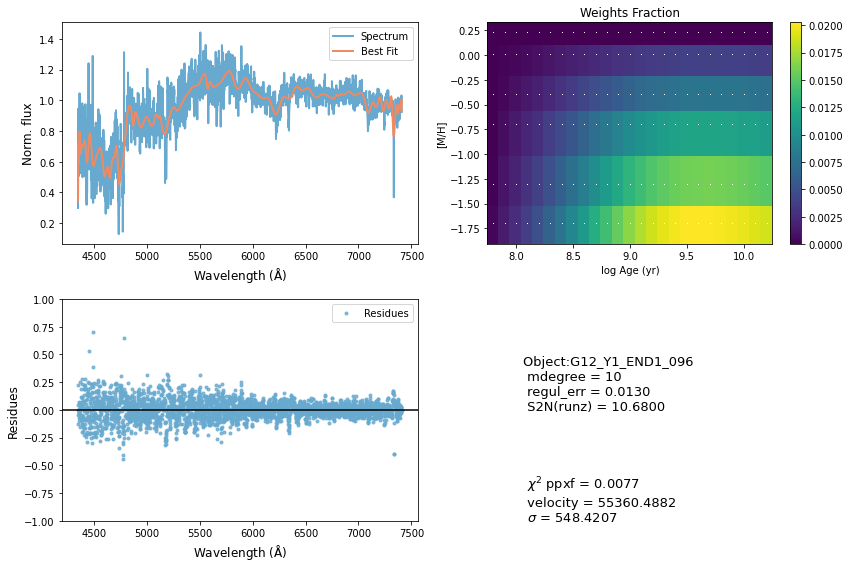

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55268       760     0.021     0.027
 comp.  1:     55309       361
 comp.  2:     55008       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003771
method = capfit; Jac calls: 6; Func calls: 127; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.295       6.1   55309   361
Comp:  2       Unknown          0       5.8   55008   180
Comp:  2       Unknown          0       5.8   55008   180
Comp:  2       Unknown          0       5.4   55008   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.56
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.56
M/L_r: 0.1891
Current $\chi^2$: 0.0038
Elapsed time in PPXF: 1.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


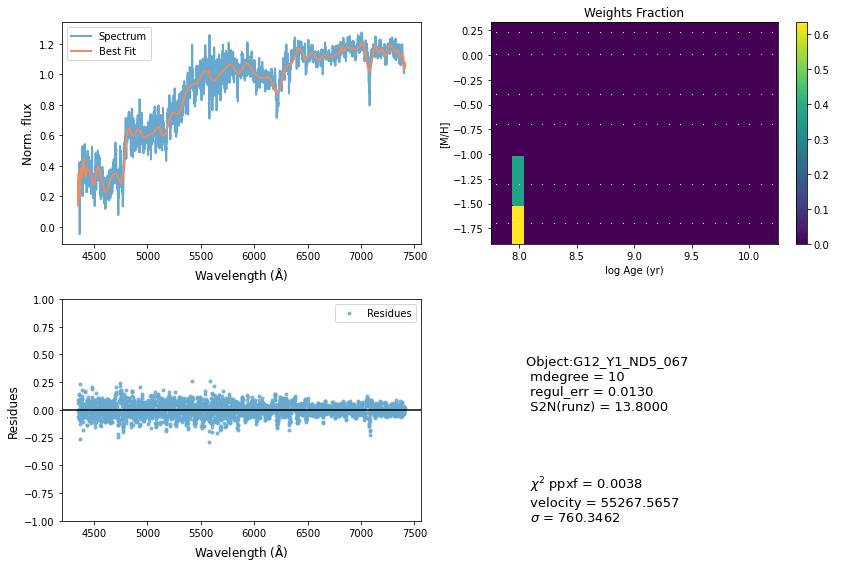

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41673       180     0.000     0.000
 comp.  1:     41673       180
 comp.  2:     41673       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005607
method = capfit; Jac calls: 1; Func calls: 24; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  48 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1021       3.7   41673   180
Comp:  2       Unknown          0       4.4   41673   180
Comp:  2       Unknown          0       2.5   41673   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.93
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.93
Weighted <[M/H]>: -0.194
M/L_r: 3.511
Current $\chi^2$: 0.0056
Elapsed time in PPXF: 0.31 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


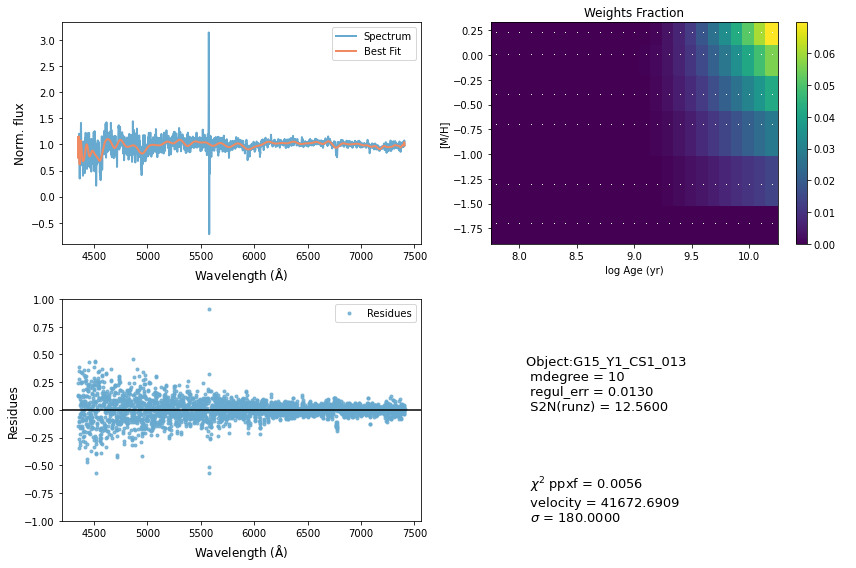

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     73161       796     0.028    -0.009
 comp.  1:     74456       180
 comp.  2:     74849       134
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01903
method = capfit; Jac calls: 9; Func calls: 186; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  8 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   74456   180
Comp:  2       Unknown       2.76       8.3   74849   134
Comp:  2       Unknown          0       6.5   74849   134
Comp:  2       Unknown      1.422       2.9   74849   134
---------------------------------------------------------
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.04
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -1.04
M/L_r: 0.1659
Current $\chi^2$: 0.0190
Elapsed time in PPXF: 2.23 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


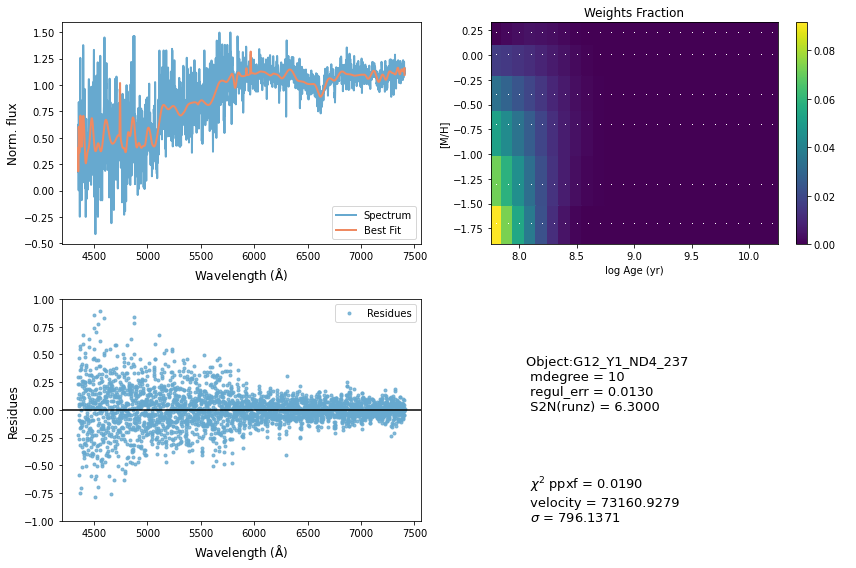

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60711      1000    -0.037     0.089
 comp.  1:     60958       718
 comp.  2:     60828        43
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003854
method = capfit; Jac calls: 11; Func calls: 232; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  103 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.55       8.4   60958   718
Comp:  2       Unknown      0.956       4.3   60828    43
Comp:  2       Unknown          0       4.1   60828    43
Comp:  2       Unknown     0.3532       2.5   60828    43
---------------------------------------------------------
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -0.901
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -0.901
M/L_r: 1.027
Current $\chi^2$: 0.0039
Elapsed time in PPXF: 3.28 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


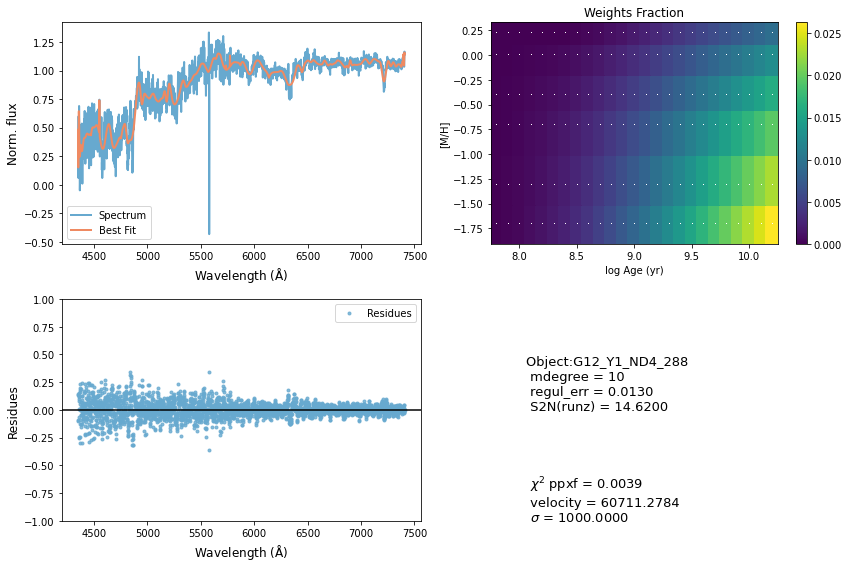

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50723       834     0.074    -0.029
 comp.  1:     50407       180
 comp.  2:     50430       225
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00549
method = capfit; Jac calls: 7; Func calls: 146; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  83 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.5   50407   180
Comp:  2       Unknown          0       8.1   50430   225
Comp:  2       Unknown     0.7535       8.2   50430   225
Comp:  2       Unknown     0.9571       5.2   50430   225
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.357
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.357
M/L_r: 2.16
Current $\chi^2$: 0.0055
Elapsed time in PPXF: 1.76 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


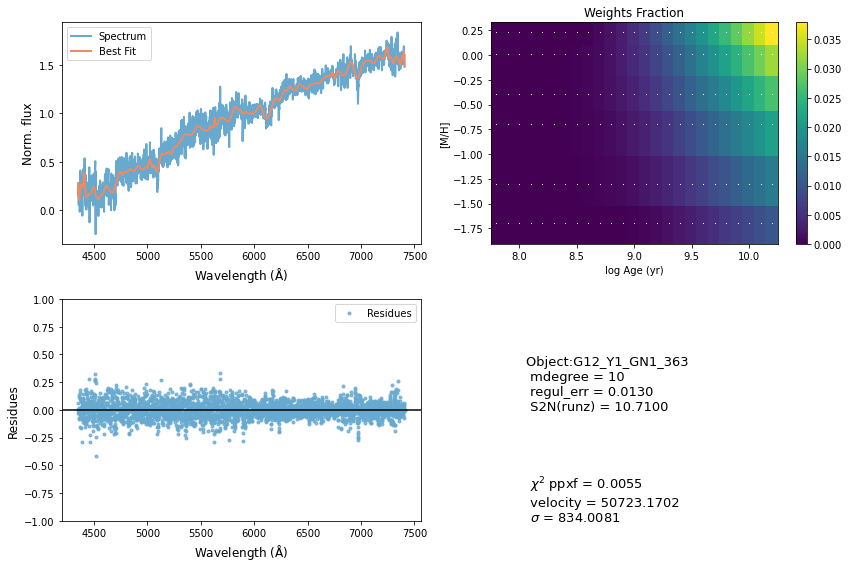

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48953      1000    -0.022    -0.022
 comp.  1:     50953       180
 comp.  2:     50912       126
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009528
method = capfit; Jac calls: 1; Func calls: 22; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.3   50953   180
Comp:  2       Unknown          0         5   50912   126
Comp:  2       Unknown          0         5   50912   126
Comp:  2       Unknown     0.5418       3.9   50912   126
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0095
Elapsed time in PPXF: 0.19 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: invalid value encountered in true_divide


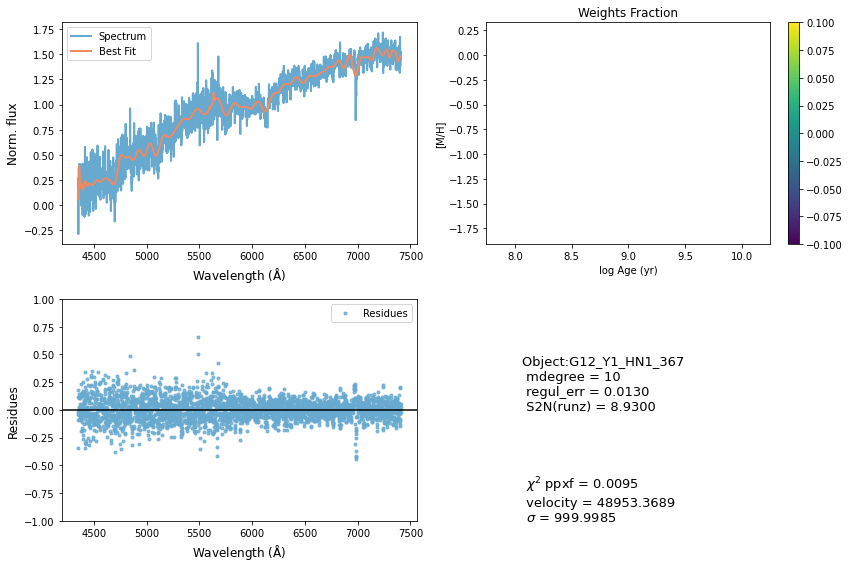

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68818       156    -0.014    -0.013
 comp.  1:     69127       370
 comp.  2:     68613        98
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01288
method = capfit; Jac calls: 9; Func calls: 190; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  49 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.726       5.7   69127   370
Comp:  2       Unknown     0.9903       3.9   68613    98
Comp:  2       Unknown          0       3.8   68613    98
Comp:  2       Unknown     0.8715       2.8   68613    98
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.194
M/L_r: 3.14
Current $\chi^2$: 0.0129
Elapsed time in PPXF: 1.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


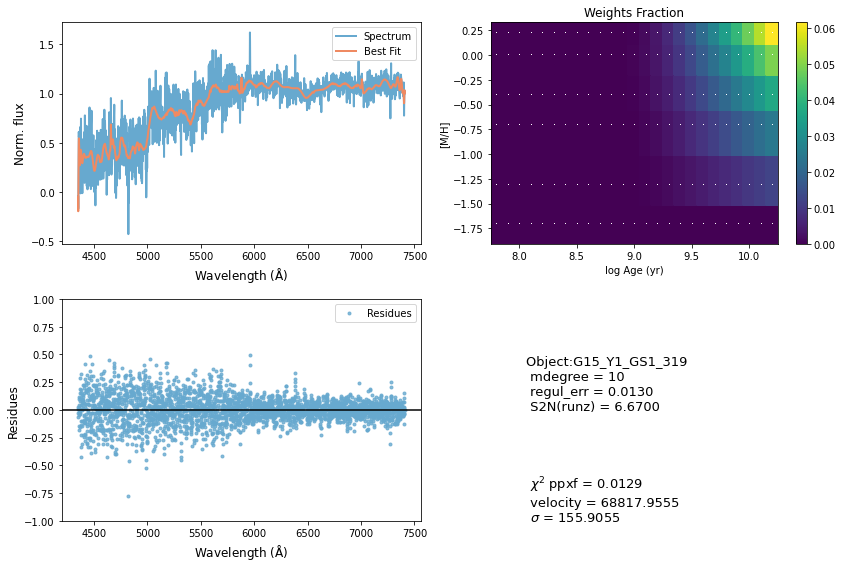

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64076       310    -0.011     0.000
 comp.  1:     64218       412
 comp.  2:     63920       180
Gas Reddening E(B-V): 0.319
chi2/DOF: 0.05128
method = capfit; Jac calls: 7; Func calls: 147; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.819         5   64218   412
Comp:  2       Unknown          0       6.8   63920   180
Comp:  2       Unknown          0       6.8   63920   180
Comp:  2       Unknown          0       4.2   63920   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.517
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.517
M/L_r: 2.26
Current $\chi^2$: 0.0513
Elapsed time in PPXF: 1.82 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


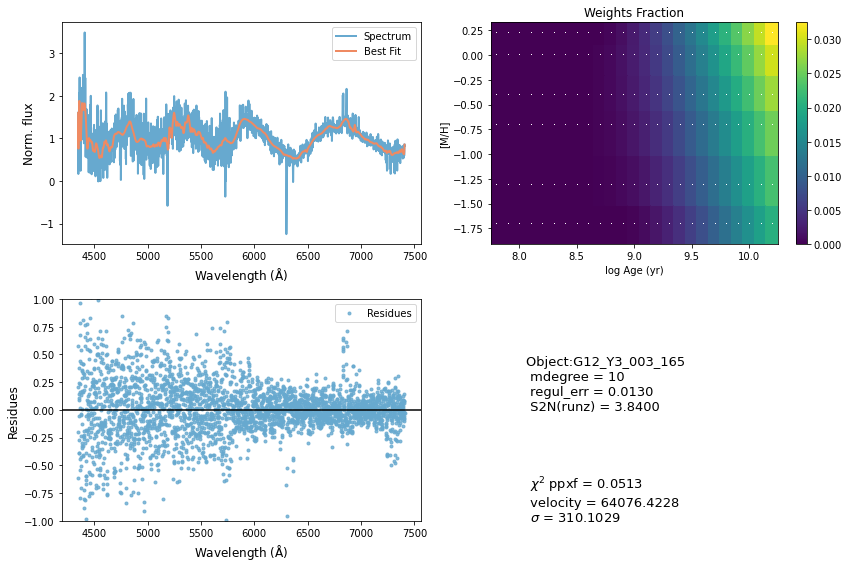

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47697       732     0.209     0.087
 comp.  1:     47209       270
 comp.  2:     47523        69
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003654
method = capfit; Jac calls: 8; Func calls: 172; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  66 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9041       4.8   47209   270
Comp:  2       Unknown     0.0432       3.8   47523    69
Comp:  2       Unknown          0       3.7   47523    69
Comp:  2       Unknown          0       3.1   47523    69
Comp:  2       Unknown    0.08476       1.7   47523    69
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.199
M/L_r: 2.736
Current $\chi^2$: 0.0037
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


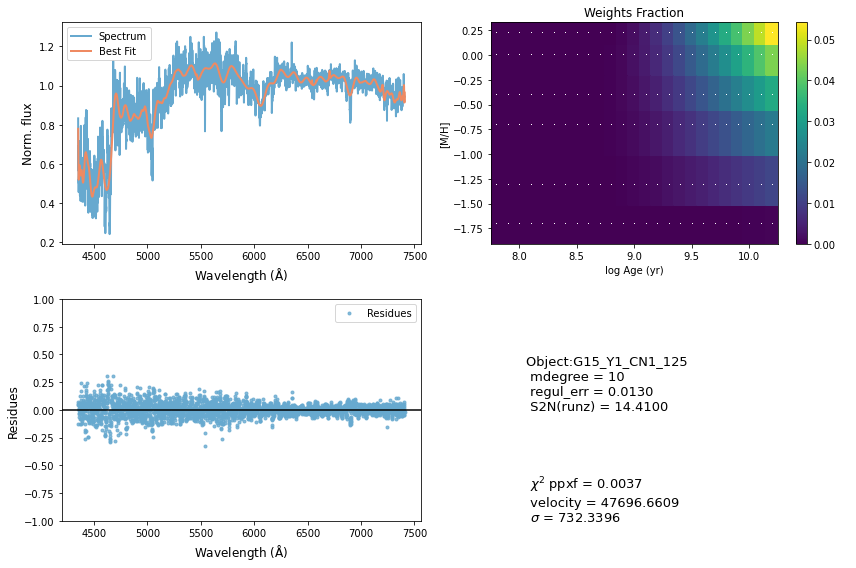

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35280       424     0.012    -0.001
 comp.  1:     35076       204
 comp.  2:     35491       128
Gas Reddening E(B-V): 6.378
chi2/DOF: 0.004803
method = capfit; Jac calls: 9; Func calls: 185; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.08097       2.6   35076   204
Comp:  2       Unknown      1.085       3.5   35491   128
Comp:  2       Unknown          0       2.7   35491   128
Comp:  2       Unknown    0.08859       2.7   35491   128
---------------------------------------------------------
Weighted <logAge> [yr]: 7.99
Weighted <[M/H]>: -1.04
Weighted <logAge> [yr]: 7.99
Weighted <[M/H]>: -1.04
M/L_r: 0.166
Current $\chi^2$: 0.0048
Elapsed time in PPXF: 2.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


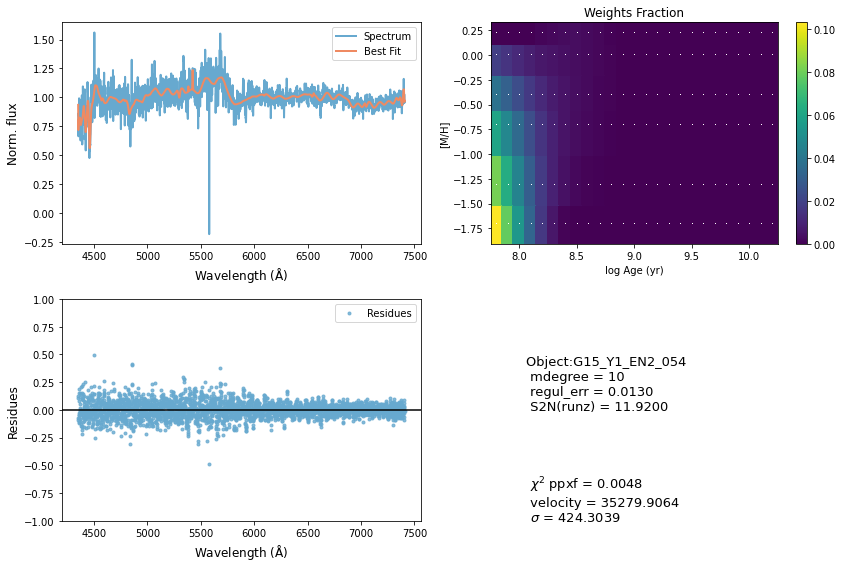

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39728       280     0.106     0.046
 comp.  1:     39373       180
 comp.  2:     39373       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003216
method = capfit; Jac calls: 7; Func calls: 146; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  90 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   39373   180
Comp:  2       Unknown          0         4   39373   180
Comp:  2       Unknown          0       2.9   39373   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.304
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.304
M/L_r: 1.917
Current $\chi^2$: 0.0032
Elapsed time in PPXF: 1.77 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


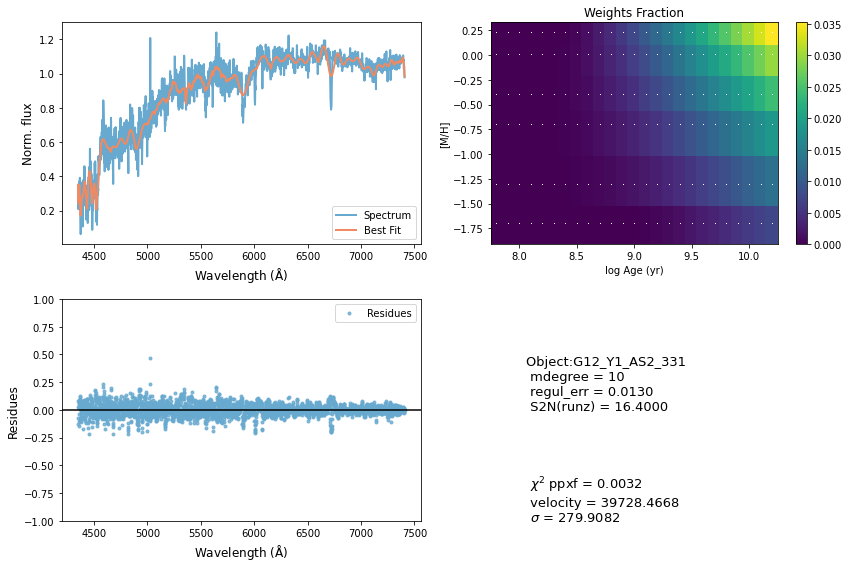

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49800       180     0.000     0.000
 comp.  1:     49800       180
 comp.  2:     49800       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003487
method = capfit; Jac calls: 1; Func calls: 25; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.6   49800   180
Comp:  2       Unknown          0       6.4   49800   180
Comp:  2       Unknown       1.08       6.6   49800   180
Comp:  2       Unknown          0       4.7   49800   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.159
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.159
M/L_r: 6.498
Current $\chi^2$: 0.0035
Elapsed time in PPXF: 0.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


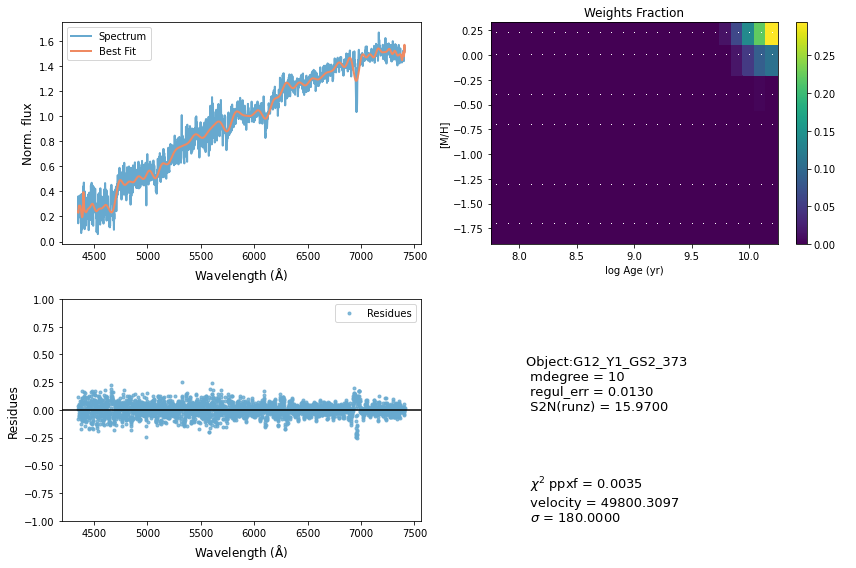

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52053      1000    -0.034     0.069
 comp.  1:     53931        86
 comp.  2:     54385       259
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007927
method = capfit; Jac calls: 7; Func calls: 158; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  68 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6387       2.7   53931    86
Comp:  2       Unknown    0.08594        11   54385   259
Comp:  2       Unknown        4.9        11   54385   259
Comp:  2       Unknown      1.346       6.1   54385   259
---------------------------------------------------------
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -1.11
M/L_r: 1.115
Current $\chi^2$: 0.0079
Elapsed time in PPXF: 2.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


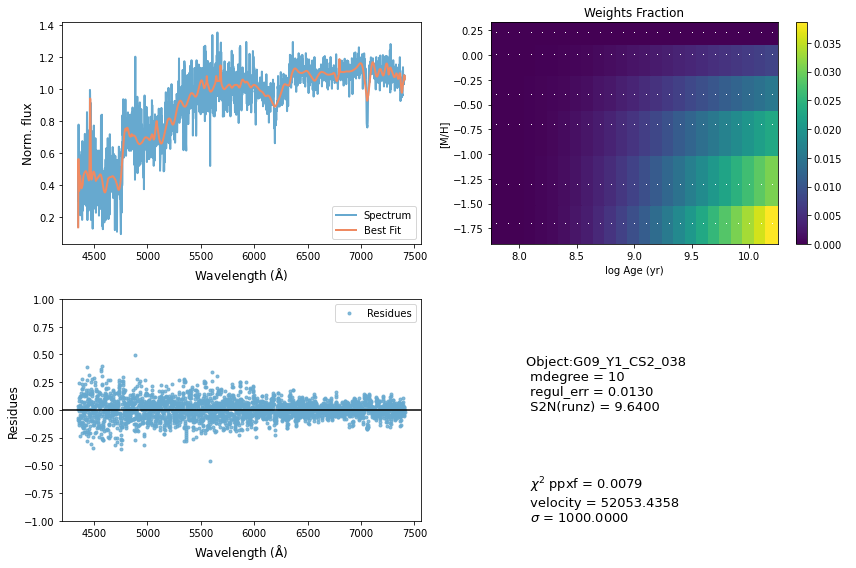

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47454       762    -0.015     0.014
 comp.  1:     47552       131
 comp.  2:     47658        56
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004281
method = capfit; Jac calls: 8; Func calls: 167; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6934       3.9   47552   131
Comp:  2       Unknown     0.5521       3.2   47658    56
Comp:  2       Unknown      0.224       3.1   47658    56
Comp:  2       Unknown    0.03526       2.8   47658    56
Comp:  2       Unknown          0       1.9   47658    56
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.279
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.279
M/L_r: 2.454
Current $\chi^2$: 0.0043
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


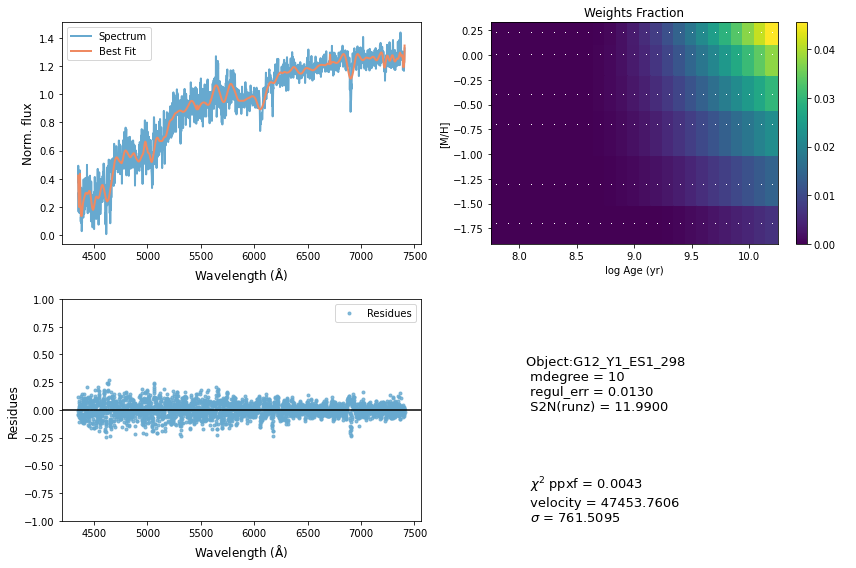

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45986       214    -0.003    -0.002
 comp.  1:     46434       179
 comp.  2:     46542       143
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01281
method = capfit; Jac calls: 13; Func calls: 269; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  52 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.7   46434   179
Comp:  2       Unknown      6.824       5.6   46542   143
Comp:  2       Unknown      1.861         6   46542   143
Comp:  2       Unknown          0       2.2   46542   143
---------------------------------------------------------
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.493
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.493
M/L_r: 1.82
Current $\chi^2$: 0.0128
Elapsed time in PPXF: 4.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


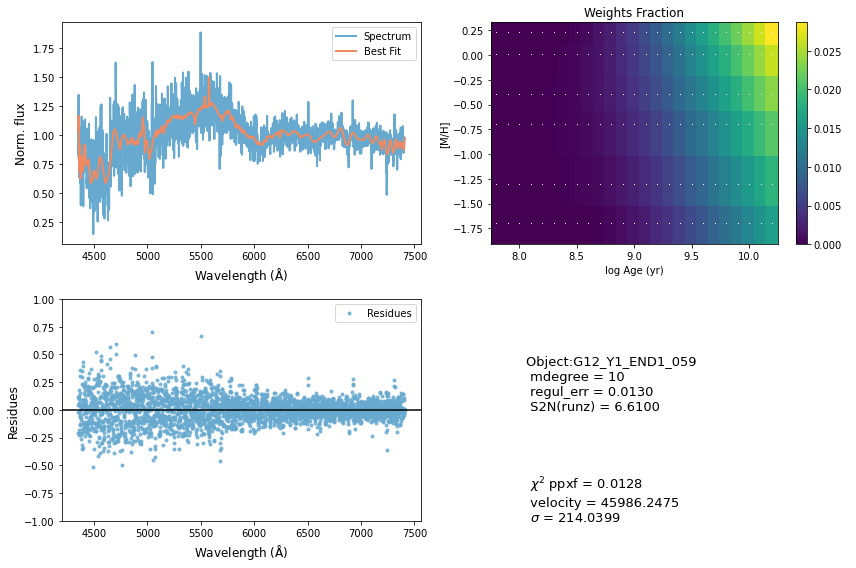

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44368       705    -0.067     0.018
 comp.  1:     42416       266
 comp.  2:     42373       221
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003051
method = capfit; Jac calls: 7; Func calls: 150; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  117 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.5   42416   266
Comp:  2       Unknown     0.3411       4.6   42373   221
Comp:  2       Unknown     0.1159       2.9   42373   221
---------------------------------------------------------
Weighted <logAge> [yr]: 9.45
Weighted <[M/H]>: -0.33
Weighted <logAge> [yr]: 9.45
Weighted <[M/H]>: -0.33
M/L_r: 0.7027
Current $\chi^2$: 0.0031
Elapsed time in PPXF: 1.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


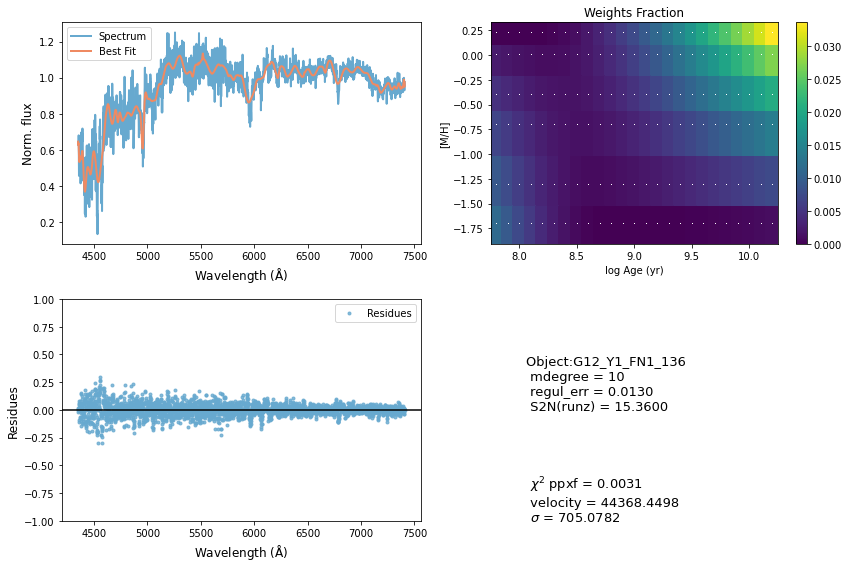

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34492       409    -0.003    -0.004
 comp.  1:     34114       181
 comp.  2:     33874       100
Gas Reddening E(B-V): 8.653
chi2/DOF: 0.003136
method = capfit; Jac calls: 8; Func calls: 164; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1833       2.2   34114   181
Comp:  2       Unknown     0.4737         3   33874   100
Comp:  2       Unknown          0       2.3   33874   100
Comp:  2       Unknown     0.1109       2.2   33874   100
---------------------------------------------------------
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.1
M/L_r: 0.1598
Current $\chi^2$: 0.0031
Elapsed time in PPXF: 2.19 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


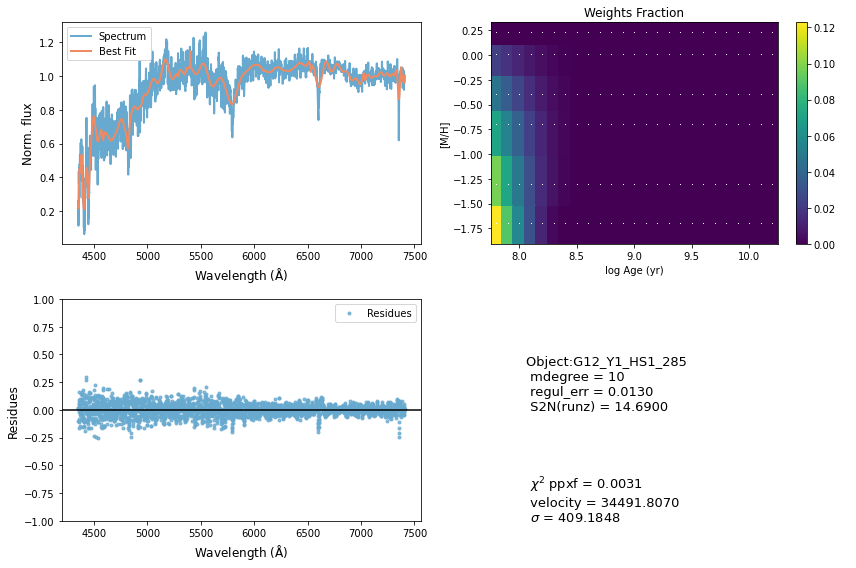

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35323       475    -0.011    -0.004
 comp.  1:     37169        89
 comp.  2:     37186       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02053
method = capfit; Jac calls: 7; Func calls: 147; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7884       2.9   37169    89
Comp:  2       Unknown          0       4.6   37186   180
Comp:  2       Unknown          0       2.5   37186   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.228
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.228
M/L_r: 2.391
Current $\chi^2$: 0.0205
Elapsed time in PPXF: 2.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


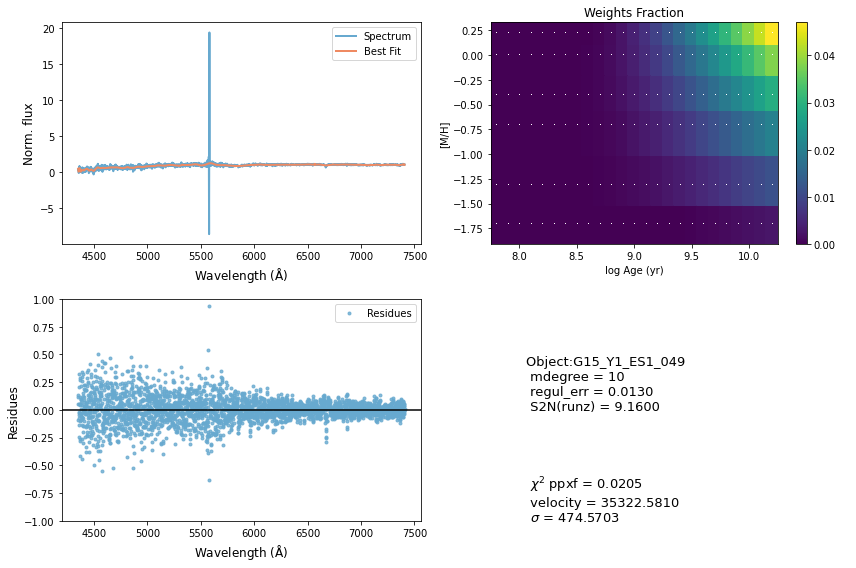

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     69084       777     0.075     0.052
 comp.  1:     69376      1000
 comp.  2:     69131        88
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.002841
method = capfit; Jac calls: 10; Func calls: 212; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  66 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      17.15        11   69376  1000
Comp:  2       Unknown          0       3.1   69131    88
Comp:  2       Unknown          0         3   69131    88
Comp:  2       Unknown     0.2266       3.8   69131    88
---------------------------------------------------------
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.244
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.244
M/L_r: 2.091
Current $\chi^2$: 0.0028
Elapsed time in PPXF: 3.19 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


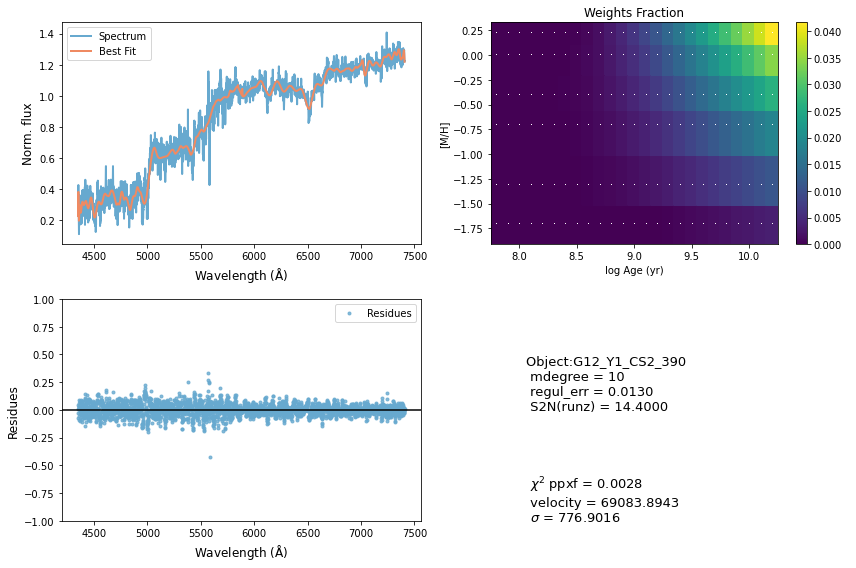

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     65958       180     0.000     0.000
 comp.  1:     65958       180
 comp.  2:     65958       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004694
method = capfit; Jac calls: 1; Func calls: 22; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.1   65958   180
Comp:  2       Unknown          0       6.3   65958   180
Comp:  2       Unknown     0.1268       6.4   65958   180
Comp:  2       Unknown     0.8732         4   65958   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0047
Elapsed time in PPXF: 0.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: invalid value encountered in true_divide


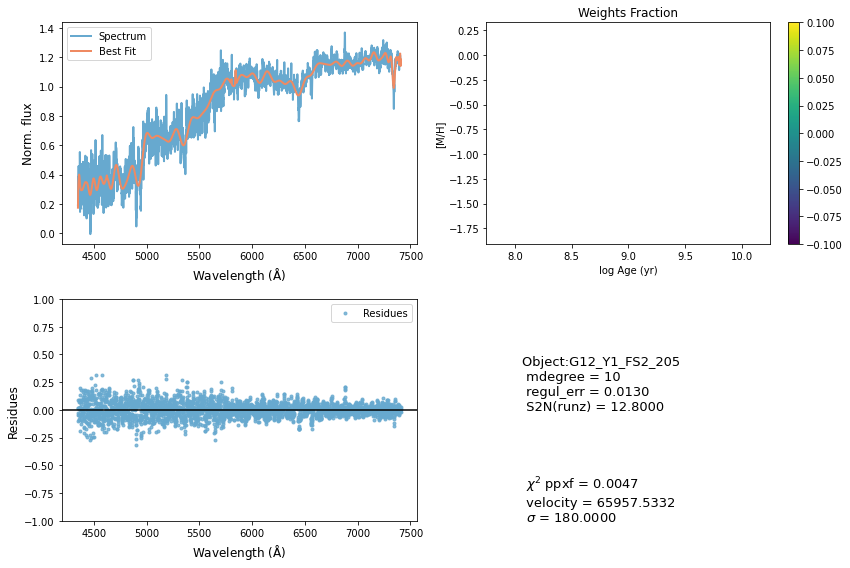

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64953       180     0.000     0.000
 comp.  1:     64953       180
 comp.  2:     64953       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004569
method = capfit; Jac calls: 1; Func calls: 22; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.1   64953   180
Comp:  2       Unknown          0       5.4   64953   180
Comp:  2       Unknown          0       5.4   64953   180
Comp:  2       Unknown     0.1926       4.5   64953   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0046
Elapsed time in PPXF: 0.21 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: invalid value encountered in true_divide


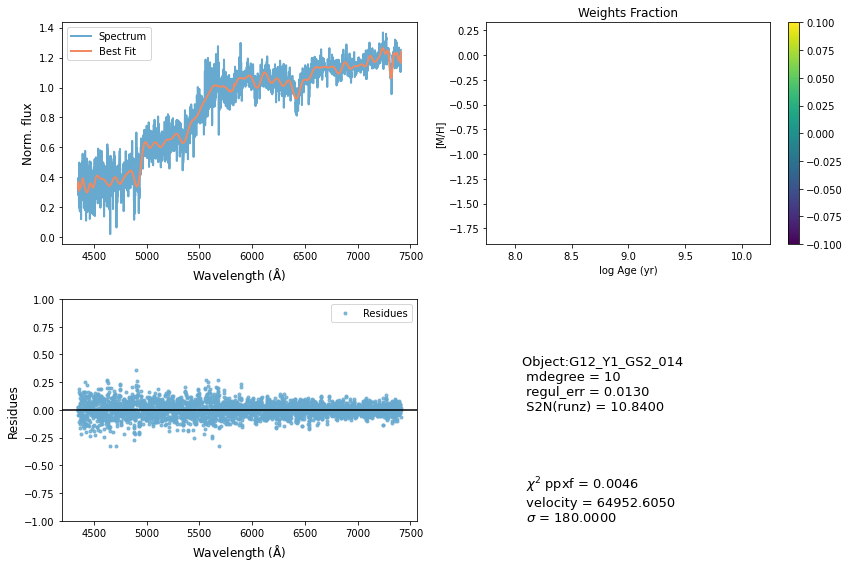

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49756       352     0.022     0.001
 comp.  1:     47914        83
 comp.  2:     48041       223
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005831
method = capfit; Jac calls: 12; Func calls: 248; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  39 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3014       2.6   47914    83
Comp:  2       Unknown          0        11   48041   223
Comp:  2       Unknown      11.06        11   48041   223
Comp:  2       Unknown          0       4.6   48041   223
Comp:  2       Unknown     0.4374       2.7   48041   223
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.291
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.291
M/L_r: 2.81
Current $\chi^2$: 0.0058
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


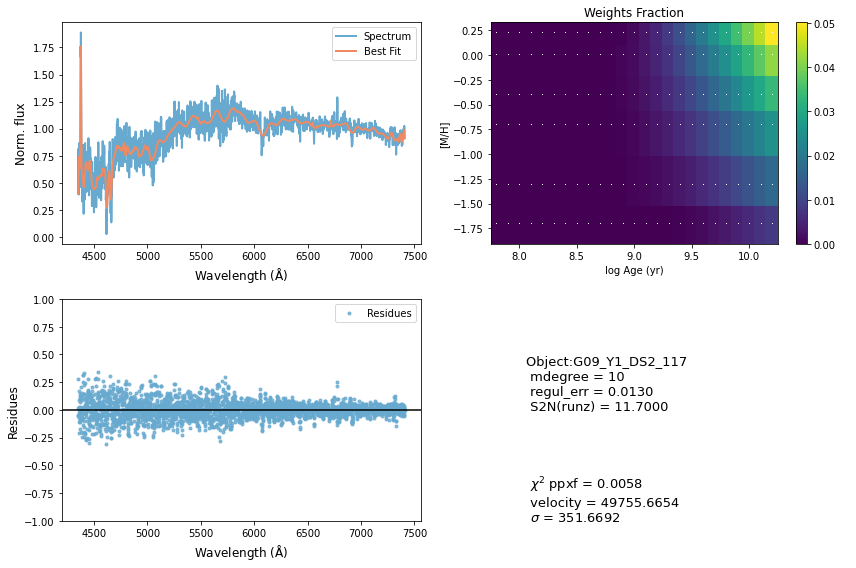

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48290        41     0.000     0.000
 comp.  1:     50332        44
 comp.  2:     50392        39
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004185
method = capfit; Jac calls: 11; Func calls: 230; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2374       2.5   50332    44
Comp:  2       Unknown    0.06084       2.7   50392    39
Comp:  2       Unknown          0       2.7   50392    39
Comp:  2       Unknown     0.4509       2.9   50392    39
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.079
Current $\chi^2$: 0.0042
Elapsed time in PPXF: 3.01 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


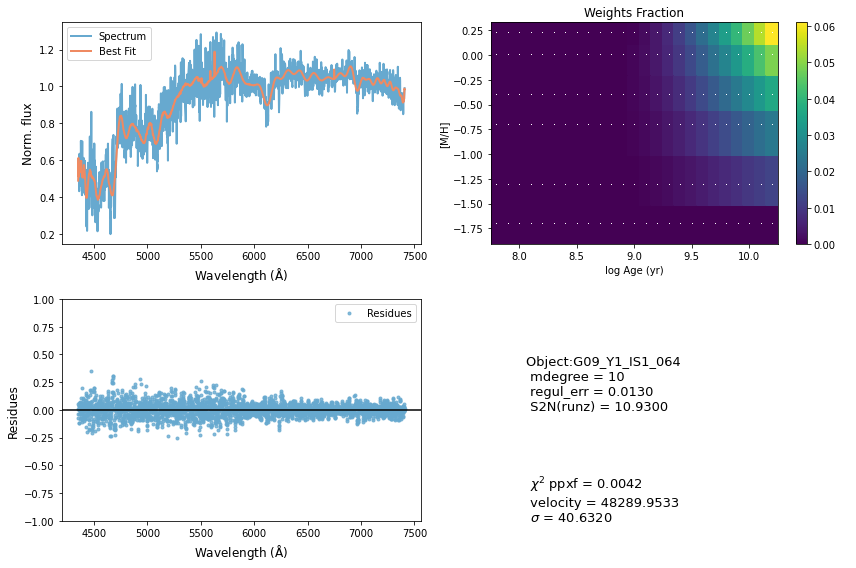

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64094       180     0.000     0.000
 comp.  1:     64094       180
 comp.  2:     64094       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004535
method = capfit; Jac calls: 1; Func calls: 22; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.2   64094   180
Comp:  2       Unknown          0         5   64094   180
Comp:  2       Unknown          0       5.1   64094   180
Comp:  2       Unknown     0.4887       4.6   64094   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0045
Elapsed time in PPXF: 0.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: invalid value encountered in true_divide


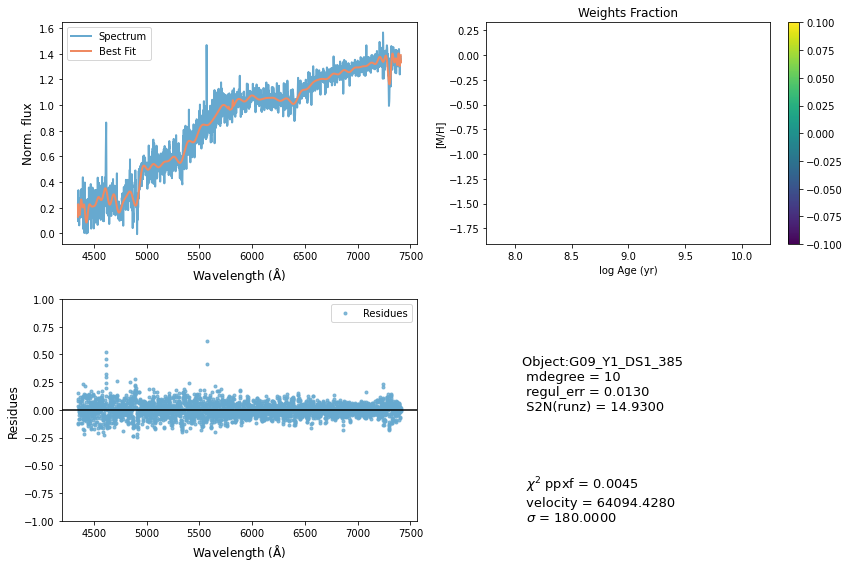

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60243       367    -0.002    -0.004
 comp.  1:     60031       180
 comp.  2:     60315       377
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.01477
method = capfit; Jac calls: 12; Func calls: 245; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.5   60031   180
Comp:  2       Unknown          0   2.6e+02   60315   377
Comp:  2       Unknown      15.44   2.7e+02   60315   377
Comp:  2       Unknown       1.41       5.8   60315   377
---------------------------------------------------------
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.316
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.316
M/L_r: 1.52
Current $\chi^2$: 0.0148
Elapsed time in PPXF: 3.57 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


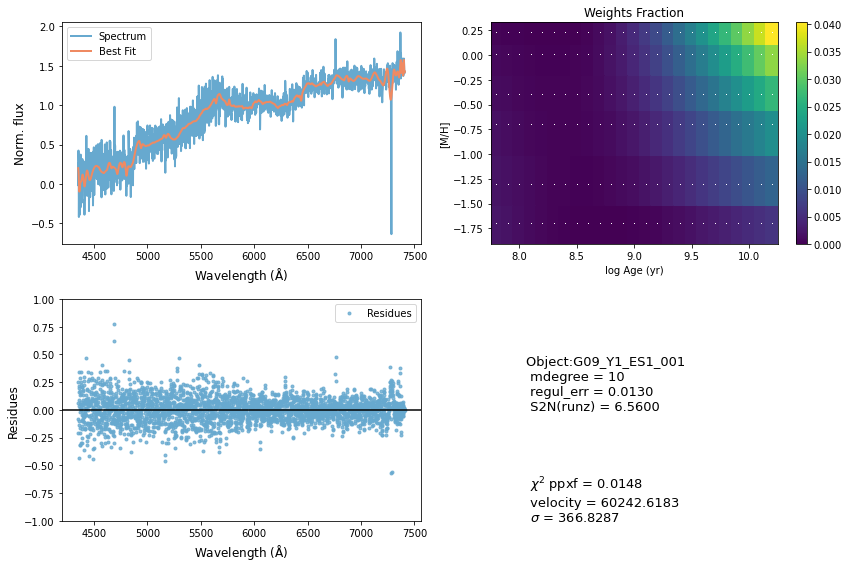

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35726       192    -0.021     0.139
 comp.  1:     35981       180
 comp.  2:     36307        29
Gas Reddening E(B-V): 3.644
chi2/DOF: 0.01023
method = capfit; Jac calls: 12; Func calls: 242; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.3   35981   180
Comp:  2       Unknown      1.639       2.4   36307    29
Comp:  2       Unknown          0       1.6   36307    29
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.195
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.195
M/L_r: 2.863
Current $\chi^2$: 0.0102
Elapsed time in PPXF: 3.74 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


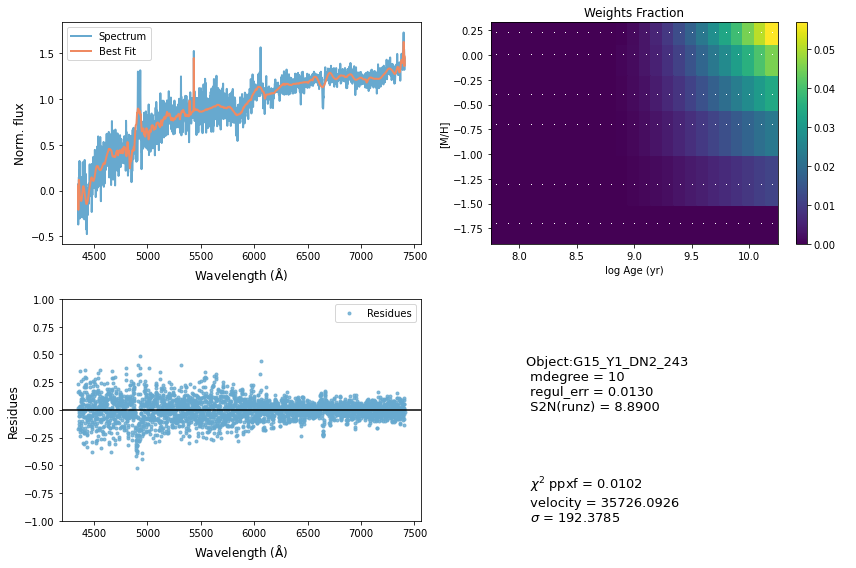

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34447       281     0.014    -0.007
 comp.  1:     34442       350
 comp.  2:     33646       193
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003161
method = capfit; Jac calls: 20; Func calls: 414; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  20 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.197       9.1   34442   350
Comp:  2       Unknown      1.137       4.2   33646   193
Comp:  2       Unknown          0       3.2   33646   193
Comp:  2       Unknown          0       4.7   33646   193
---------------------------------------------------------
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.08
M/L_r: 0.1617
Current $\chi^2$: 0.0032
Elapsed time in PPXF: 5.50 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


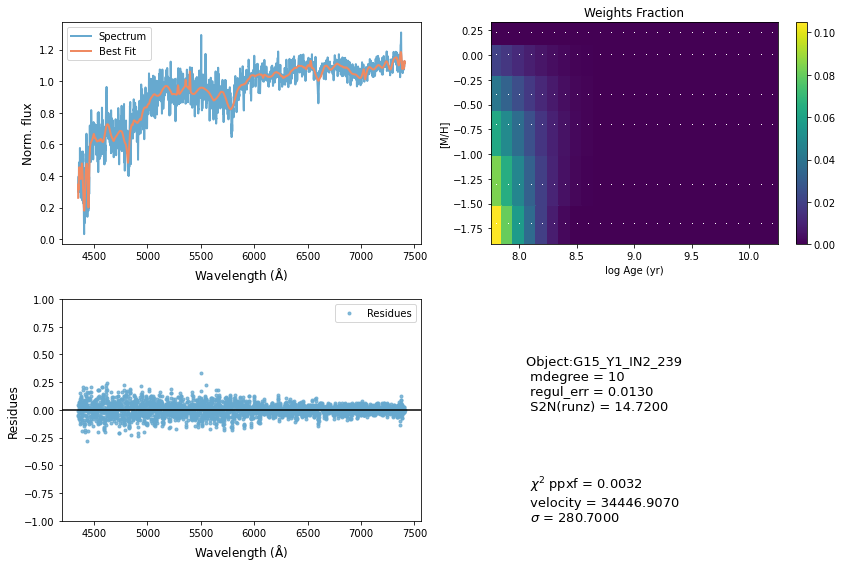

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39040       200     0.300     0.300
 comp.  1:     38990       210
 comp.  2:     39410       324
Gas Reddening E(B-V): 1.281
chi2/DOF: 0.04447
method = capfit; Jac calls: 12; Func calls: 253; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      29.68       2.3   38990   210
Comp:  2       Unknown      2.425       5.2   39410   324
Comp:  2       Unknown          0       3.1   39410   324
---------------------------------------------------------
Weighted <logAge> [yr]: 8.1
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 8.1
Weighted <[M/H]>: -1.12
M/L_r: 0.1718
Current $\chi^2$: 0.0445
Elapsed time in PPXF: 3.24 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


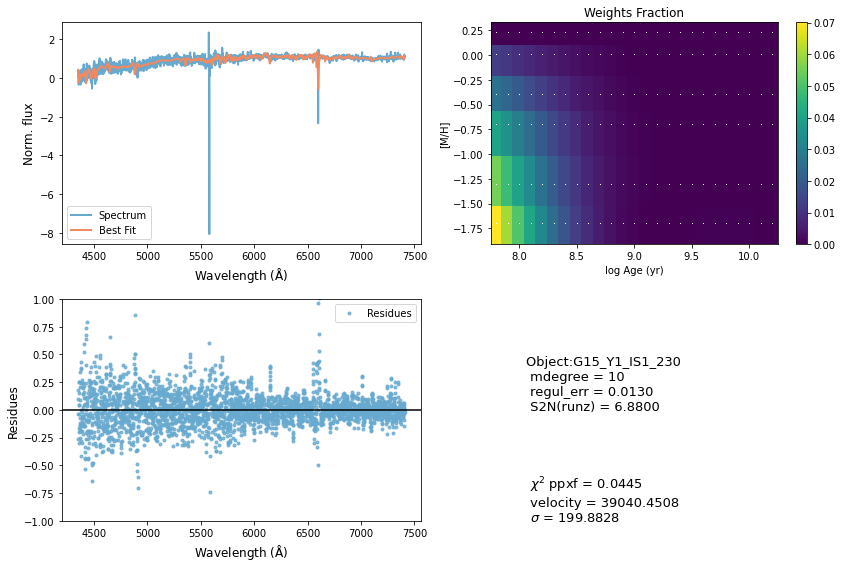

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47688       759     0.022    -0.018
 comp.  1:     45082       702
 comp.  2:     45665       153
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003033
method = capfit; Jac calls: 8; Func calls: 168; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  78 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.397       8.3   45082   702
Comp:  2       Unknown     0.5951       4.1   45665   153
Comp:  2       Unknown          0       2.6   45665   153
---------------------------------------------------------
Weighted <logAge> [yr]: 9.63
Weighted <[M/H]>: -0.242
Weighted <logAge> [yr]: 9.63
Weighted <[M/H]>: -0.242
M/L_r: 1.444
Current $\chi^2$: 0.0030
Elapsed time in PPXF: 2.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


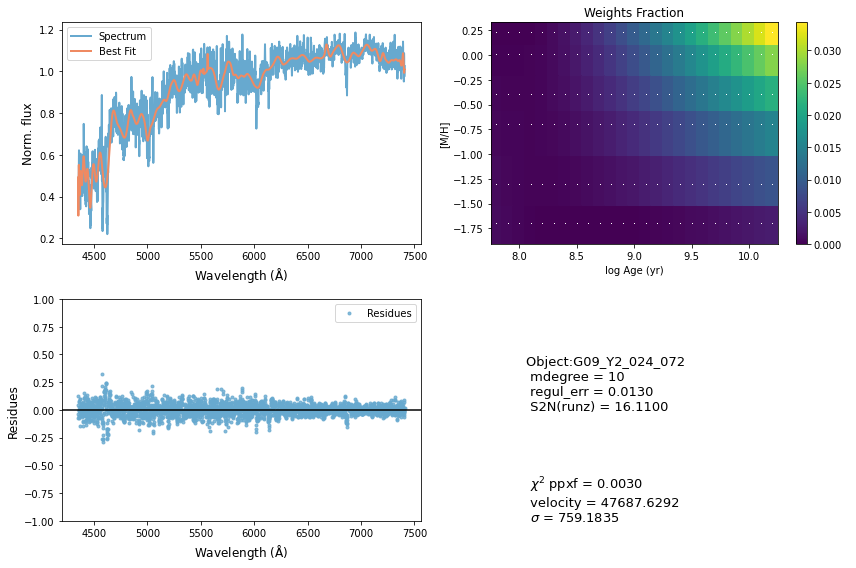

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47291        99    -0.050    -0.008
 comp.  1:     47335        91
 comp.  2:     47968        22
Gas Reddening E(B-V): 6.797
chi2/DOF: 0.009411
method = capfit; Jac calls: 9; Func calls: 190; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5156       1.4   47335    91
Comp:  2       Unknown   0.001645      0.22   47968    22
Comp:  2       Unknown   0.009986      0.27   47968    22
Comp:  2       Unknown      1.019       2.7   47968    22
Comp:  2       Unknown    0.05615       1.3   47968    22
---------------------------------------------------------
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -0.129
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -0.129
M/L_r: 0.2231
Current $\chi^2$: 0.0094
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


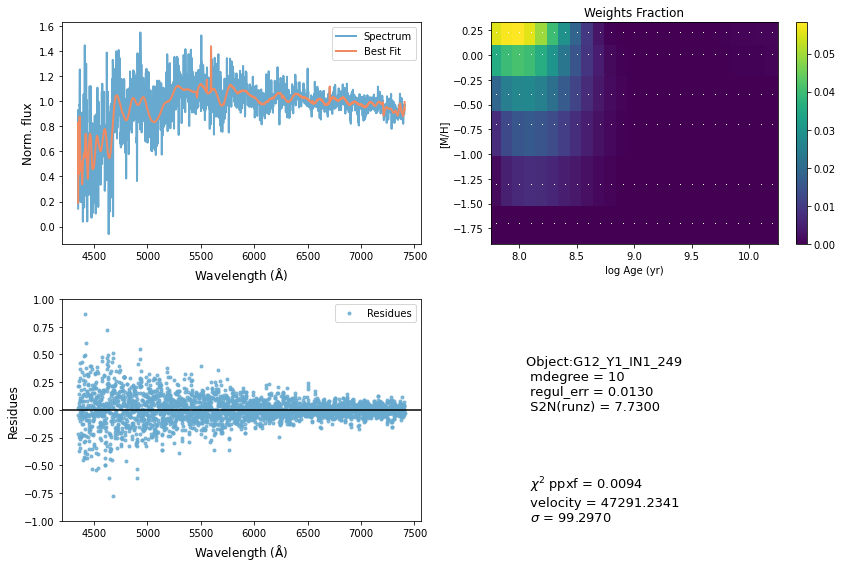

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41949       846    -0.059    -0.035
 comp.  1:     43949       180
 comp.  2:     43810       420
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004171
method = capfit; Jac calls: 7; Func calls: 149; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  72 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.1   43949   180
Comp:  2       Unknown     0.5488       6.2   43810   420
Comp:  2       Unknown     0.5659       4.1   43810   420
---------------------------------------------------------
Weighted <logAge> [yr]: 8.93
Weighted <[M/H]>: -0.205
Weighted <logAge> [yr]: 8.93
Weighted <[M/H]>: -0.205
M/L_r: 0.3335
Current $\chi^2$: 0.0042
Elapsed time in PPXF: 2.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


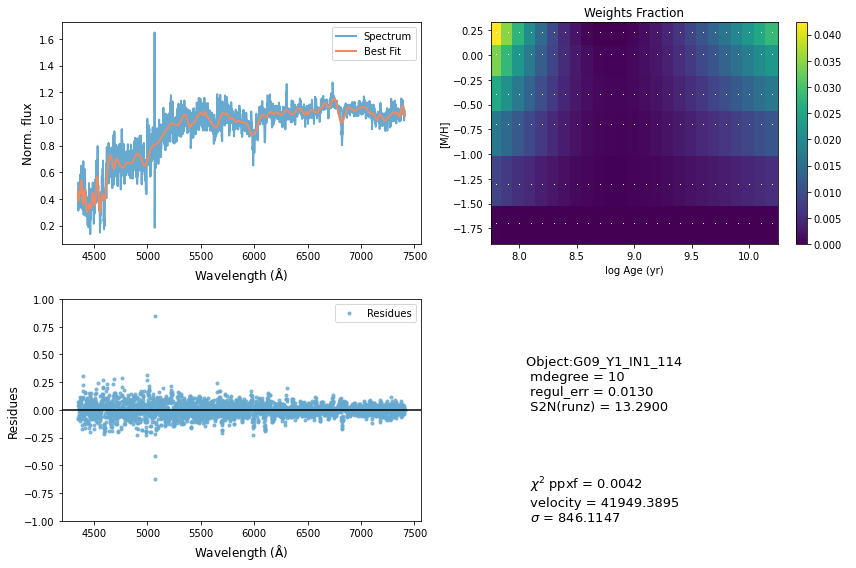

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50644      1000     0.097     0.030
 comp.  1:     52255        90
 comp.  2:     52410       224
Gas Reddening E(B-V): 4.962
chi2/DOF: 0.004419
method = capfit; Jac calls: 7; Func calls: 153; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1675       1.5   52255    90
Comp:  2       Unknown          0       8.3   52410   224
Comp:  2       Unknown      3.408       8.5   52410   224
Comp:  2       Unknown     0.1571       4.8   52410   224
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -1.08
M/L_r: 1.332
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 2.09 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


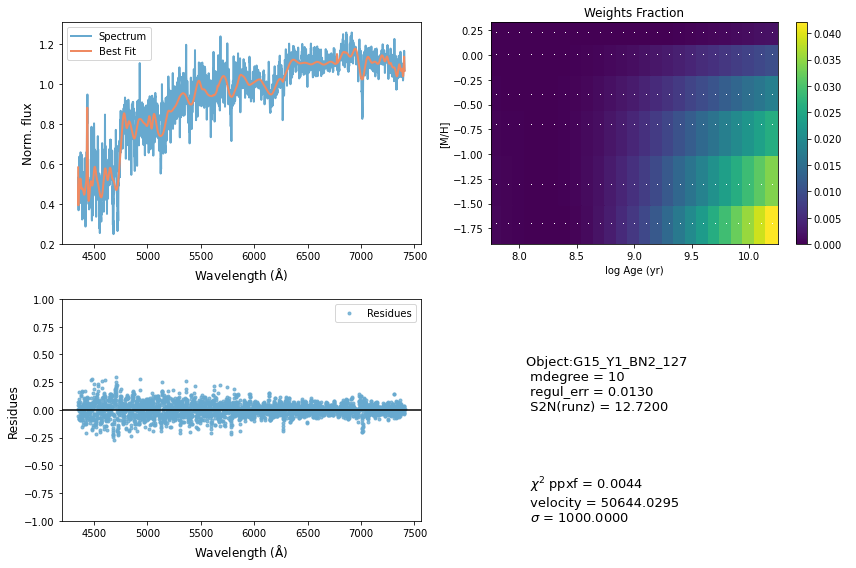

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36021       637    -0.039     0.000
 comp.  1:     35484       180
 comp.  2:     35407        77
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.01311
method = capfit; Jac calls: 13; Func calls: 267; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.1   35484   180
Comp:  2       Unknown      0.449       2.5   35407    77
Comp:  2       Unknown     0.2795         2   35407    77
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.83
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.83
M/L_r: 1.753
Current $\chi^2$: 0.0131
Elapsed time in PPXF: 3.92 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


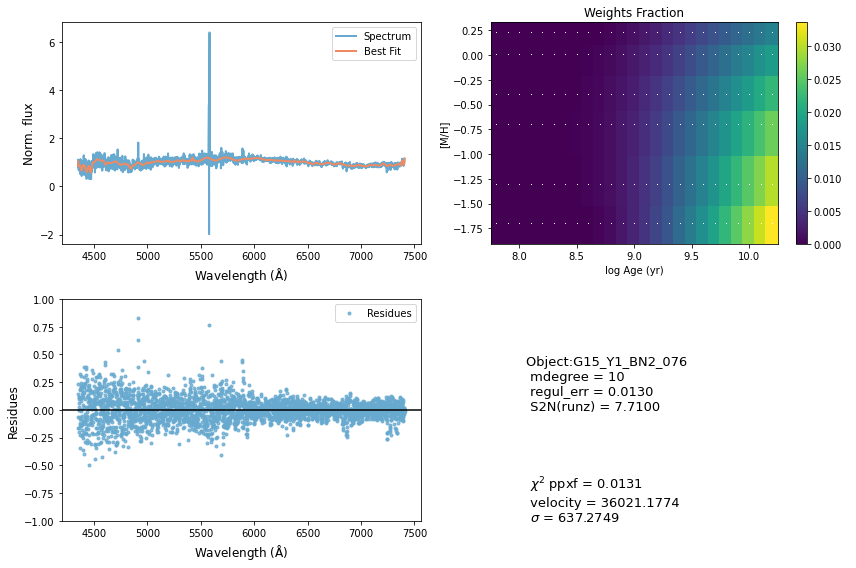

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45427       155    -0.003    -0.001
 comp.  1:     47031        45
 comp.  2:     46856       237
Gas Reddening E(B-V): 5.445
chi2/DOF: 0.007307
method = capfit; Jac calls: 13; Func calls: 272; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2045       1.3   47031    45
Comp:  2       Unknown      6.979       7.6   46856   237
Comp:  2       Unknown          0       8.6   46856   237
Comp:  2       Unknown     0.8327       7.7   46856   237
Comp:  2       Unknown          0       3.4   46856   237
---------------------------------------------------------
Weighted <logAge> [yr]: 9.23
Weighted <[M/H]>: -0.463
Weighted <logAge> [yr]: 9.23
Weighted <[M/H]>: -0.463
M/L_r: 0.4127
Current $\chi^2$: 0.0073
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


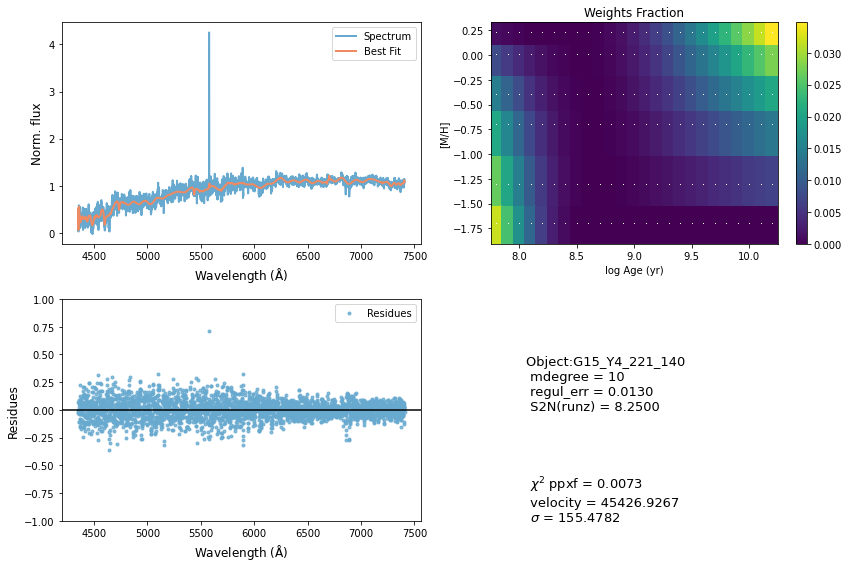

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24175       231     0.051     0.048
 comp.  1:     24166       169
 comp.  2:     24105       138
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005685
method = capfit; Jac calls: 9; Func calls: 188; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  35 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.34       3.7   24166   169
Comp:  2       Unknown          0       1.7   24105   138
Comp:  2       Unknown     0.0734       1.7   24105   138
Comp:  2       Unknown          0         4   24105   138
Comp:  2       Unknown      1.002       2.6   24105   138
Comp:  2       Unknown          0       2.2   24105   138
---------------------------------------------------------
Weighted <logAge> [yr]: 8.06
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.06
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


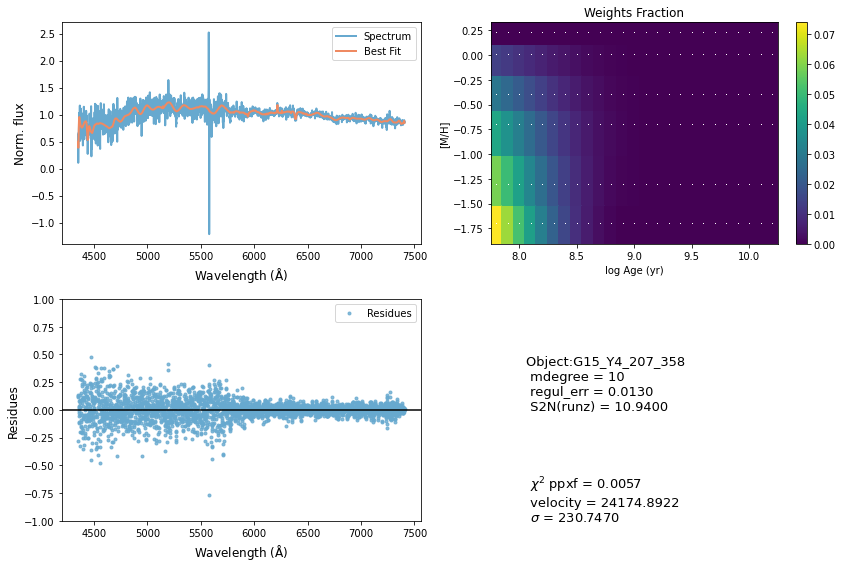

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47978      1000     0.093    -0.004
 comp.  1:     45926        93
 comp.  2:     45989       106
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005433
method = capfit; Jac calls: 6; Func calls: 128; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  89 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5101       3.1   45926    93
Comp:  2       Unknown     0.3878       3.4   45989   106
Comp:  2       Unknown          0       2.1   45989   106
---------------------------------------------------------
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -1.03
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -1.03
M/L_r: 0.5246
Current $\chi^2$: 0.0054
Elapsed time in PPXF: 1.78 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


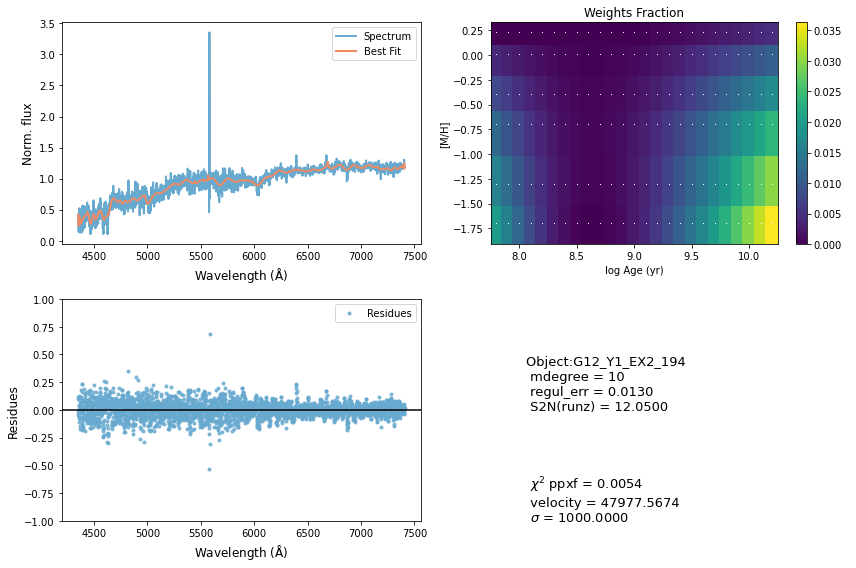

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52329       967    -0.055    -0.073
 comp.  1:     54366        45
 comp.  2:     54822       200
Gas Reddening E(B-V): 0.053
chi2/DOF: 0.006616
method = capfit; Jac calls: 12; Func calls: 255; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  47 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3007       2.2   54366    45
Comp:  2       Unknown          0       7.5   54822   200
Comp:  2       Unknown      4.477       7.7   54822   200
Comp:  2       Unknown      1.252       5.3   54822   200
---------------------------------------------------------
Weighted <logAge> [yr]: 9.41
Weighted <[M/H]>: -0.309
Weighted <logAge> [yr]: 9.41
Weighted <[M/H]>: -0.309
M/L_r: 0.6552
Current $\chi^2$: 0.0066
Elapsed time in PPXF: 3.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


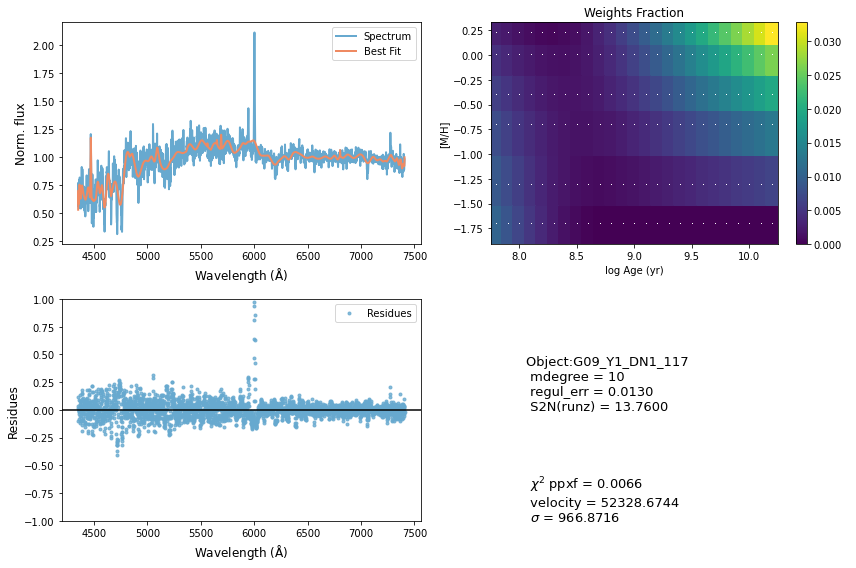

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40830        18     0.006     0.014
 comp.  1:     40818       125
 comp.  2:     40862       208
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007387
method = capfit; Jac calls: 7; Func calls: 146; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  55 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5408         3   40818   125
Comp:  2       Unknown     0.9569       4.6   40862   208
Comp:  2       Unknown    0.06104       2.6   40862   208
---------------------------------------------------------
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.193
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.193
M/L_r: 2.41
Current $\chi^2$: 0.0074
Elapsed time in PPXF: 1.92 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


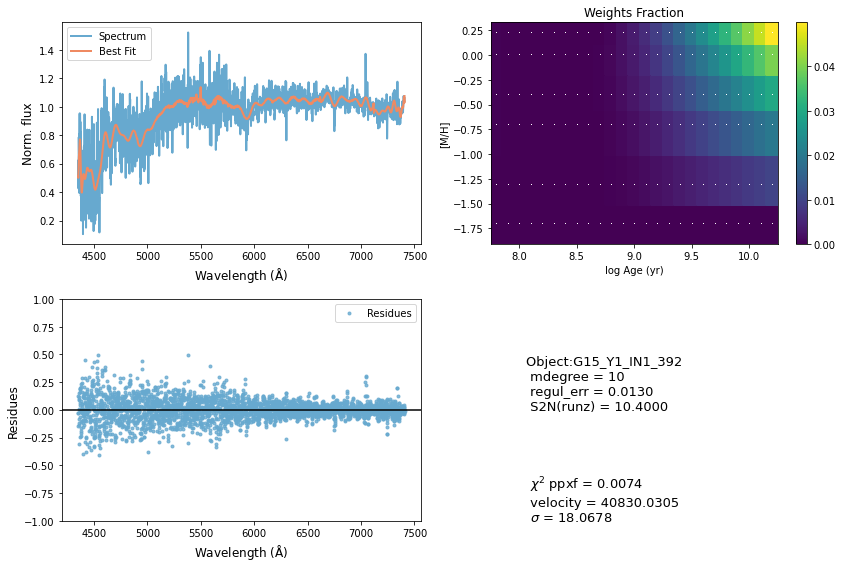

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54008       293     0.024     0.012
 comp.  1:     54128       743
 comp.  2:     54410       240
Gas Reddening E(B-V): 7.147
chi2/DOF: 0.002976
method = capfit; Jac calls: 8; Func calls: 168; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        1.1       4.3   54128   743
Comp:  2       Unknown          0       1.2   54410   240
Comp:  2       Unknown     0.9137       5.3   54410   240
Comp:  2       Unknown     0.9194       5.6   54410   240
---------------------------------------------------------
Weighted <logAge> [yr]: 8.24
Weighted <[M/H]>: -1.32
Weighted <logAge> [yr]: 8.24
Weighted <[M/H]>: -1.32
M/L_r: 0.177
Current $\chi^2$: 0.0030
Elapsed time in PPXF: 1.62 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


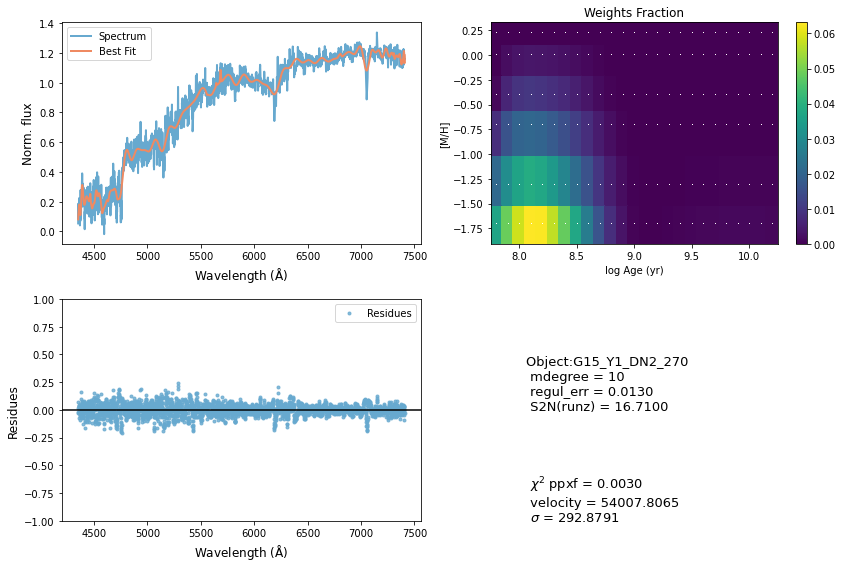

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53718       848     0.001     0.011
 comp.  1:     54497      1000
 comp.  2:     54766       216
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.00437
method = capfit; Jac calls: 15; Func calls: 312; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.762       4.7   54497  1000
Comp:  2       Unknown      0.713   4.1e+02   54766   216
Comp:  2       Unknown          0   4.1e+02   54766   216
Comp:  2       Unknown     0.5211       5.4   54766   216
---------------------------------------------------------
Weighted <logAge> [yr]: 9.49
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 9.49
Weighted <[M/H]>: -1.12
M/L_r: 0.7343
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 4.61 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


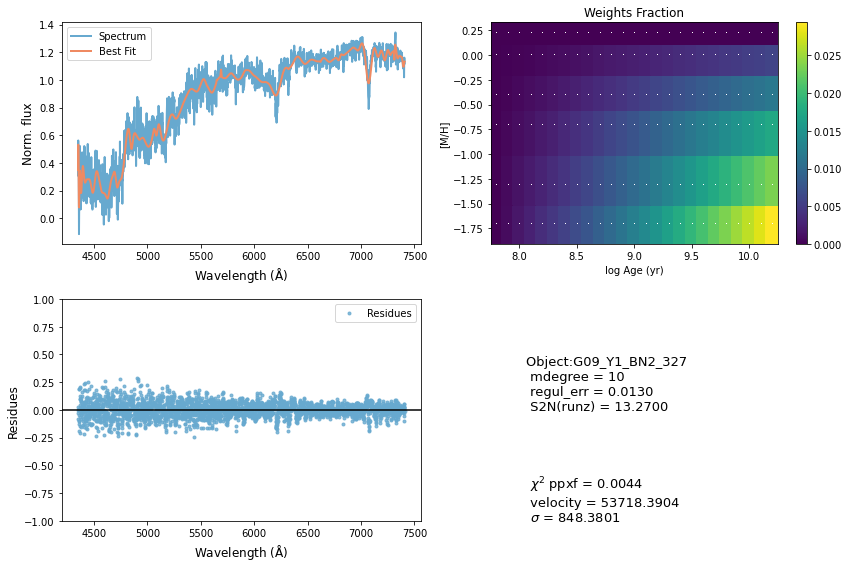

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52585       909    -0.022    -0.038
 comp.  1:     52132        94
 comp.  2:     52371       123
Gas Reddening E(B-V): 4.877
chi2/DOF: 0.009677
method = capfit; Jac calls: 12; Func calls: 248; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6755       1.3   52132    94
Comp:  2       Unknown          0       7.1   52371   123
Comp:  2       Unknown      5.092       7.4   52371   123
Comp:  2       Unknown          0       3.9   52371   123
---------------------------------------------------------
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.255
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.255
M/L_r: 0.2063
Current $\chi^2$: 0.0097
Elapsed time in PPXF: 3.15 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


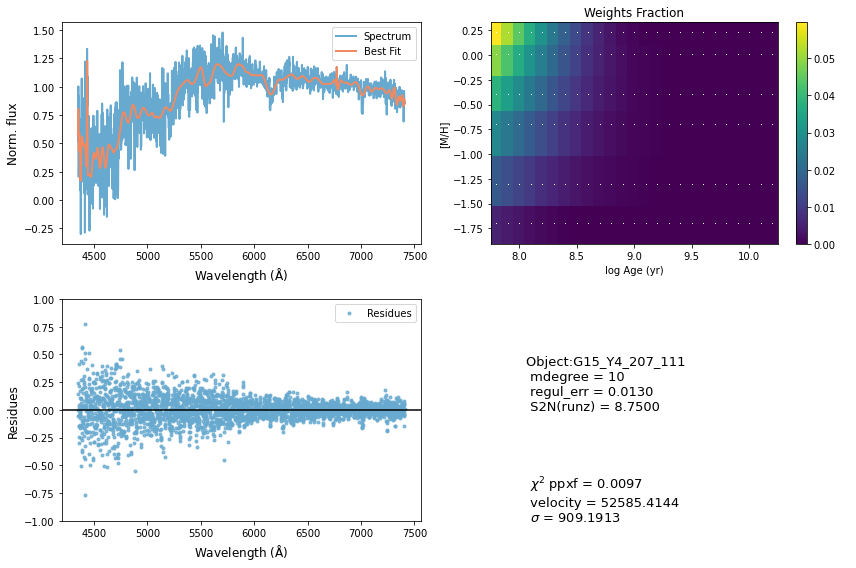

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     27035       580     0.003    -0.056
 comp.  1:     26654       375
 comp.  2:     26324       175
Gas Reddening E(B-V): 1.489
chi2/DOF: 0.002771
method = capfit; Jac calls: 14; Func calls: 294; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.931       4.1   26654   375
Comp:  2       Unknown     0.4627       2.2   26324   175
Comp:  2       Unknown          0       2.2   26324   175
Comp:  2       Unknown     0.3954         4   26324   175
Comp:  2       Unknown    0.06591         3   26324   175
Comp:  2       Unknown          0       2.8   26324   175
---------------------------------------------------------
Weighted <logAge> [yr]: 8.2
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.2
Weighted <[M/

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


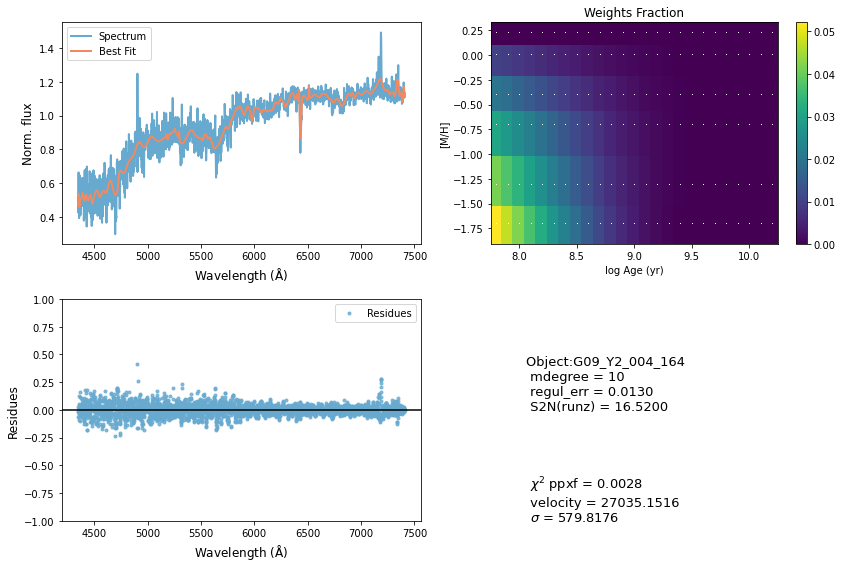

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62967       796    -0.300    -0.123
 comp.  1:     60967       180
 comp.  2:     60967       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01423
method = capfit; Jac calls: 14; Func calls: 293; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   60967   180
Comp:  2       Unknown          0       6.4   60967   180
Comp:  2       Unknown          0       6.4   60967   180
Comp:  2       Unknown          0       3.6   60967   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.391
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.391
M/L_r: 2.419
Current $\chi^2$: 0.0142
Elapsed time in PPXF: 4.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


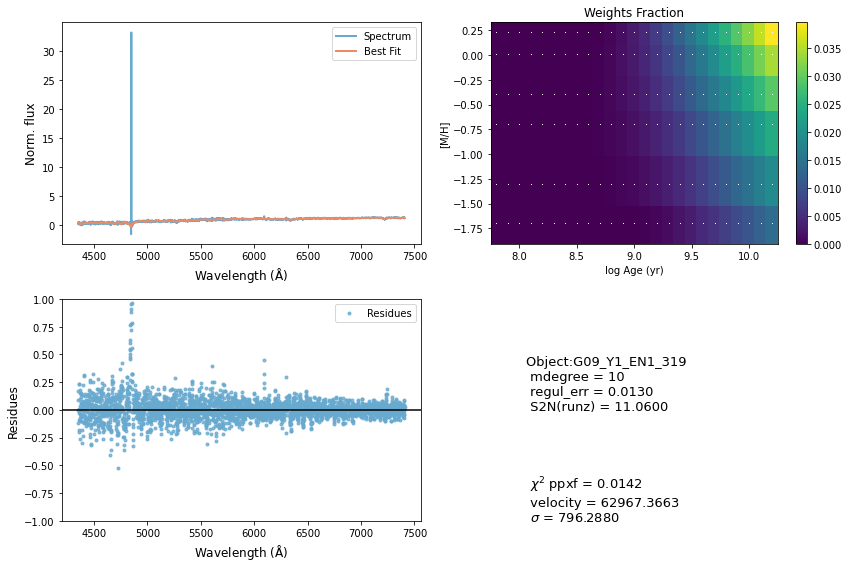

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45582       376     0.037     0.023
 comp.  1:     45825       424
 comp.  2:     43894       292
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.001761
method = capfit; Jac calls: 17; Func calls: 354; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  71 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.906       7.8   45825   424
Comp:  2       Unknown      1.188       5.2   43894   292
Comp:  2       Unknown          0       4.4   43894   292
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.596
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.596
M/L_r: 2.166
Current $\chi^2$: 0.0018
Elapsed time in PPXF: 4.63 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


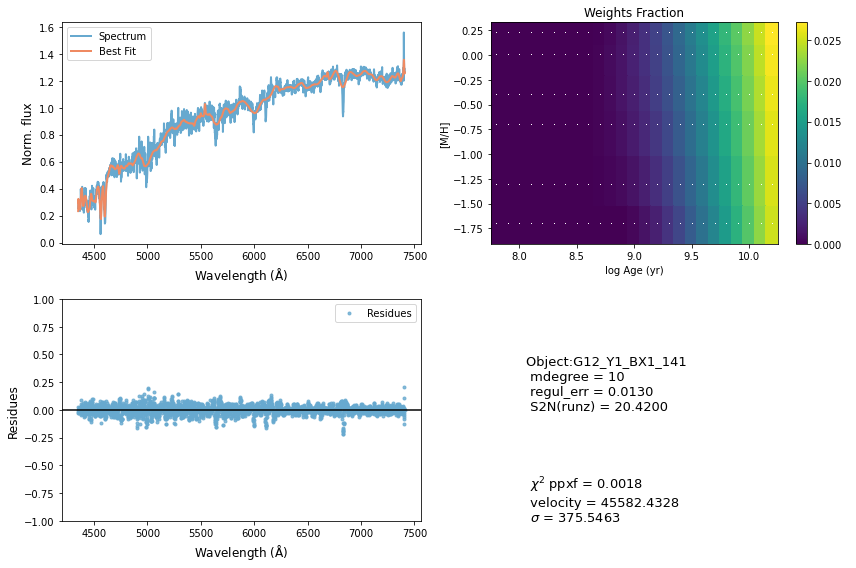

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62506       193     0.300    -0.300
 comp.  1:     62598       270
 comp.  2:     62750      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 5.635
method = capfit; Jac calls: 16; Func calls: 331; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      38.83       6.9   62598   270
Comp:  2       Unknown      49.82        45   62750  1000
Comp:  2       Unknown      26.87        45   62750  1000
Comp:  2       Unknown          0        10   62750  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.194
M/L_r: 2.501
Current $\chi^2$: 5.6348
Elapsed time in PPXF: 3.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


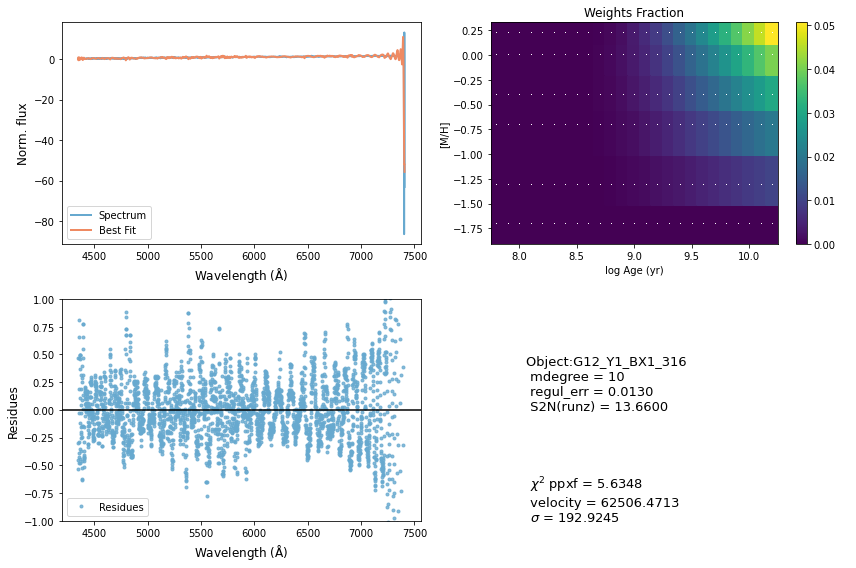

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40956       340     0.001    -0.001
 comp.  1:     40945        93
 comp.  2:     40892       261
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004266
method = capfit; Jac calls: 8; Func calls: 167; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  51 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5305       2.9   40945    93
Comp:  2       Unknown       1.28       4.8   40892   261
Comp:  2       Unknown          0       3.3   40892   261
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.215
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.215
M/L_r: 2.789
Current $\chi^2$: 0.0043
Elapsed time in PPXF: 2.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


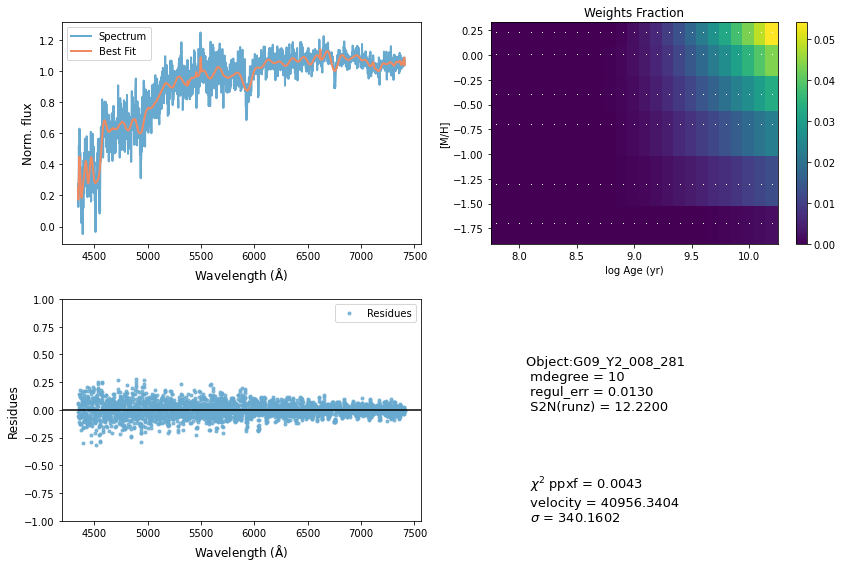

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     26966      1000     0.131    -0.025
 comp.  1:     26994      1000
 comp.  2:     28804       826
Gas Reddening E(B-V): 5.710
chi2/DOF: 0.00482
method = capfit; Jac calls: 10; Func calls: 206; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.354       5.5   26994  1000
Comp:  2       Unknown          0       9.2   28804   826
Comp:  2       Unknown          0       9.2   28804   826
Comp:  2       Unknown      2.108       8.1   28804   826
Comp:  2       Unknown          0       6.1   28804   826
Comp:  2       Unknown      17.29       5.6   28804   826
---------------------------------------------------------
Weighted <logAge> [yr]: 8.04
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.04
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


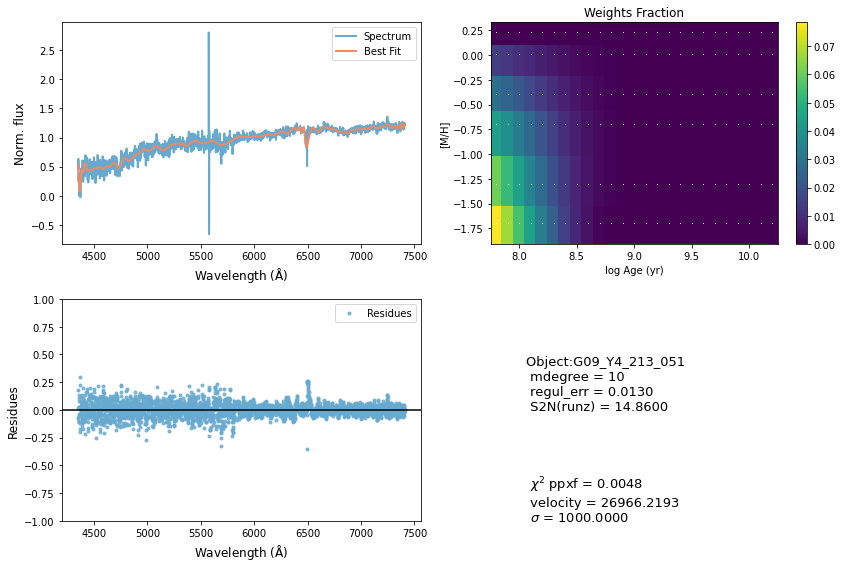

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54521       111    -0.003     0.012
 comp.  1:     55217       476
 comp.  2:     55056       270
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006044
method = capfit; Jac calls: 8; Func calls: 169; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  46 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.919       6.5   55217   476
Comp:  2       Unknown          0       9.4   55056   270
Comp:  2       Unknown          0       9.4   55056   270
Comp:  2       Unknown       1.53         7   55056   270
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.12
M/L_r: 1.127
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 2.43 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


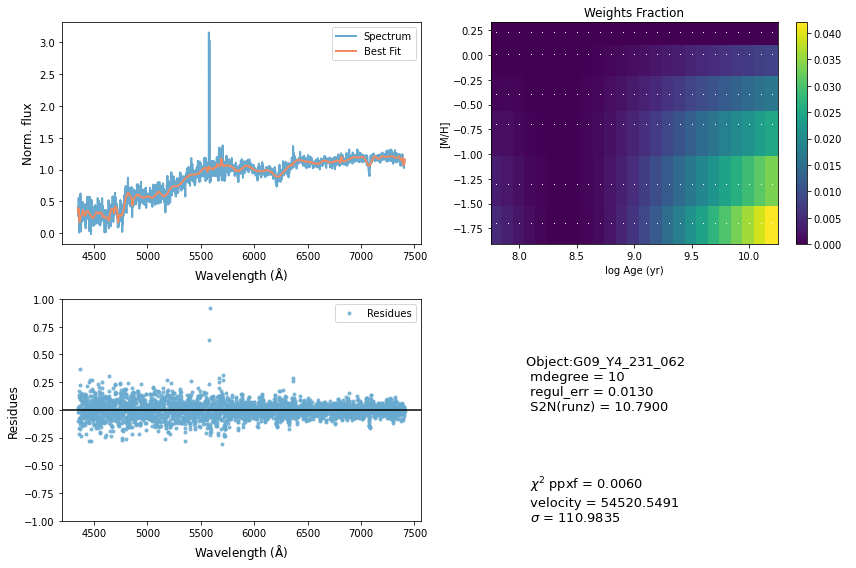

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33492       121     0.074    -0.033
 comp.  1:     33447       211
 comp.  2:     33356       231
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.002263
method = capfit; Jac calls: 8; Func calls: 173; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  35 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.289       4.7   33447   211
Comp:  2       Unknown     0.2025       4.4   33356   231
Comp:  2       Unknown     0.5055       3.6   33356   231
Comp:  2       Unknown     0.3744       3.4   33356   231
---------------------------------------------------------
Weighted <logAge> [yr]: 9.04
Weighted <[M/H]>: -0.418
Weighted <logAge> [yr]: 9.04
Weighted <[M/H]>: -0.418
M/L_r: 0.5448
Current $\chi^2$: 0.0023
Elapsed time in PPXF: 2.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


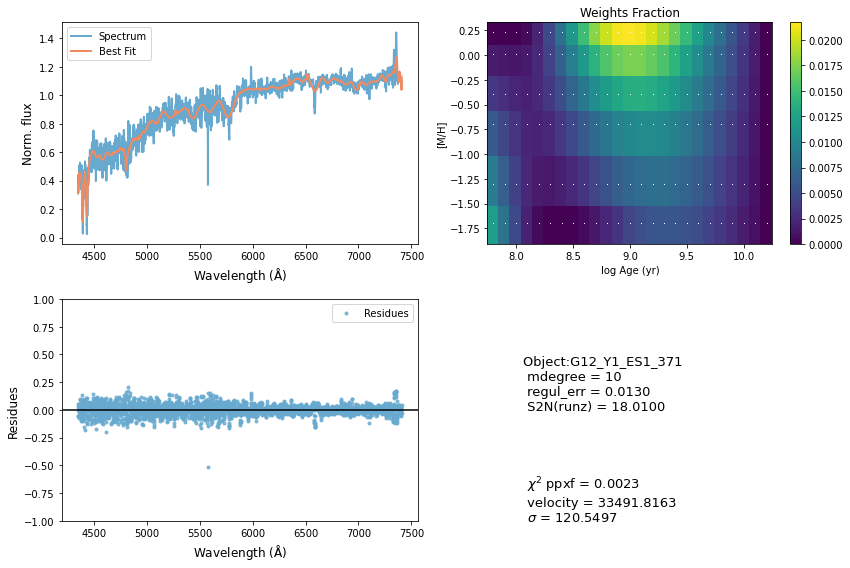

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59983       367    -0.085     0.022
 comp.  1:     59840       172
 comp.  2:     59914       214
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007126
method = capfit; Jac calls: 6; Func calls: 127; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  79 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.063         4   59840   172
Comp:  2       Unknown     0.8081       7.7   59914   214
Comp:  2       Unknown          0       7.5   59914   214
Comp:  2       Unknown       1.23       4.5   59914   214
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.328
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.328
M/L_r: 1.438
Current $\chi^2$: 0.0071
Elapsed time in PPXF: 1.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


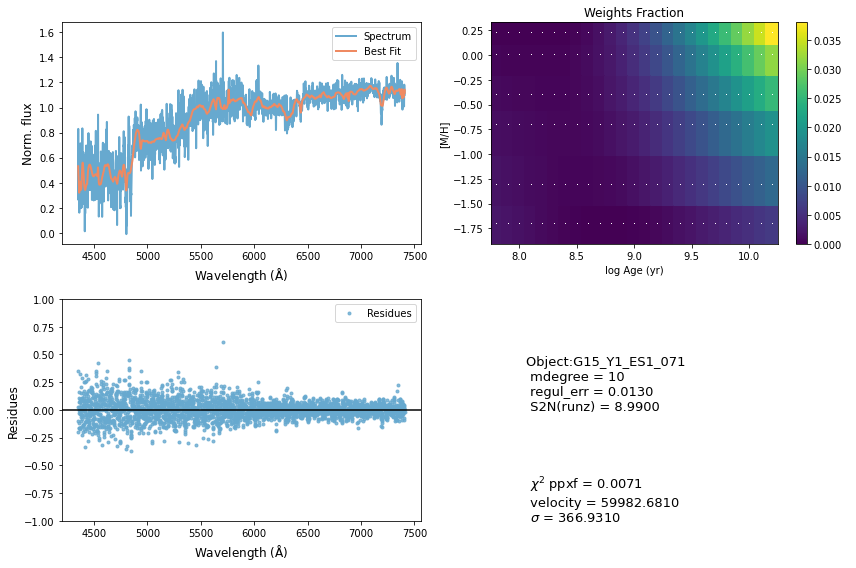

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30635       183    -0.008    -0.020
 comp.  1:     30575        29
 comp.  2:     30626      1000
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.005512
method = capfit; Jac calls: 6; Func calls: 138; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.1   30575    29
Comp:  2       Unknown      7.731       8.2   30626  1000
Comp:  2       Unknown          0       7.1   30626  1000
Comp:  2       Unknown      3.722       5.4   30626  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.51
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.51
M/L_r: 2.338
Current $\chi^2$: 0.0055
Elapsed time in PPXF: 1.78 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


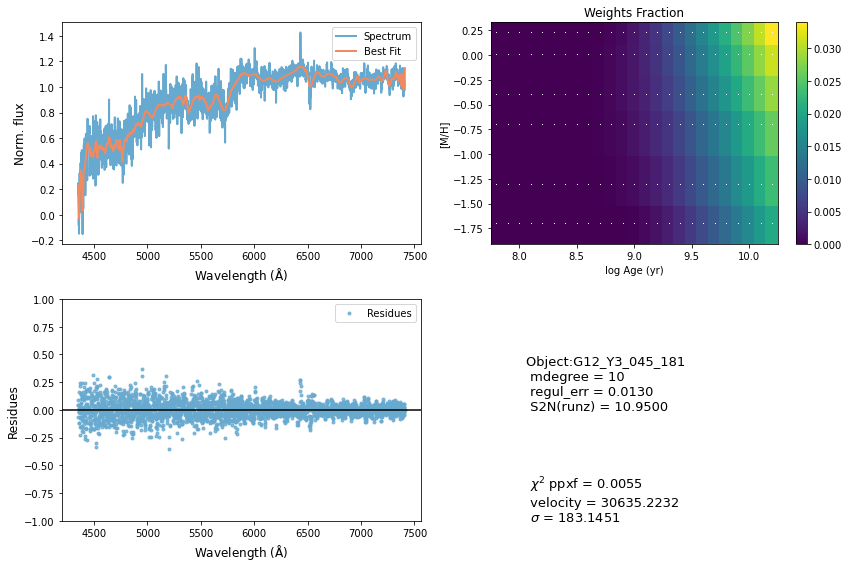

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67407      1000    -0.018     0.118
 comp.  1:     66327        70
 comp.  2:     66334       314
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02541
method = capfit; Jac calls: 15; Func calls: 315; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  90 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.042       3.4   66327    70
Comp:  2       Unknown     0.7541        11   66334   314
Comp:  2       Unknown          0        11   66334   314
Comp:  2       Unknown      0.679       6.8   66334   314
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.76
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.76
M/L_r: 1.674
Current $\chi^2$: 0.0254
Elapsed time in PPXF: 5.15 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


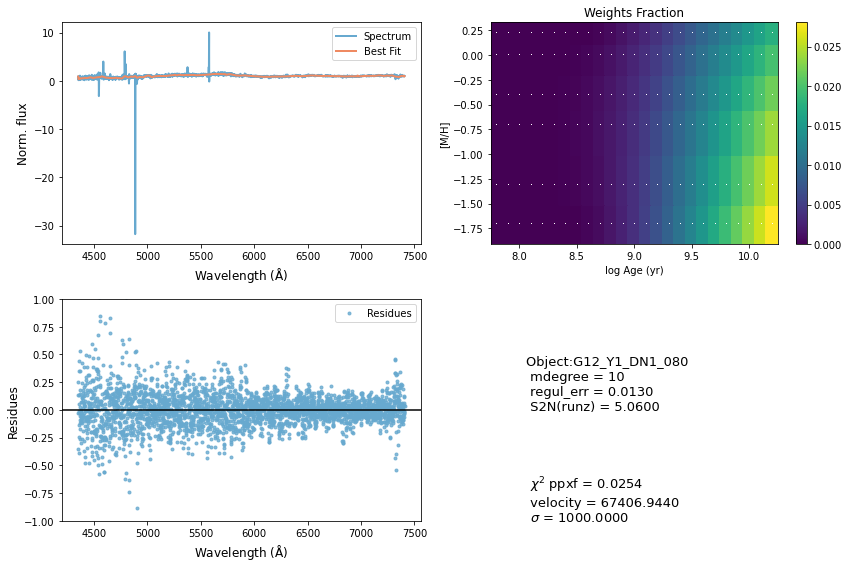

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47879      1000    -0.123    -0.077
 comp.  1:     48369       505
 comp.  2:     48224       249
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004515
method = capfit; Jac calls: 11; Func calls: 229; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.386       6.4   48369   505
Comp:  2       Unknown          0       9.2   48224   249
Comp:  2       Unknown      6.245       9.4   48224   249
Comp:  2       Unknown          0       5.3   48224   249
Comp:  2       Unknown     0.3063       3.3   48224   249
---------------------------------------------------------
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.447
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.447
M/L_r: 1.88
Current $\chi^2$: 0.0045
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


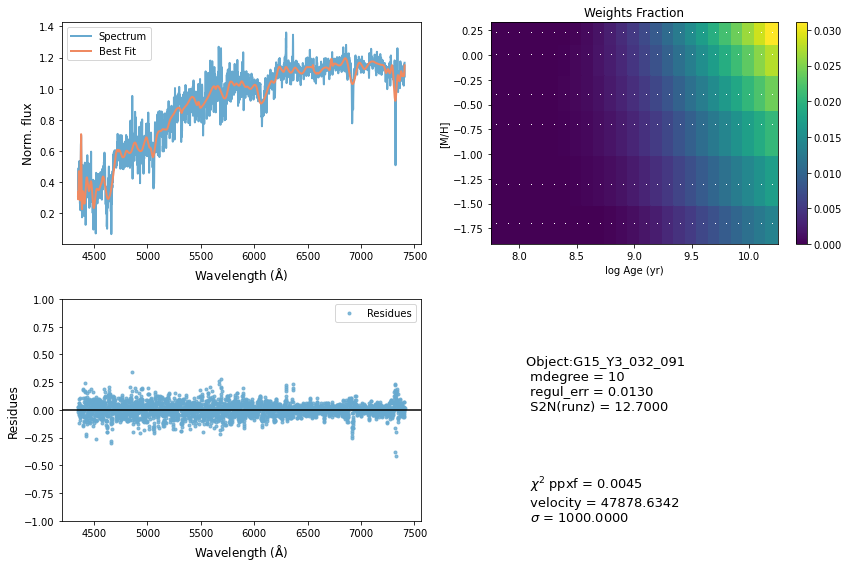

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72540      1000    -0.027    -0.015
 comp.  1:     74419         1
 comp.  2:     74640        80
Gas Reddening E(B-V): 2.749
chi2/DOF: 0.01744
method = capfit; Jac calls: 10; Func calls: 206; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6806       1.2   74419     1
Comp:  2       Unknown          0       2.9   74640    80
Comp:  2       Unknown      1.099         3   74640    80
Comp:  2       Unknown          0       2.5   74640    80
---------------------------------------------------------
Weighted <logAge> [yr]: 8.07
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.07
Weighted <[M/H]>: -1.1
M/L_r: 0.171
Current $\chi^2$: 0.0174
Elapsed time in PPXF: 2.62 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


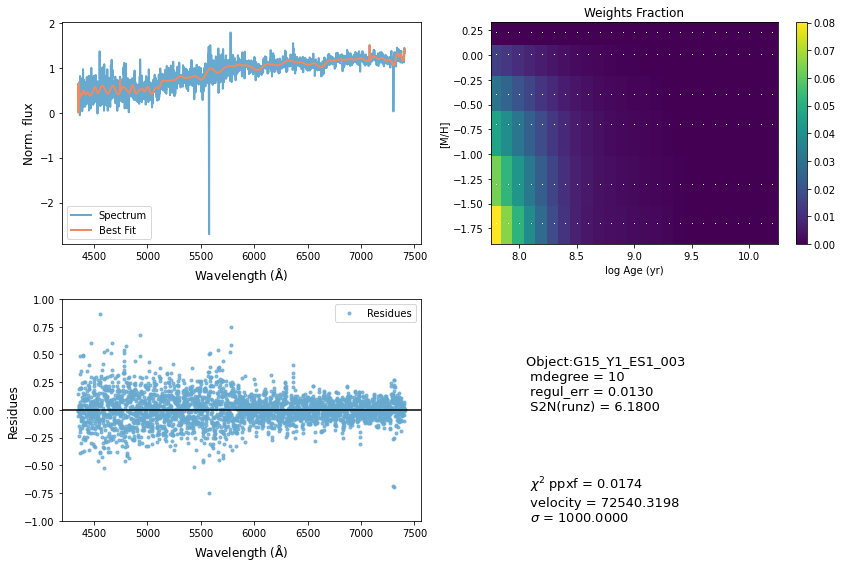

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35072        83    -0.018     0.013
 comp.  1:     34997       127
 comp.  2:     34586       143
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004701
method = capfit; Jac calls: 7; Func calls: 150; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  14 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       0.71       3.3   34997   127
Comp:  2       Unknown    0.06399       3.8   34586   143
Comp:  2       Unknown          0         3   34586   143
Comp:  2       Unknown       0.54       2.3   34586   143
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.13
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.13
M/L_r: 0.1583
Current $\chi^2$: 0.0047
Elapsed time in PPXF: 1.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


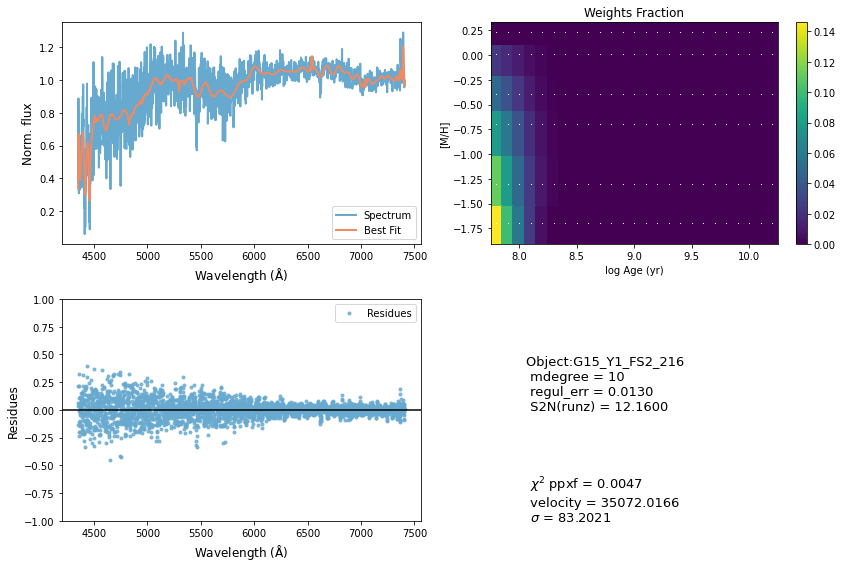

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62865       917    -0.032    -0.020
 comp.  1:     64820       180
 comp.  2:     64472       226
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.006005
method = capfit; Jac calls: 5; Func calls: 102; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   64820   180
Comp:  2       Unknown          0         9   64472   226
Comp:  2       Unknown          0       8.9   64472   226
Comp:  2       Unknown      3.468       5.2   64472   226
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.187
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.187
M/L_r: 2.812
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 0.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


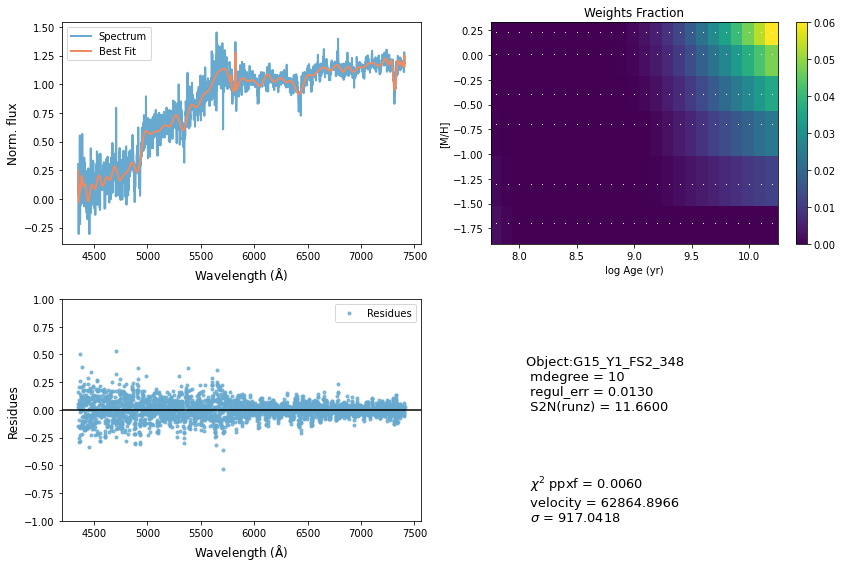

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29677        78    -0.001    -0.001
 comp.  1:     29910        30
 comp.  2:     30041       205
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00684
method = capfit; Jac calls: 11; Func calls: 225; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5661         2   29910    30
Comp:  2       Unknown          0       4.4   30041   205
Comp:  2       Unknown     0.7746       3.9   30041   205
Comp:  2       Unknown          0       2.3   30041   205
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.195
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.195
M/L_r: 2.797
Current $\chi^2$: 0.0068
Elapsed time in PPXF: 2.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


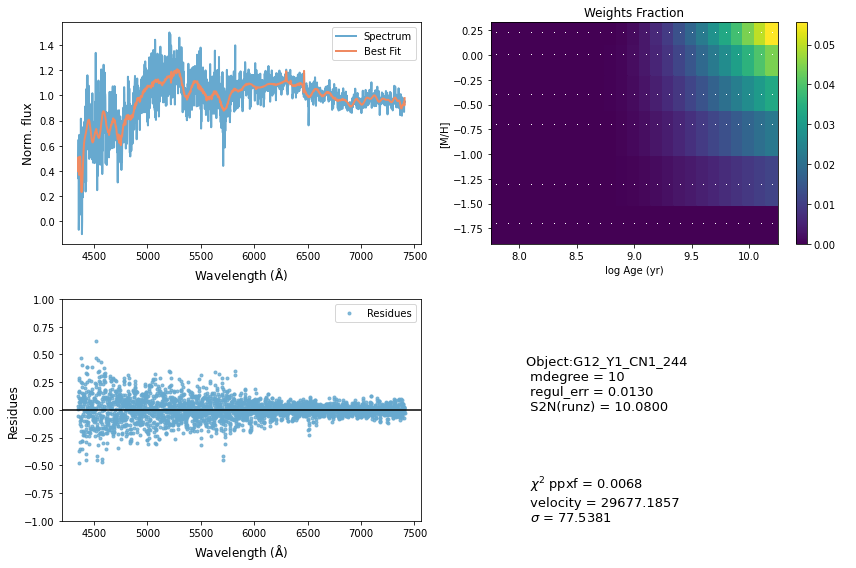

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72752         8    -0.012    -0.009
 comp.  1:     72603       119
 comp.  2:     72518       235
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009217
method = capfit; Jac calls: 6; Func calls: 126; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.212       3.8   72603   119
Comp:  2       Unknown       0.97       6.9   72518   235
Comp:  2       Unknown    0.06127       6.9   72518   235
Comp:  2       Unknown      0.205       4.7   72518   235
---------------------------------------------------------
Weighted <logAge> [yr]: 8.38
Weighted <[M/H]>: -0.514
Weighted <logAge> [yr]: 8.38
Weighted <[M/H]>: -0.514
M/L_r: 0.2524
Current $\chi^2$: 0.0092
Elapsed time in PPXF: 1.37 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


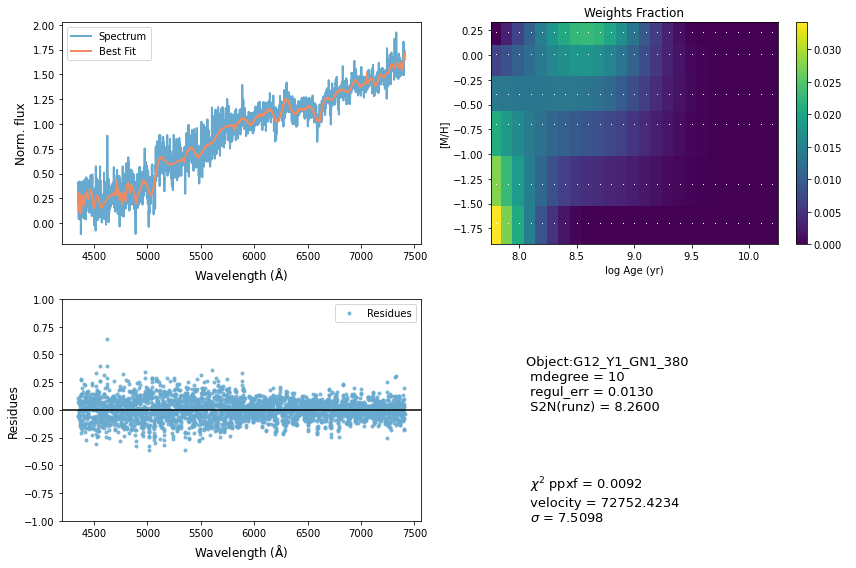

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39111        67     0.011    -0.033
 comp.  1:     40217       601
 comp.  2:     41052       171
Gas Reddening E(B-V): 9.461
chi2/DOF: 0.008462
method = capfit; Jac calls: 9; Func calls: 190; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.267       3.5   40217   601
Comp:  2       Unknown      1.016       3.9   41052   171
Comp:  2       Unknown     0.8047       2.6   41052   171
---------------------------------------------------------
Weighted <logAge> [yr]: 8.34
Weighted <[M/H]>: -0.15
Weighted <logAge> [yr]: 8.34
Weighted <[M/H]>: -0.15
M/L_r: 0.2845
Current $\chi^2$: 0.0085
Elapsed time in PPXF: 2.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


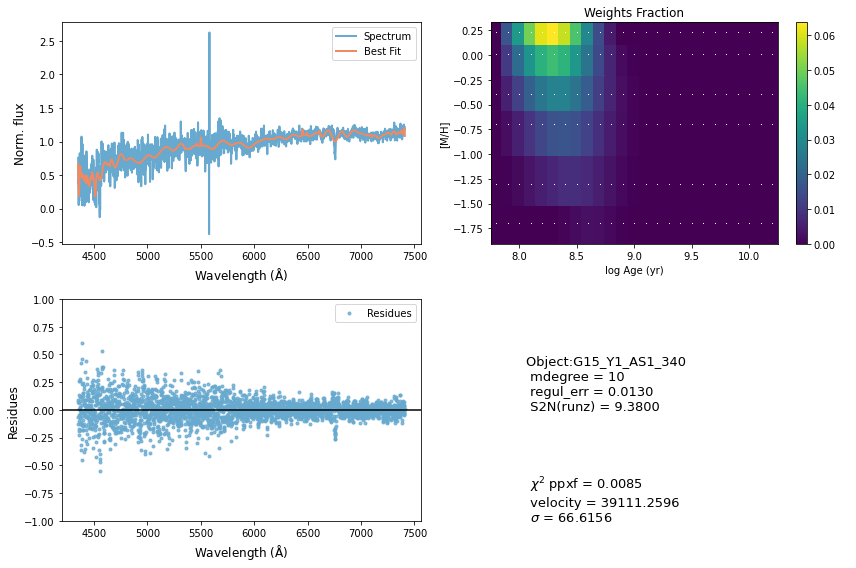

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     66751       737    -0.034    -0.012
 comp.  1:     65657       180
 comp.  2:     65782       495
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006512
method = capfit; Jac calls: 8; Func calls: 176; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  18 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.8   65657   180
Comp:  2       Unknown          0        18   65782   495
Comp:  2       Unknown          0        18   65782   495
Comp:  2       Unknown      3.518       7.1   65782   495
---------------------------------------------------------
Weighted <logAge> [yr]: 8.02
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 8.02
Weighted <[M/H]>: -1.09
M/L_r: 0.1647
Current $\chi^2$: 0.0065
Elapsed time in PPXF: 2.51 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


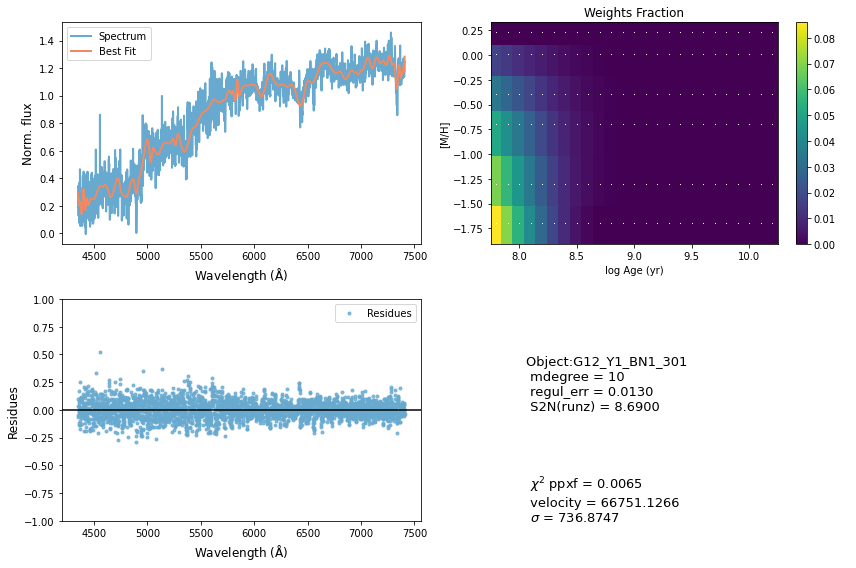

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46986      1000     0.001    -0.025
 comp.  1:     45253        52
 comp.  2:     44986       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01674
method = capfit; Jac calls: 10; Func calls: 207; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  51 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.168       2.7   45253    52
Comp:  2       Unknown          0       4.3   44986   180
Comp:  2       Unknown          0       3.1   44986   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.03
Weighted <[M/H]>: -0.79
Weighted <logAge> [yr]: 8.03
Weighted <[M/H]>: -0.79
M/L_r: 0.1776
Current $\chi^2$: 0.0167
Elapsed time in PPXF: 3.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


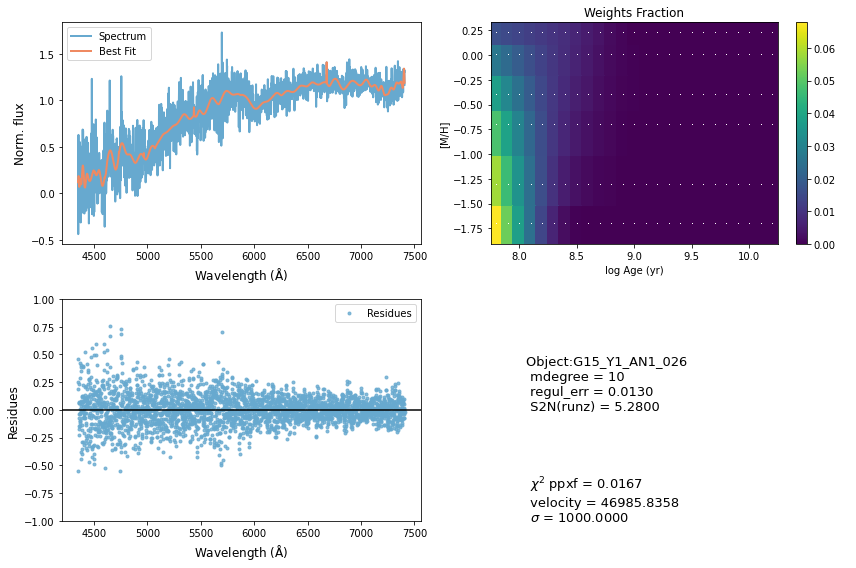

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48627       347    -0.002     0.131
 comp.  1:     46697       138
 comp.  2:     45107       949
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.002173
method = capfit; Jac calls: 13; Func calls: 268; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5209       3.8   46697   138
Comp:  2       Unknown  1.695e+04        86   45107   949
Comp:  2       Unknown          0        91   45107   949
Comp:  2       Unknown      2.731       9.3   45107   949
Comp:  2       Unknown      1.939       6.4   45107   949
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.292
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.292
M/L_r: 2.796
Current $\chi^2$: 0.0022
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


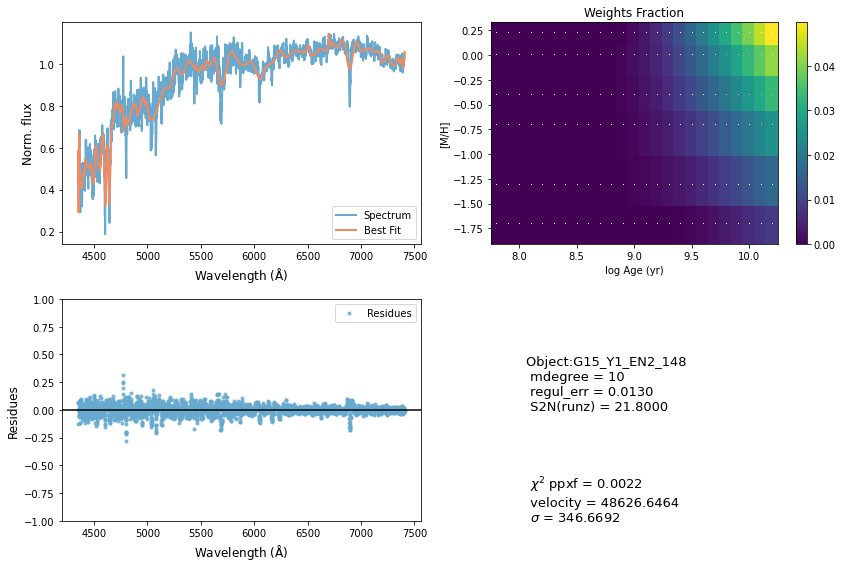

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36632       570     0.005    -0.064
 comp.  1:     36385       409
 comp.  2:     36179       162
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.004368
method = capfit; Jac calls: 8; Func calls: 169; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        4.2       2.8   36385   409
Comp:  2       Unknown     0.8414       3.7   36179   162
Comp:  2       Unknown          0       2.7   36179   162
---------------------------------------------------------
Weighted <logAge> [yr]: 8.07
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 8.07
Weighted <[M/H]>: -1.09
M/L_r: 0.1697
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 2.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


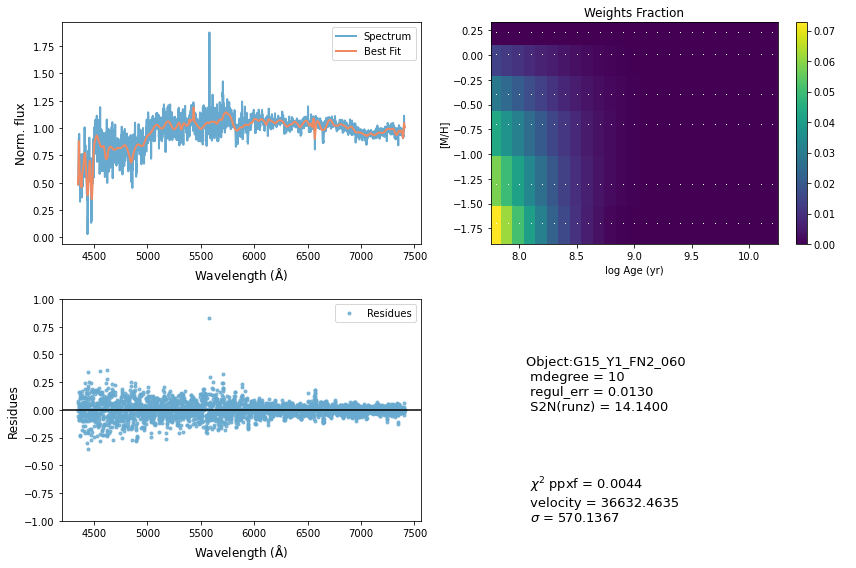

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36807       120    -0.001    -0.093
 comp.  1:     36838       159
 comp.  2:     37032       129
Gas Reddening E(B-V): 8.758
chi2/DOF: 0.004866
method = capfit; Jac calls: 8; Func calls: 172; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4398         2   36838   159
Comp:  2       Unknown     0.7039       3.4   37032   129
Comp:  2       Unknown          0       2.3   37032   129
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.203
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.203
M/L_r: 2.602
Current $\chi^2$: 0.0049
Elapsed time in PPXF: 2.01 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


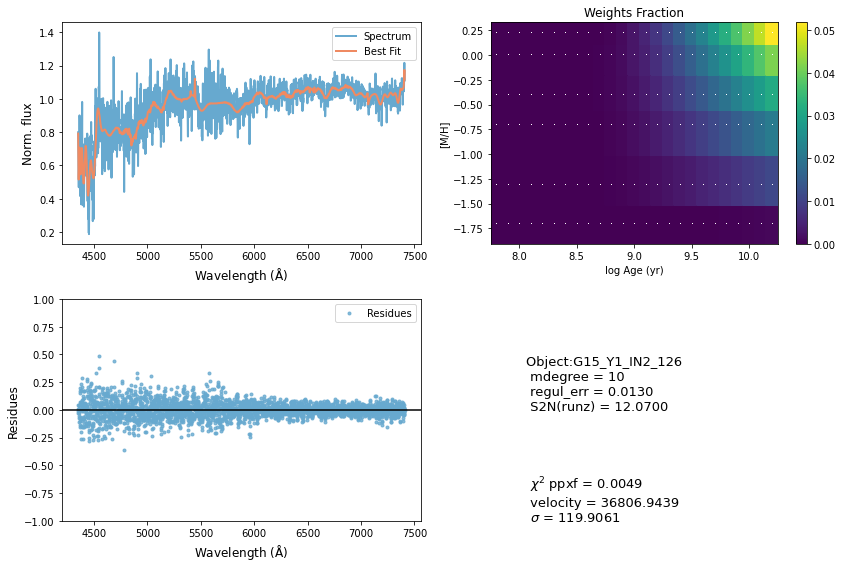

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44223       936     0.005    -0.042
 comp.  1:     42825       364
 comp.  2:     42791       250
Gas Reddening E(B-V): 2.697
chi2/DOF: 0.0143
method = capfit; Jac calls: 10; Func calls: 207; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2931       2.8   42825   364
Comp:  2       Unknown      1.744       4.8   42791   250
Comp:  2       Unknown     0.3532       3.1   42791   250
---------------------------------------------------------
Weighted <logAge> [yr]: 9.44
Weighted <[M/H]>: -0.358
Weighted <logAge> [yr]: 9.44
Weighted <[M/H]>: -0.358
M/L_r: 0.6214
Current $\chi^2$: 0.0143
Elapsed time in PPXF: 2.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


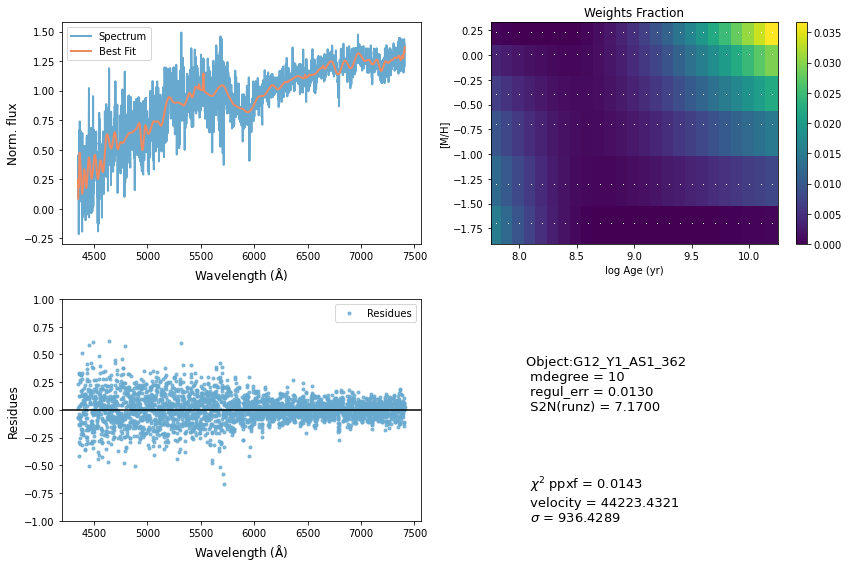

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38439       120     0.000     0.003
 comp.  1:     38473       180
 comp.  2:     38622        51
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.02459
method = capfit; Jac calls: 9; Func calls: 187; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.7   38473   180
Comp:  2       Unknown          0       1.6   38622    51
Comp:  2       Unknown     0.4964       1.6   38622    51
---------------------------------------------------------
Weighted <logAge> [yr]: 9.03
Weighted <[M/H]>: -0.173
Weighted <logAge> [yr]: 9.03
Weighted <[M/H]>: -0.173
M/L_r: 0.6323
Current $\chi^2$: 0.0246
Elapsed time in PPXF: 2.43 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


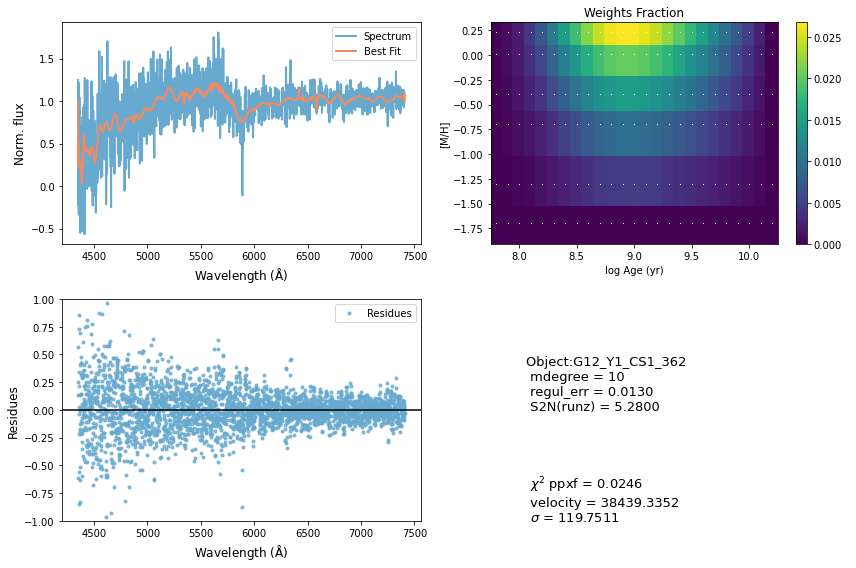

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33857        52    -0.022    -0.005
 comp.  1:     33833       180
 comp.  2:     34035       185
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007481
method = capfit; Jac calls: 6; Func calls: 129; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  12 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3677       3.9   33833   180
Comp:  2       Unknown     0.2183         4   34035   185
Comp:  2       Unknown     0.5708       2.9   34035   185
Comp:  2       Unknown      0.165       2.7   34035   185
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.18
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.18
M/L_r: 0.1578
Current $\chi^2$: 0.0075
Elapsed time in PPXF: 0.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


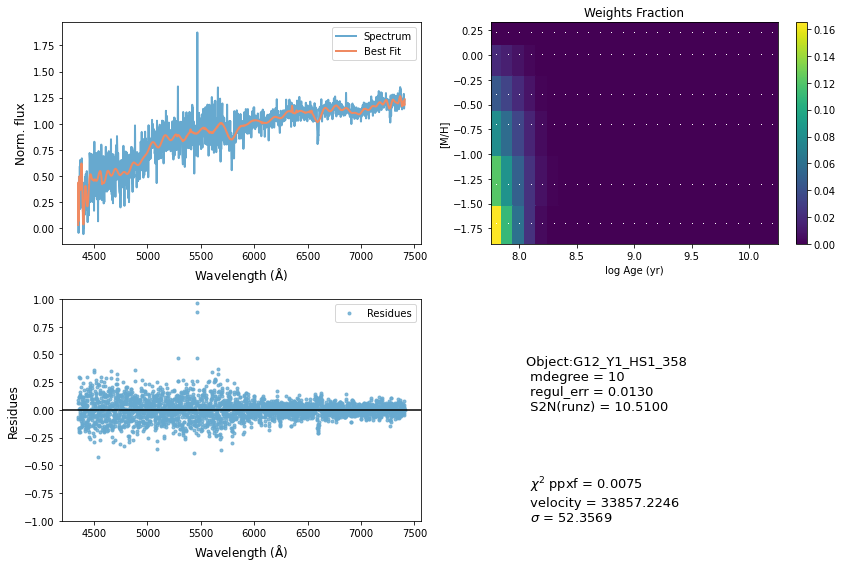

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47130       999     0.030    -0.004
 comp.  1:     47025       818
 comp.  2:     46155       631
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00287
method = capfit; Jac calls: 11; Func calls: 224; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       3.53       7.9   47025   818
Comp:  2       Unknown       2175        62   46155   631
Comp:  2       Unknown      3.718        68   46155   631
Comp:  2       Unknown          0       8.8   46155   631
Comp:  2       Unknown          0       4.6   46155   631
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.293
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.293
M/L_r: 2.411
Current $\chi^2$: 0.0029
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


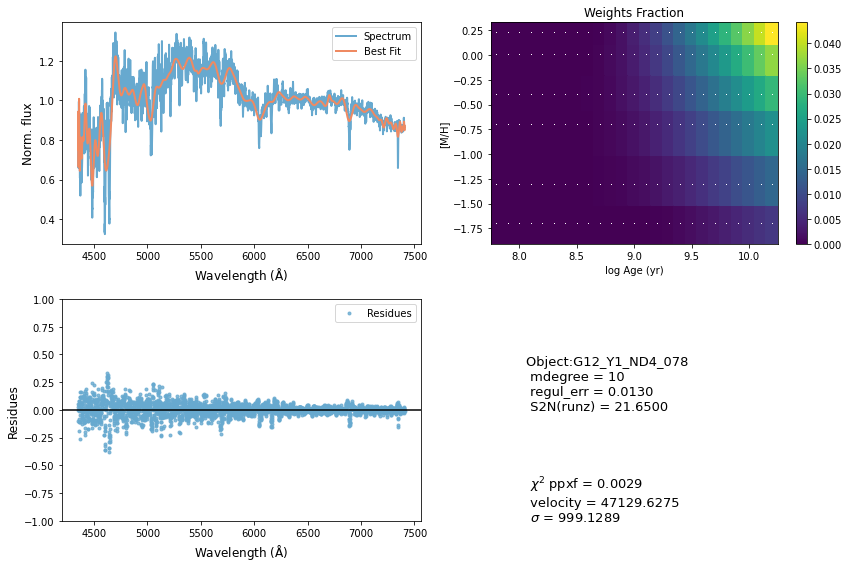

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57898        15     0.006     0.012
 comp.  1:     57879       180
 comp.  2:     57831        18
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01551
method = capfit; Jac calls: 7; Func calls: 145; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1928       3.1   57879   180
Comp:  2       Unknown    0.08825       4.9   57831    18
Comp:  2       Unknown          0       4.8   57831    18
Comp:  2       Unknown     0.4166       2.6   57831    18
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -1.11
M/L_r: 1.829
Current $\chi^2$: 0.0155
Elapsed time in PPXF: 1.89 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


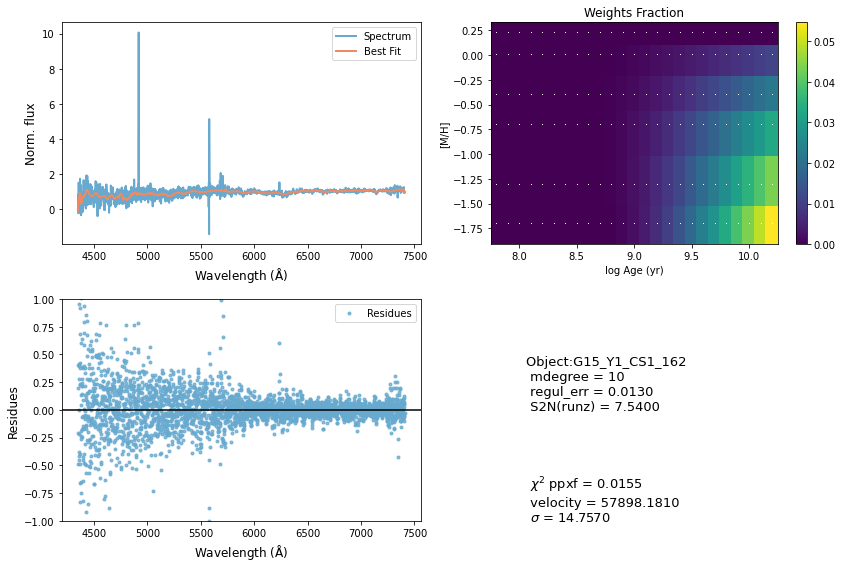

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40216       485    -0.009    -0.007
 comp.  1:     40473       180
 comp.  2:     40473       180
Gas Reddening E(B-V): 0.003
chi2/DOF: 0.004784
method = capfit; Jac calls: 5; Func calls: 104; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.8   40473   180
Comp:  2       Unknown          0       4.2   40473   180
Comp:  2       Unknown          0       2.6   40473   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.221
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.221
M/L_r: 2.943
Current $\chi^2$: 0.0048
Elapsed time in PPXF: 1.42 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


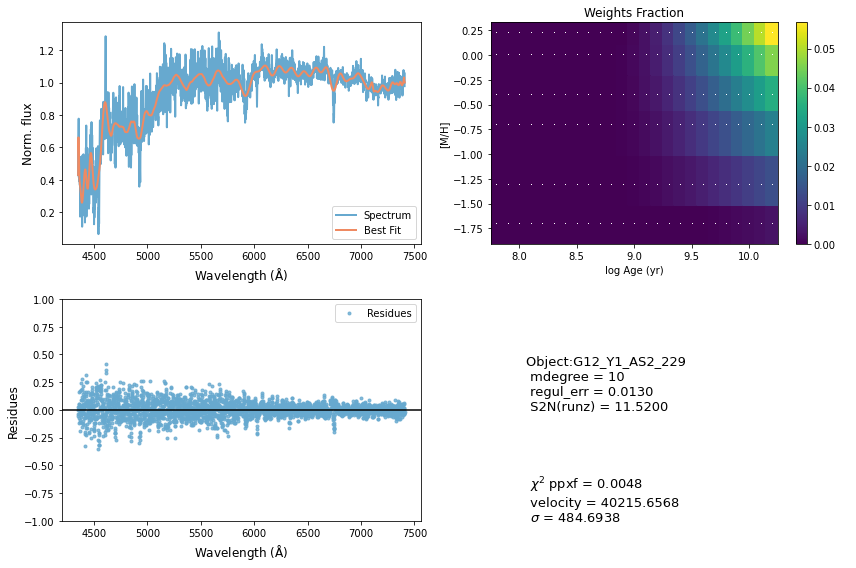

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     73282       909    -0.096     0.019
 comp.  1:     71613       398
 comp.  2:     71327         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005247
method = capfit; Jac calls: 8; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  85 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.095       6.6   71613   398
Comp:  2       Unknown     0.4175       2.4   71327     1
Comp:  2       Unknown          0       2.2   71327     1
Comp:  2       Unknown          0       2.1   71327     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.792
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.792
M/L_r: 1.717
Current $\chi^2$: 0.0052
Elapsed time in PPXF: 2.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


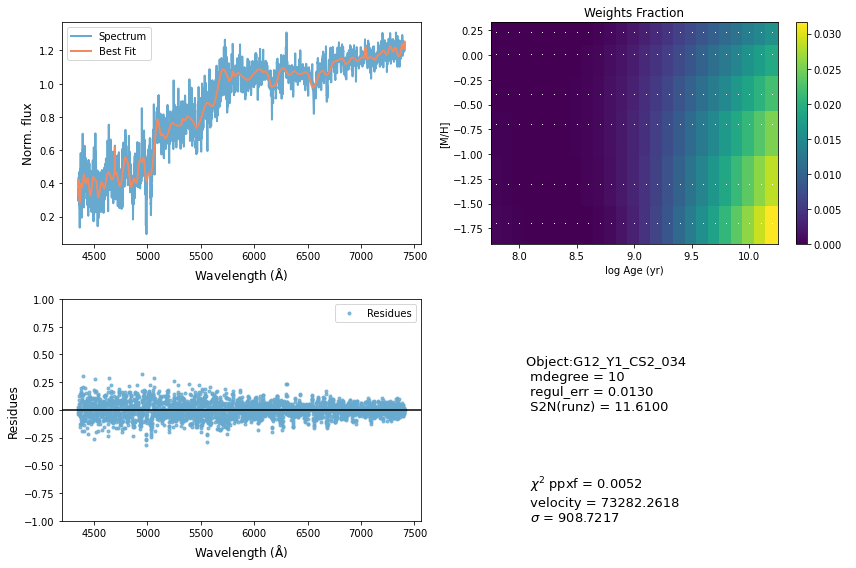

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37885       223    -0.004     0.004
 comp.  1:     38035       285
 comp.  2:     37985       108
Gas Reddening E(B-V): 2.250
chi2/DOF: 0.003559
method = capfit; Jac calls: 8; Func calls: 168; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.287       3.3   38035   285
Comp:  2       Unknown          0       3.3   37985   108
Comp:  2       Unknown     0.5616       2.3   37985   108
---------------------------------------------------------
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: -0.189
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: -0.189
M/L_r: 1.676
Current $\chi^2$: 0.0036
Elapsed time in PPXF: 2.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


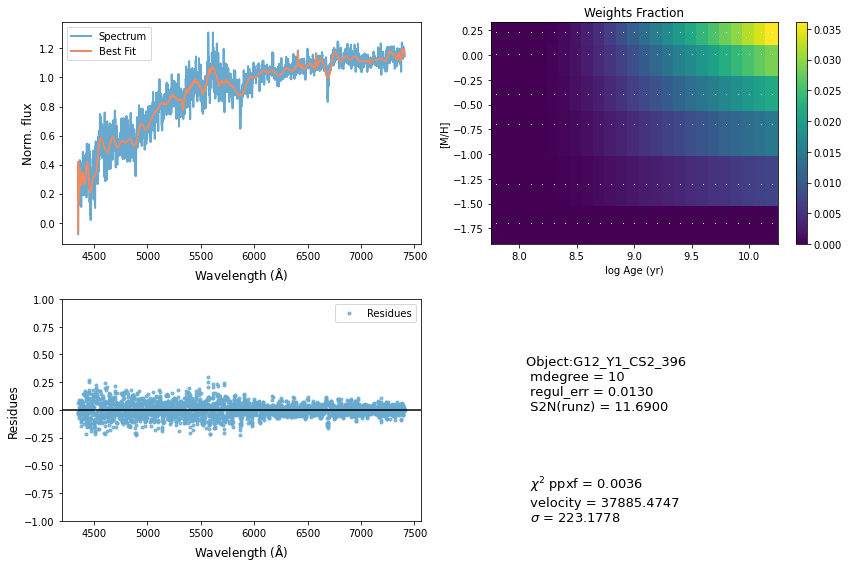

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48120       336     0.010     0.014
 comp.  1:     48233       429
 comp.  2:     48163       156
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008883
method = capfit; Jac calls: 8; Func calls: 172; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  56 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.338       6.1   48233   429
Comp:  2       Unknown          0       6.2   48163   156
Comp:  2       Unknown      3.358       6.4   48163   156
Comp:  2       Unknown     0.2021       4.3   48163   156
Comp:  2       Unknown     0.3957       2.5   48163   156
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.515
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.515
M/L_r: 2.408
Current $\chi^2$: 0.0089
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


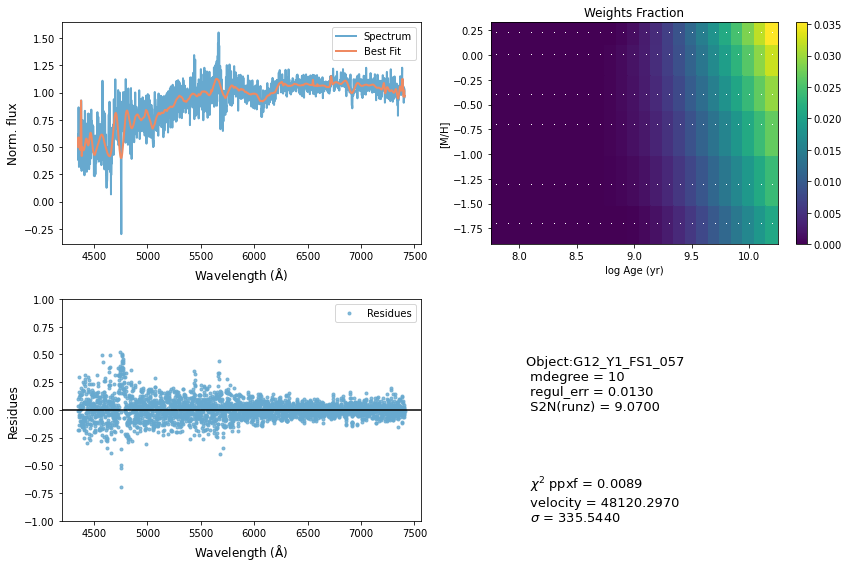

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     32955       380     0.015    -0.011
 comp.  1:     34929       180
 comp.  2:     34905       308
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.003002
method = capfit; Jac calls: 6; Func calls: 127; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   34929   180
Comp:  2       Unknown          0       4.9   34905   308
Comp:  2       Unknown     0.2737         4   34905   308
Comp:  2       Unknown          0       3.4   34905   308
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.248
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.248
M/L_r: 2.555
Current $\chi^2$: 0.0030
Elapsed time in PPXF: 1.44 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


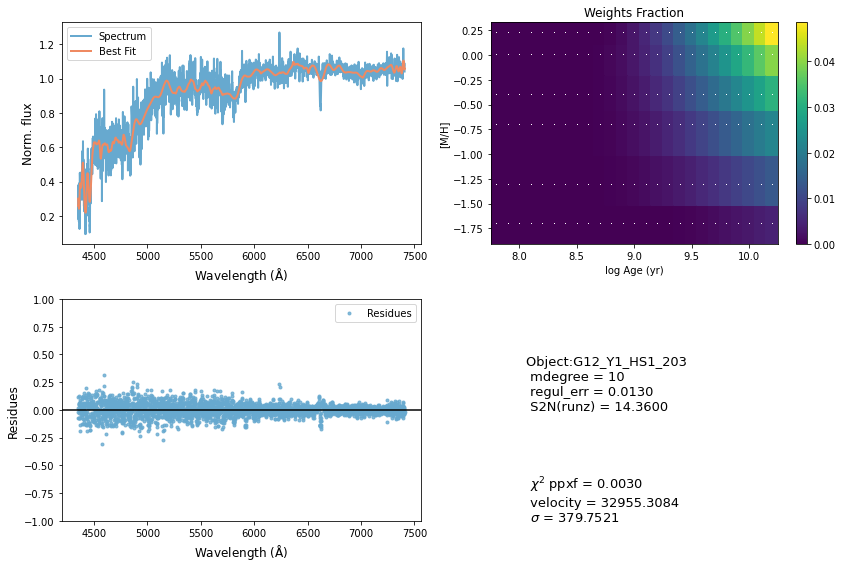

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51576      1000     0.034    -0.041
 comp.  1:     51111       420
 comp.  2:     51468       188
Gas Reddening E(B-V): 4.986
chi2/DOF: 0.006451
method = capfit; Jac calls: 9; Func calls: 190; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.518       2.7   51111   420
Comp:  2       Unknown          0       8.2   51468   188
Comp:  2       Unknown      3.738       8.5   51468   188
Comp:  2       Unknown     0.6635       4.7   51468   188
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.376
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.376
M/L_r: 2.144
Current $\chi^2$: 0.0065
Elapsed time in PPXF: 2.52 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


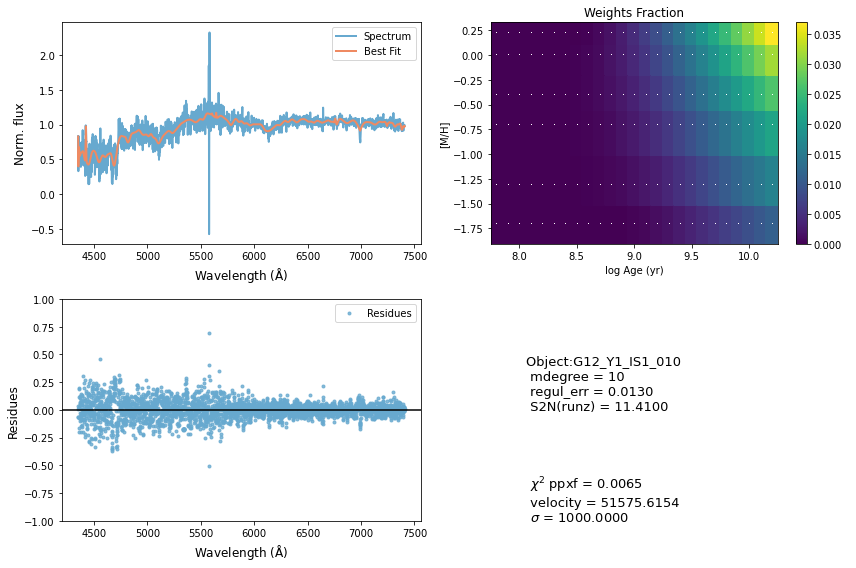

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38662       129    -0.004    -0.000
 comp.  1:     38573        70
 comp.  2:     38727        27
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004042
method = capfit; Jac calls: 10; Func calls: 209; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.616       3.2   38573    70
Comp:  2       Unknown          0       2.3   38727    27
Comp:  2       Unknown     0.3587       1.8   38727    27
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.194
M/L_r: 2.662
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 2.41 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


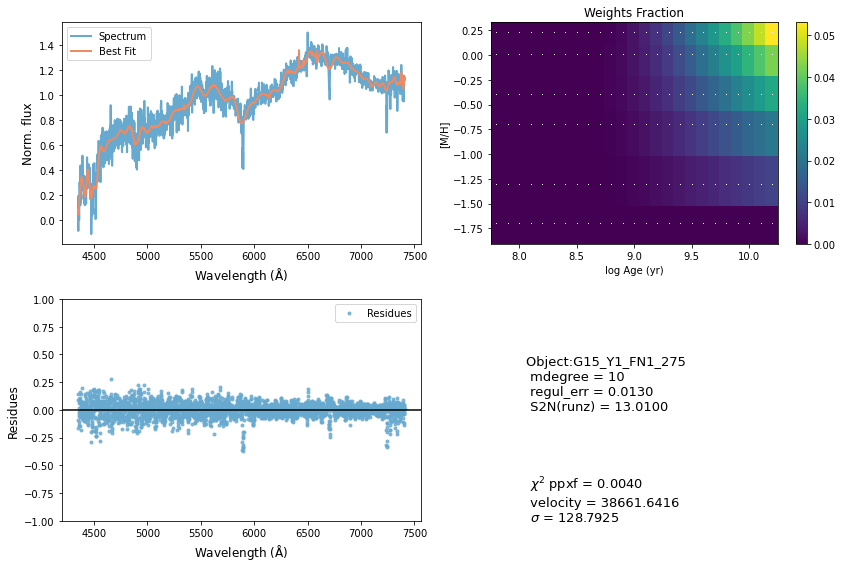

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     77168       196    -0.037    -0.033
 comp.  1:     77178       180
 comp.  2:     77204       229
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005996
method = capfit; Jac calls: 1; Func calls: 22; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  35 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.7   77178   180
Comp:  2       Unknown          0       7.7   77204   229
Comp:  2       Unknown     0.2214       7.7   77204   229
Comp:  2       Unknown          0         4   77204   229
---------------------------------------------------------
Weighted <logAge> [yr]: 8.87
Weighted <[M/H]>: -1.21
Weighted <logAge> [yr]: 8.87
Weighted <[M/H]>: -1.21
M/L_r: 0.3925
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 0.19 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


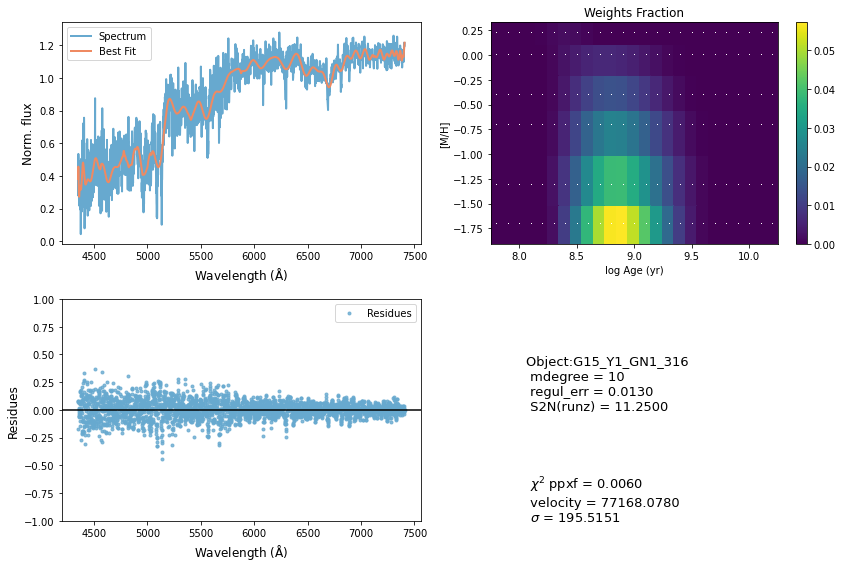

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52199       613    -0.006    -0.039
 comp.  1:     51834       367
 comp.  2:     51325        35
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005515
method = capfit; Jac calls: 12; Func calls: 247; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  92 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.368         6   51834   367
Comp:  2       Unknown          0         3   51325    35
Comp:  2       Unknown          0         3   51325    35
Comp:  2       Unknown     0.4803       2.7   51325    35
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.294
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.294
M/L_r: 1.734
Current $\chi^2$: 0.0055
Elapsed time in PPXF: 3.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


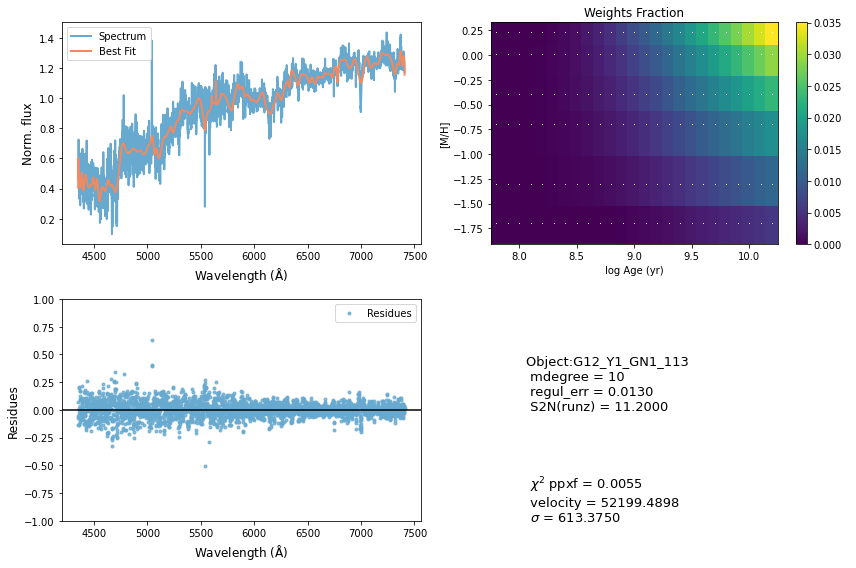

TypeError: can only concatenate str (not "int") to str

In [13]:
start_time = time.time()
ids_vel = ['CATAID']
for each_sed in range(len(seds_list)):
    
    # settings for the progress bar widget above: does not influence in ppxf -------------------------------------
    bar.value += each_sed/2.                                          # signal to increment the progress bar
    if each_sed<len(seds_list): 
        bar.bar_style = ""                                            # blue when in progress
    else: 
        bar.bar_style = "success"                                     # green when it finishes        
        
    # flux -------------------------------------------------------------------------------------------------------
    sed_file  = os.path.join(seds_path, seds_list[each_sed])          # link between path and files
    sed_flux  = pf.getdata(sed_file)[0]                               # opening each spectra
    sed_err   = pf.getdata(sed_file)[1]                               # opening each spectra error
    
    # wavelength -------------------------------------------------------------------------------------------------
    sed_header = pf.open(sed_file)[0].header
    sed_wl_ini = sed_header['WMIN'] 
    sed_wl_stp = sed_header['CD1_1']
    sed_wl     = np.arange(sed_flux.size)*(sed_wl_stp)+sed_wl_ini     # sed wavelength    
#     plot_sed(sed_wl, sed_flux, sed_err)
    
    # cleaning flux and wavelength trash -------------------------------------------------------------------------
    idx_clean       = np.where((np.logical_not(np.isnan(sed_flux)))*(sed_err>0)) # indices where NAN is present
    flux_temp       = sed_flux[idx_clean]                                   # removing NAN values from spectra
    flux_temp_err   = sed_err[idx_clean]
    wavelength_temp = sed_wl[idx_clean]    
#     plot_sed(wavelength_temp, flux_temp, flux_temp_err)
    
    # limiting the spectrum regarding the wavelength range of the library ----------------------------------------
    wl_lib_idx = (wavelength_temp>wl_min) & (wavelength_temp<wl_max)       # MILES wavelength range
    flux       = flux_temp[wl_lib_idx]
    flux_err   = flux_temp_err[wl_lib_idx]
    wavelength = wavelength_temp[wl_lib_idx]    
#     plot_sed(wavelength, flux, flux_err)    
    
    # other important parameters ---------------------------------------------------------------------------------
    redshift  = sed_header['Z']
    cataid    = sed_header['CATAID']
#     fwhm_gama = wavelength*gama_resol
    fwhm_gama = 2.
    
    # ppxf -------------------------------------------------------------------------------------------------------
    vel_scale          = light_speed*np.log(wavelength[1]/wavelength[0])      # velocity scale - 
                                                                              # Eq.8 Capellari 2017
    
    ### setup templates ------------------------------------------------------------------------------------------
    #### stellar pops --------------------------------------------------------------------------------------------
    miles              = lib.miles(miles_lib, vel_scale, fwhm_gama)
    stellar_templates  = miles.templates.reshape(miles.templates.shape[0], -1)
    reg_dim            = miles.templates.shape[1:]
    dv                 = light_speed*(miles.log_lam_temp[0] - np.log(wavelength[0])) # eq.(8) of Cappellari (2017)
    vel                = light_speed*np.log(1 + redshift)                            # eq.(8) of Cappellari (2017)
    start              = [vel, 180.]
    
    #### gas templates -------------------------------------------------------------------------------------------
    wl_range_galaxy = np.array([np.min(wavelength), np.max(wavelength)])/(1 + redshift)
    gas_templates, gas_names, line_wave = util.emission_lines(miles.log_lam_temp, wl_range_galaxy, fwhm_gama, 
                                                              tie_balmer=tied_balmer, 
                                                              limit_doublets=limit_doublets)
    number_of_templates = stellar_templates.shape[1]
    number_of_forbidden = np.sum(["[" in a for a in gas_names])                 # forbidden lines contain "[*]"
    number_of_balmer    = len(gas_names) - number_of_forbidden
        
    component = (stellar_comp_w*number_of_templates)+(balmer_comp_w*number_of_balmer)+(forbid_comp_w
                                                                                       *number_of_forbidden)
        
    gas_component = np.array(component) > 0       # gas_component=True for gas templates
    start3        = [start, start, start]         # adopt the same starting value for the 3 components
    gas_reddening = 0 if tied_balmer else None  # If the Balmer lines are tied one should allow for gas reddening.
    
    
    #### all templates -------------------------------------------------------------------------------------------
    all_templates = np.column_stack([stellar_templates, gas_templates])
    
    ### rebinning the spectrum so it is at the same size as the templates (or smaller) ---------------------------
    new_shape          = stellar_templates[:,0].shape
    rebinning_function = sci.interp1d(wavelength, flux)   # for the flux
    wavelength_rebin   = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_rebin         = rebinning_function(wavelength_rebin)
    
    ### rebinning the error --------------------------------------------------------------------------------------
    rebin_func_error   = sci.interp1d(wavelength, flux_err)
    wl_rebin_error     = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_err_rebin     = rebin_func_error(wavelength_rebin)
    
    ### final galaxy spectrum and its error to be analysed -------------------------------------------------------
    galaxy             = flux_rebin/np.median(flux_rebin)           # Normalize spectrum to avoid numerical issues
    noise              = flux_err_rebin/np.median(flux_err_rebin)       # idem
    
#     plot_sed(wavelength_rebin, galaxy, noise)    
    
    ### SED FITTING WITH PPXF ------------------------------------------------------------------------------------
    start_time = time.clock()
    sed_fit = ppxf(templates=all_templates, galaxy=galaxy, noise=noise, velscale=vel_scale, start=start3, 
                   plot=False, lam=wavelength_rebin, moments=moments, degree=degree, mdegree=mdegree, 
                   regul=1./regul_err, reg_dim=reg_dim, vsyst=dv, clean=False, component=component, 
                   gas_component=gas_component, gas_reddening=gas_reddening)
    end_time = time.clock()
    
    ## output parameters -- most of them will become a dataframe at the end of the script  
    residues = (galaxy-sed_fit.bestfit)
    
    stellar_weights = sed_fit.weights[~gas_component]                       # Exclude weights of the gas templates
    stellar_weights = stellar_weights.reshape(reg_dim)/stellar_weights.sum()  # Normalized
    
    velocity = sed_fit.sol[0][0]
    sigma    = sed_fit.sol[0][1]
    
    mean_age.append(miles.mean_age_metal(stellar_weights)[0])
    mean_metal.append(miles.mean_age_metal(stellar_weights)[1])
    mass2light.append(miles.mass_to_light(stellar_weights, band="r"))
    ids.append(cataid)
    redshifts.append(redshift)
       
    print(r"Current $\chi^2$: %.4f" % (sed_fit.chi2))
    print('Elapsed time in PPXF: %.2f [min]' % ((end_time-start_time)/60))
    
    ### Saving fit results ---------------------------------------------------------------------------------------
    output = {}
    output['wavelength'] = wavelength_rebin
    output['flux']       = sed_fit.galaxy
    output['best_fit']   = sed_fit.bestfit
    
    output_df = pd.DataFrame(output)
    output_df.to_csv(os.path.join(results_path, 'fit_'+str(cataid)+'_d'+ str(degree)+'_'+str(mdegree)+
                                  '_'+str(wl_min) +'.csv'), index=False)
    vel_disp.append(sigma)
    ids_vel.append(cataid)

    ### Saving plots ---------------------------------------------------------------------------------------------
    plt.subplots(figsize=(12,8))
    
    #### plot01 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,1)
    plt.plot(wavelength_rebin, sed_fit.galaxy, '-', color=palette[-1], linewidth=lw, label="Spectrum")
    plt.plot(wavelength_rebin, sed_fit.bestfit, '-', color=palette[0], linewidth=lw, label="Best Fit")
#     plt.title("Object %s: S/N=%.4f" % (cataid, s2n_top10[each_sed]))
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)", fontsize=12)
    plt.ylabel("Norm. flux", fontsize=12)
    
    #### plot02 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,2)
    miles.plot(stellar_weights)
    
    #### plot03 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,3)
    plt.plot(wavelength_rebin, residues, '.', color=palette[-1], linewidth=lw, label="Residues", 
             alpha=transparency)
    plt.axhline(y=0, c='black')
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)", fontsize=12)
    plt.ylabel("Residues", fontsize=12)
    plt.ylim([-1,1])
    
    #### plot04 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,4)
    plt.text(0.1, 0.5, "Object:{:s} \n mdegree = {:d} \n regul_err = {:.4f}\n S2N(runz) = {:.4f}".
             format(sed_header['SPECID'], mdegree, regul_err, sed_header['SN']), fontsize=13)
    plt.text(0.1, 0.0, " \n $\chi^2$ ppxf = {:.4f} \n velocity = {:.4f} \n $\sigma$ = {:.4f}".
             format(sed_fit.chi2, velocity, sigma), fontsize=13)
    plt.axis('off') 

    plt.tight_layout()
    plt.savefig(os.path.join(results_path, 'gal_'+str(cataid)+'_d'+str(degree)+'_'+str(mdegree)+'_'+str(wl_min)
                             +'.png'))
    plt.show()

sigma_data = np.column_stack([ids_vel, vel_disp])
sigma_data = pd.DataFrame(sigma_data)
sigma_data.to_csv('../../LargeFilesResults/PSM_analysis/'+'veldisp_d'+str(degree)+'_m'+str(mdegree)+'.csv')
end_time = time.time()
